# Crime, Education & House Prices in London - An Investigation

## Executive Summary
I wanted to investigate the relationship between crime rates, education levels and house prices in London. 

# Google Maps API Setup

In [2]:
# Testing out the Google Maps Places API
import googlemaps
from datetime import datetime
from uuid import uuid4 as places_autocomplete_session_token
from googlemaps import convert

In [3]:
# Kristoff helped me not lose lots of money by keeping my key secret. shh!
with open('/Users/jason/Desktop/key.txt') as f:
    a = f.readlines()
key = a[-1].split(' ')[-1].split('\\')[-2]

# client key for Google Maps API
gmaps = googlemaps.Client(key=key)

In [4]:
# Google API Code

def _places(client, url_part, query=None, location=None, radius=None,
            keyword=None, language=None, min_price=0, max_price=4, name=None,
            open_now=False, rank_by=None, type=None, region=None, page_token=None):
    """
    Internal handler for ``places``, ``places_nearby``, and ``places_radar``.
    See each method's docs for arg details.
    """

    params = {"minprice": min_price, "maxprice": max_price}

    if query:
        params["query"] = query
    if location:
        params["location"] = convert.latlng(location)
    if radius:
        params["radius"] = radius
    if keyword:
        params["keyword"] = keyword
    if language:
        params["language"] = language
    if name:
        params["name"] = convert.join_list(" ", name)
    if open_now:
        params["opennow"] = "true"
    if rank_by:
        params["rankby"] = rank_by
    if type:
        params["type"] = type
    if region:
        params["region"] = region
    if page_token:
        params["pagetoken"] = page_token

    url = "/maps/api/place/%ssearch/json" % url_part
    return client._request(url, params)

In [5]:
# Google API Code

def places(client, query, location=None, radius=None, language=None,
           min_price=None, max_price=None, open_now=False, type=None, region=None,
           page_token=None):
    """
    Places search.
    :param query: The text string on which to search, for example: "restaurant".
    :type query: string
    :param location: The latitude/longitude value for which you wish to obtain the
        closest, human-readable address.
    :type location: string, dict, list, or tuple
    :param radius: Distance in meters within which to bias results.
    :type radius: int
    :param language: The language in which to return results.
    :type language: string
    :param min_price: Restricts results to only those places with no less than
        this price level. Valid values are in the range from 0 (most affordable)
        to 4 (most expensive).
    :type min_price: int
    :param max_price: Restricts results to only those places with no greater
        than this price level. Valid values are in the range from 0 (most
        affordable) to 4 (most expensive).
    :type max_price: int
    :param open_now: Return only those places that are open for business at
        the time the query is sent.
    :type open_now: bool
    :param type: Restricts the results to places matching the specified type.
        The full list of supported types is available here:
        https://developers.google.com/places/supported_types
    :type type: string
    :param region: The region code, optional parameter.
        See more @ https://developers.google.com/places/web-service/search
    :type region: string
    :param page_token: Token from a previous search that when provided will
        returns the next page of results for the same search.
    :type page_token: string
    :rtype: result dict with the following keys:
        results: list of places
        html_attributions: set of attributions which must be displayed
        next_page_token: token for retrieving the next page of results
    """
    return _places(client, "text", query=query, location=location,
                   radius=radius, language=language, min_price=min_price,
                   max_price=max_price, open_now=open_now, type=type, region=region,
                   page_token=page_token)

# Google Maps API - chicken_df3

In [6]:
# creating a list of the 33 London Boroughs, by hand (well, edited by hand from a wikipedia copy/paste)
borough_strings_list = [
'Barking_and_Dagenham',
'Barnet',
'Bexley',
'Brent',
'Bromley',
'Camden',
'City',
'Croydon',
'Ealing',
'Enfield',
'Greenwich',
'Hackney',
'Hammersmith_and_Fulham',
'Haringey',
'Harrow',
'Havering',
'Hillingdon',
'Hounslow',
'Islington',
'Kensington_and_Chelsea',
'Kingston_upon_Thames',
'Lambeth',
'Lewisham',
'Merton',
'Newham',
'Redbridge',
'Richmond_upon_Thames',
'Southwark',
'Sutton',
'Tower_Hamlets',
'Waltham_Forest',
'Wandsworth',
'Westminster']

In [7]:
# **POSSIBLE DELETION** 33 Boroughs as co-ordinates (local authority headquarter location)
Barking_and_Dagenham   = (51.5607,  0.1557)
Barnet                 = (51.6252, -0.1517)
Bexley                 = (51.4549,  0.1505)
Brent                  = (51.5588, -0.2817)
Bromley                = (51.4039,  0.0198)
Camden                 = (51.5290, -0.1255)
City                   = (51.5074, -0.1278)
Croydon                = (51.3714, -0.0977)
Ealing                 = (51.5130, -0.3089)
Enfield                = (51.6538, -0.0799)
Greenwich              = (51.4892,  0.0648)
Hackney                = (51.5450, -0.0553)
Hammersmith_and_Fulham = (51.4927, -0.2339)
Haringey               = (51.6000, -0.1119)
Harrow                 = (51.5898, -0.3346)
Havering               = (51.5812,  0.1837)
Hillingdon             = (51.5441, -0.4760)
Hounslow               = (51.4746, -0.3680)
Islington              = (51.5416, -0.1022)
Kensington_and_Chelsea = (51.5020, -0.1947)
Kingston_upon_Thames   = (51.4085, -0.3064)
Lambeth                = (51.4607, -0.1163)
Lewisham               = (51.4452, -0.0209)
Merton                 = (51.4014, -0.1958)
Newham                 = (51.5077,  0.0469)
Redbridge              = (51.5590,  0.0741)
Richmond_upon_Thames   = (51.4479, -0.3260)
Southwark              = (51.5035, -0.0804)
Sutton                 = (51.3618, -0.1945)
Tower_Hamlets          = (51.5099, -0.0059)
Waltham_Forest         = (51.5908, -0.0134)
Wandsworth             = (51.4567, -0.1910)
Westminster            = (51.4973, -0.1372)

In [8]:
# **POSSIBLE DELETION** The above 33 Borough co-ordinates in an iterable list format
borough_list_coordinates = [Barking_and_Dagenham,Barnet,Bexley,Brent,Bromley,Camden,City,Croydon,Ealing,Enfield,Greenwich,Hackney,Hammersmith_and_Fulham,Haringey
,Harrow,Havering,Hillingdon,Hounslow,Islington,Kensington_and_Chelsea,Kingston_upon_Thames,Lambeth,Lewisham,Merton,Newham
,Redbridge,Richmond_upon_Thames,Southwark,Sutton,Tower_Hamlets,Waltham_Forest,Wandsworth,Westminster]

In [9]:
# Zipped list of borough names and their HQ locations
borough_list = list(zip(borough_strings_list,borough_list_coordinates))

In [10]:
# creating grid_list, a square evenly distributed grid of co-ordinate points across london to help me catch every
# shop in London. The only problems left over are that there may be duplicates, but this is easy to fix later
# also that in dense areas there may be more than 20 shops of the type in that area. To fix this I would need
# to add code to go onto the next page via page_token parameter in the google places api
s_lat = 51.7001
s_lng = -0.5401
i_lat = (51.7-51.35)/20
i_lng = (0.25+0.54)/20
grid_list = []
for j in range(0,21):
    for i in range(0,21):
        grid_list.append((s_lat+(i_lat*-j),s_lng+(i_lng*i)))

In [16]:
# Checking I created it right. Looks good
# len(grid_list)

In [15]:
# creates empty chicken_list, iterates through london grid list coordinates, uses google api places to search
# for 'fried chicken' at each of the 33 HQ locations, then iterates through these google results to grab
# the shop_name, shop_address and shop_co-ordinates

chicken_list = []
for b in grid_list:
    for i in places(gmaps, 'fried chicken', location=(b))['results']:
        chicken_list.append([i['name'],
                             i['formatted_address'],
                             i['geometry']['location']['lat'],
                             i['geometry']['location']['lng']])

In [1113]:
# Saving my scrape results to a csv
#pd.DataFrame(chicken_list, columns=['Name','Address','Latitude','Longitude']).to_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/chicken_441v3.csv')

In [18]:
# Creating a pandas dataframe from the google scrape
import pandas as pd
chicken_df3 =  pd.DataFrame(chicken_list, columns=['Shop','Address','Latitude','Longitude'])
#chicken_df3.shape

In [19]:
# Getting rid of duplicated chicken shops
chicken_df3.drop_duplicates(inplace=True)
#chicken_df3.shape

In [1010]:
# Is this every chicken shop in London? Depends on how densely packed results are 
# (too many for one search on one page result therefore need to run again on the next page token)
chicken_df3.head()

,Shop,Address,Latitude,Longitude
0,Crazy Fried Chicken,"93 Marlowes, Hemel Hempstead HP1 1LF, UK",51.753104,-0.472154
1,Peri Peri Original Chesham,"20 Market Square, Chesham HP5 1ES, UK",51.703890,-0.613568
2,Favorite Chicken,"22 London Rd, Hemel Hempstead HP3 9SB, UK",51.737506,-0.468553
3,Kebab Point Pizza & Fried Chicken,"16 High St, Hemel Hempstead HP1 3AE, UK",51.757860,-0.472150
4,The Pomeroy,"131 White Lion Rd, Amersham HP7 9JY, UK",51.670365,-0.583394


# *GeoPip (IGNORE)

In [20]:
# POSSIBLE DELETION - BLIND ALLEY
# import json

# with open(REVERSE_GEOCODE_DATA) as f:
#     data = json.load(f)

# for feature in data['features']:
#     print(feature['geometry']['type'])
#     print(feature['geometry']['coordinates'])

In [21]:
# POSSIBLE DELETION - BLIND ALLEY
#data['features'][0]

In [22]:
# POSSIBLE DELETION - BLIND ALLEY
# import geopandas as gpd
# boroughs_geo_json = gpd.read_file(REVERSE_GEOCODE_DATA)

In [25]:
# POSSIBLE DELETION - BLIND ALLEY
#boroughs_geo_json

In [24]:
# POSSIBLE DELETION - BLIND ALLEY
#import geopip
#REVERSE_GEOCODE_DATA = '/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/london_boroughs_proper.geojson'

In [26]:
#my_geopip = geopip.GeoPIP(REVERSE_GEOCODE_DATA)

In [27]:
#my_geopip.shapes

In [28]:
#my_geopip.search(lng=0.023192, lat=51.629124)

In [29]:
#geopip.search(lng=11.910248, lat=44.850981)

In [30]:
#tester = geopip._pure.prepare(data['features'][0])

In [31]:
#tester

In [677]:
#from __future__ import absolute_import, division, print_function, unicode_literals
#from ._geo_fkt import bbox
#from ._geo_fkt import p_in_polygon as pure_p_in_polygon

In [32]:
#geopip._geopip.p_in_polygon((51.55887287010728, 0.1464799701072778), tester)

In [33]:
#boroughs_geo_json.iloc[0,4]

In [34]:
#geopip.search_all(51.55887287010728, 0.1464799701072778).

In [35]:
#chicken_list

In [36]:
# coordinates_list_2 = []

# for i in chicken_list:
#     coordinates_list_2.append((i[2]['location']['lat'],i[2]['location']['lng']))

In [37]:
# pd.DataFrame(coordinates_list_2, columns=['lat','lng']).to_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/coord_list_2.csv')

In [38]:
# (chicken_list[0][2]['location']['lat'],chicken_list[0][2]['location']['lng'])

In [39]:
# from lib import PostCodeClient

In [40]:
# import postcodes_io_api
# api  = postcodes_io_api.Api(debug_http=True)
# data = api.get_postcode('SW112EF')

In [41]:
# data = api.get_bulk_reverse_geocode(payload_data)

In [42]:
# payload_data = {
# "geolocations":
# [
#     {
#         "longitude": 0.629834723775309,
#         "latitude": 51.7923246977375
#     },
#     {
#         "longitude": -2.49690382054704,
#         "latitude": 53.5351312861402,
#         "radius": 1000,
#         "limit": 5
#     }
# ]
# }

# Postcodes.io - coffee_df3, borough_df

In [46]:
import requests
from pprint import pprint

In [49]:
# This is the postcodes.io api that takes in the chicken shop co-ordinates and returns the borough for each row
# HASHED OUT THE SCRAPER

# borough_list_4 = []
# url = 'https://api.postcodes.io/postcodes'
# for i in chicken_df3.iterrows():
#     params = dict(lat=i[1][2],lon=i[1][3])
#     r_ = requests.get(url=url, params=params)
#     try:
#         borough_list_4.append(r_.json()['result'][0]['admin_district'])
#     except:
#         borough_list_4.append('FAIL')

In [51]:
# Used this to figure out how to parse the json to get what I wanted, which was the borough, or as they call
# it in the postcodes.io api 'admin_district': json_['result'][0]['admin_district']
#pprint(json_)

In [53]:
# still figuring out how to parse json
#print(r_.text)
#json_ = r_.json()
#pprint(json_)
#json_['result'][0]['admin_district']

In [54]:
# Saving my postcodes.io borough list to save memory usage, also for prosperity!
#pd.DataFrame(borough_list_4).to_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/Borough_List_5.csv')

In [55]:
# Lots of duplicates in my google api 'scrape' due to the close proximity of the multiple search radiuses, so
# multiple searches pick up the same chicken shops
#len(chicken_list)

In [56]:
# now this should have gotten rid of all duplicated results
#len(chicken_df3)

In [57]:
# Checking I have the right number of rows. I do!
#len(borough_list_4)

In [59]:
# Need to reset my index so I can merge the two dataframes correctly on their respective indices
chicken_df3 = chicken_df3.reset_index(drop=True)

In [60]:
# Time to add the borough names from postcodes.io to the chicken dataframe
chicken_df4 = pd.concat([chicken_df3, pd.DataFrame(borough_list_4)], axis=1, sort=False)

In [61]:
# Rename the newly added column
chicken_df4.rename(columns={0:'Borough'}, inplace=True)

In [62]:
# This check showed me that I have some issues - boroughs outside of London for starters
#chicken_df4.Borough.value_counts()

In [63]:
# making a borough list of just strings so I can get rid of rows in the chicken_df that are outside of London's
# 33 boroughs (my google search went just outside the M25 to make sure I got everything!)
borough_list_5 = list(pd.DataFrame(borough_list)[0])

In [64]:
# This needs to be aligned with how postcodes.io spells the 33 London boroughs
#borough_list_5

In [65]:
# create mask to filter on only boroughs in my borough list
mask_ch = chicken_df4.Borough.isin(borough_list_5)

In [67]:
# Only 25 boroughs, we are missing 8 of them
#print(len(chicken_df4[mask_ch].Borough.unique()))
#chicken_df4[mask_ch].Borough.value_counts()

In [70]:
# This looks good, but we are missing many values due to Borough names misalignment described below
#chicken_df4[mask]

In [71]:
# Used these to check before I drop non-London rows. BUT I found there is an issue - my list of Borough names
# Does not mach up with postcodes.io's names. So I need to align them...
#mask_2 = ~chicken_df4.Borough.isin(borough_list_5)
#chicken_df4[mask_2]

In [72]:
postcodes_io_boroughs = list(chicken_df4.Borough.unique())
#postcodes_io_boroughs

In [73]:
# Finding out the boroughs which are spelt differently
#for i in borough_list_5:
#    if (i in postcodes_io_boroughs) == False:
#        print(i)

In [74]:
# Below was to help me replace the names in the borough list
#j=0
#for i in borough_list_5:
#    print(j,i)
#    j+=1

In [75]:
%% # Renaming Boroughs
borough_list_5[0] = 'Barking and Dagenham'
borough_list_5[6] = 'City of London'
borough_list_5[12] = 'Hammersmith and Fulham'
borough_list_5[19] = 'Kensington and Chelsea'
borough_list_5[20] = 'Kingston upon Thames'
borough_list_5[26] = 'Richmond upon Thames'
borough_list_5[29] = 'Tower Hamlets'
borough_list_5[30] = 'Waltham Forest'
borough_list_5.append('FAIL')

In [81]:
mask = chicken_df4.Borough.isin(borough_list_5)
# at first this resulted in 33 + 1 extra for 'FAIL', need to replace these with correct Boroughs
# re-printed now it is fixed!
#print(len(chicken_df4[mask].Borough.unique()))
#chicken_df4[mask].Borough.value_counts()

In [87]:
chicken_df4.head()

,Shop,Address,Latitude,Longitude,Borough
0,Crazy Fried Chicken,"93 Marlowes, Hemel Hempstead HP1 1LF, UK",51.753104,-0.472154,Dacorum
1,Peri Peri Original Chesham,"20 Market Square, Chesham HP5 1ES, UK",51.703890,-0.613568,Chiltern
2,Favorite Chicken,"22 London Rd, Hemel Hempstead HP3 9SB, UK",51.737506,-0.468553,Dacorum
3,Kebab Point Pizza & Fried Chicken,"16 High St, Hemel Hempstead HP1 3AE, UK",51.757860,-0.472150,Dacorum
4,The Gate,"Rickmansworth Rd, Chorleywood, Rickmansworth W...",51.658569,-0.502753,Three Rivers


In [77]:
# This was to help fix the Boroughs for those which failed during postcodes.io api
#chicken_df4[chicken_df4.Borough == 'FAIL']

In [79]:
# Renaming Boroughs
chicken_df4.at[119, 'Borough'] = 'Epping Forest'
chicken_df4.at[158, 'Borough'] = 'Broxbourne'
chicken_df4.at[197, 'Borough'] = 'Newham'
chicken_df4.at[468, 'Borough'] = 'Havering'
chicken_df4.at[471, 'Borough'] = 'Havering'
chicken_df4.at[642, 'Borough'] = 'Thurrock'
chicken_df4.at[705, 'Borough'] = 'Barking'
chicken_df4.at[962, 'Borough'] = 'Spelthorne'
chicken_df4.at[978, 'Borough'] = 'Hounslow'
chicken_df4.at[1156, 'Borough'] = 'Runnymede'
chicken_df4.at[1244, 'Borough'] = 'Spelthorne'
chicken_df4.at[1316, 'Borough'] = 'Elmbridge'
chicken_df4.at[1361, 'Borough'] = 'Kingston upon Thames'

In [82]:
# Final version of chicken df! it all looks good
chicken_df5 = chicken_df4[mask]

In [83]:
# Sort the chicken dataframe to make it more useful to look at
chicken_df5 = chicken_df5.sort_values(['Borough', 'Shop'])

In [84]:
# Reset the index to make it look neater
chicken_df5.reset_index(drop=True, inplace=True)

In [1108]:
# This is how it used to look. If I try again now it won't. Ignore this for now, as I have a saved csv version
# from later on in the final version
chicken_df5.tail()

,Shop,Address,Latitude,Longitude,Borough
1072,Peri Peri King,"65 Great Titchfield St, Fitzrovia, London W1W ...",51.518855,-0.140975,Westminster
1073,Sam's Chicken,"359 Harrow Rd, Maida Hill, London W9 3NA, UK",51.524300,-0.201964,Westminster
1074,Thunderbird Fried Chicken,"29 Villiers St, Charing Cross, London WC2N 6ND...",51.508147,-0.123684,Westminster
1075,Uncle G's Gourmet Fried Chicken - Pop Up,"Unnamed, Paddington, London W2 1PW, UK",51.518544,-0.175658,Westminster
1076,Whyte & Brown,"Kingly Court, Carnaby St, London W1B 5PW, Unit...",51.512510,-0.138664,Westminster


In [88]:
# Just for fun to see all the KFC locations in London...
# Actually, this would make a good test for 100% coverage. I need an official list of all KFC's in London and
# match it against mine. Are there 69 KFC's in London??
# Can't get an exact number without putting in a lot of work, but sense checking it against the find a store
# function of the KFC website it looks like it's in the ballpark!

#print(len(chicken_df5[chicken_df5.Shop == 'KFC']))
#chicken_df5[chicken_df5.Shop == 'KFC']

In [89]:
# There were around 250 starbucks in London in 2014 ... 
# when I do my coffee shop search I can sense check against that number

In [90]:
# Time to do the same for Coffee Shops!
# HASHED OUT THE SCRAPER

# coffee_list = []
# for b in grid_list:
#     for i in places(gmaps, 'coffee shop', location=(b))['results']:
#         coffee_list.append( [i['name'],
#                              i['formatted_address'],
#                              i['geometry']['location']['lat'],
#                              i['geometry']['location']['lng']])

In [91]:
# Saving my scrape results to a csv
#pd.DataFrame(coffee_list, columns=['Name','Address','Latitude','Longitude']).to_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/coffee_8820v2.csv')

In [98]:
# saving the coffee shops scrape from google maps api to a csv for prosperity
#coffee_list = pd.read_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/coffee_8820.csv', index_col=0)

In [101]:
# Creating the coffee dataframe
coffee_df = pd.DataFrame(coffee_list, columns=['Name','Address','Latitude','Longitude'])
coffee_df.tail()

,Name,Address,Latitude,Longitude
8815,Costa Coffee,"Bluewater Pkwy, Dartford, Greenhithe DA9 9ST, UK",51.439495,0.271110
8816,Caffè Nero,"Bluewater Shopping Centre, Bluewater Pkwy, Dar...",51.439129,0.268013
8817,Starbucks,"Unit 007, Bluewater Pkwy, Dartford, Greenhithe...",51.439119,0.270022
8818,Coffee Republic,"Unit 58, Upper Thames Walk, Dartford, Greenhit...",51.438087,0.269482
8819,The Coffee House,"72 High St, Dartford DA1 1DE, UK",51.444138,0.219548


In [103]:
# Checking my scrape... how big was it?
coffee_df.shape

(8820, 4)

In [104]:
# Getting rid of duplicated coffee shops
coffee_df.drop_duplicates(inplace=True)
coffee_df.shape

(2265, 4)

In [106]:
# Look around my dataframe to get a feel of the data
coffee_df.tail()

,Name,Address,Latitude,Longitude
8772,Costa Coffee,"Aisher Way, Sevenoaks TN13 2QS, UK",51.288429,0.165030
8786,Caffè Nero,"112 High St, Sevenoaks TN13 1UZ, UK",51.271107,0.192699
8795,Costa Coffee,"Sevenoaks Rail Station, London Rd, Sevenoaks T...",51.276829,0.182068
8808,Hollybush Cafe,"Hollybush Cl, Sevenoaks TN13 3UH, UK",51.278301,0.199105
8811,Costa Coffee - Sevenoaks,"2 Blighs Ct, Sevenoaks TN13 1DA, UK",51.272066,0.192120


In [107]:
# # This is the postcodes.io api that takes in the chicken shop co-ordinates and returns the borough for each row
# HASHED OUT THE SCRAPER

# borough_list_6 = []
# url = 'https://api.postcodes.io/postcodes'
# for i in coffee_df.iterrows():
#     params = dict(lat=i[1][2],lon=i[1][3])
#     r_ = requests.get(url=url, params=params)
#     try:
#         borough_list_6.append(r_.json()['result'][0]['admin_district'])
#     except:
#         borough_list_6.append('FAIL')

In [108]:
# Preparing my json translation / extraction
#print(r_.text)
#json_ = r_.json()
#pprint(json_)
#json_['result'][0]['admin_district']

In [1127]:
# Saving my postcodes.io borough list to save memory usage, also for prosperity!
#pd.DataFrame(borough_list_6).to_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/Borough_List_7.csv')

In [111]:
# saving borough_list_6 (postcodes.io api categorising the correct borough from the co-ordinates) 
# to csv for prosperity
#borough_list_6 = pd.read_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/Borough_List_6.csv', index_col=0)

In [112]:
# Checking I have the right number of rows. Should have 2265.
len(borough_list_6)

2265

In [113]:
# Need to reset my index so I can merge the two dataframes correctly on their respective indices
coffee_df = coffee_df.reset_index(drop=True)

In [114]:
# Time to add the borough names from postcodes.io to the coffee dataframe
coffee_df = pd.concat([coffee_df, pd.DataFrame(borough_list_6)], axis=1, sort=False)

In [119]:
# Rename the newly added column
coffee_df.rename(columns={'0':'Borough'}, inplace=True)

In [120]:
coffee_df.tail()

,Name,Address,Latitude,Longitude,Borough
2260,Costa Coffee,"Aisher Way, Sevenoaks TN13 2QS, UK",51.288429,0.165030,FAIL
2261,Caffè Nero,"112 High St, Sevenoaks TN13 1UZ, UK",51.271107,0.192699,Sevenoaks
2262,Costa Coffee,"Sevenoaks Rail Station, London Rd, Sevenoaks T...",51.276829,0.182068,Sevenoaks
2263,Hollybush Cafe,"Hollybush Cl, Sevenoaks TN13 3UH, UK",51.278301,0.199105,FAIL
2264,Costa Coffee - Sevenoaks,"2 Blighs Ct, Sevenoaks TN13 1DA, UK",51.272066,0.192120,Sevenoaks


In [121]:
# This check showed me that I have some issues - boroughs outside of London for starters
#coffee_df.Borough.value_counts()

In [122]:
# create mask to filter on only boroughs in my borough list
mask_co = coffee_df.Borough.isin(borough_list_5)

In [124]:
# All borough are present here, just need to rename the FAILED Boroughs (78 of them... ew!)
# BELOW 2 LINES NOT WORKING... DON'T KNOW WHY OR IF IT'S IMPORTANT... LEAVE FOR NOW
#print(len(coffee_df[mask].Borough.value_counts()))
#coffee_df[mask_co].Borough.value_counts()

In [126]:
# # Making a new dataframe to compare chicken v coffee shops

# PROBLEMS AT THIS POINT, DON"T WORRY THOUGH

# chicken_df_2 = pd.DataFrame(chicken_df4[mask_ch].Borough.value_counts())
# chicken_df_2 = chicken_df_2.sort_index()

# coffee_df_2 = pd.DataFrame(coffee_df[mask_co].Borough.value_counts())
# coffee_df_2 = coffee_df_2.sort_index()

# shops_df = pd.concat([chicken_df_2, coffee_df_2], axis=1, sort=False)
# shops_df.columns = ['Chicken', 'Coffee']
# # Delete the posh index as I might forget to take it out later during modelling
# #shops_df['Posh'] = round(shops_df.Coffee / shops_df.Chicken,1)

In [127]:
# Bringing in another csv to add in more details for the Boroughs (size, population, etc)
borough_details_wiki_df = pd.read_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/Borough_details_wiki.csv')
borough_details_wiki_df['HQ_Co_ordinates'] = borough_list_coordinates
borough_details_wiki_df = borough_details_wiki_df.set_index('Borough')

In [129]:
# New borough df combining everything from google scrape and wiki info
#borough_df = pd.concat([shops_df, borough_details_wiki_df], axis=1, sort=False)
#borough_df.dtypes

In [1435]:
# Saving final borough df to csv
#borough_df.to_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/Final_Borough_incl_CC.csv')

In [131]:
# Reading in saved Borough_df
borough_df = pd.read_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/Final_Borough_incl_CC.csv')

In [132]:
# This was to help fix the Boroughs for those which failed during postcodes.io api
# coffee_df[coffee_df.Borough == 'FAIL']

In [133]:
# To help my manualre-classification of 78 failed Boroughs
#index_list_1 = []
#for index, i in coffee_df[coffee_df.Borough == 'FAIL'].iterrows():
#    index_list_1.append(index)

In [134]:
# To help my manualre-classification of 78 failed Boroughs
#for i in index_list_1:
#    print("coffee_df.at[{}, 'Borough'] = ''".format(i))

In [139]:
# cleaning data by hand
coffee_df.at[34, 'Borough'] = 'Dacorum'
coffee_df.at[93, 'Borough'] = 'Hertsmere'
coffee_df.at[130, 'Borough'] = 'Enfield'
coffee_df.at[160, 'Borough'] = 'Chelmsford'
coffee_df.at[184, 'Borough'] = 'Hertsmere'
coffee_df.at[197, 'Borough'] = 'Enfield'
coffee_df.at[202, 'Borough'] = 'Enfield'
coffee_df.at[216, 'Borough'] = 'Havering'
coffee_df.at[225, 'Borough'] = 'Watford'
coffee_df.at[258, 'Borough'] = 'Havering'
coffee_df.at[295, 'Borough'] = 'Barnet'
coffee_df.at[314, 'Borough'] = 'Amersham'
coffee_df.at[320, 'Borough'] = 'Amersham'
coffee_df.at[323, 'Borough'] = 'Dacorum'
coffee_df.at[334, 'Borough'] = 'Harrow'
coffee_df.at[337, 'Borough'] = 'Barnet'
coffee_df.at[340, 'Borough'] = 'Barnet'
coffee_df.at[421, 'Borough'] = 'Barnet'
coffee_df.at[502, 'Borough'] = 'Harrow'
coffee_df.at[581, 'Borough'] = 'Hillingdon'
coffee_df.at[713, 'Borough'] = 'Ealing'
coffee_df.at[748, 'Borough'] = 'Camden'
coffee_df.at[792, 'Borough'] = 'Hertfordshire'
coffee_df.at[831, 'Borough'] = 'Hillingdon'
coffee_df.at[832, 'Borough'] = 'Hillingdon'
coffee_df.at[841, 'Borough'] = 'Hillingdon'
coffee_df.at[846, 'Borough'] = 'Ealing'
coffee_df.at[945, 'Borough'] = 'Newham'
coffee_df.at[947, 'Borough'] = 'Newham'
coffee_df.at[968, 'Borough'] = 'Newham'
coffee_df.at[981, 'Borough'] = 'Slough'
coffee_df.at[987, 'Borough'] = 'Hillingdon'
coffee_df.at[990, 'Borough'] = 'Hillingdon'
coffee_df.at[992, 'Borough'] = 'Hillingdon'
coffee_df.at[997, 'Borough'] = 'Newham'
coffee_df.at[1025, 'Borough'] = 'Hammersmith and Fulham'
coffee_df.at[1055, 'Borough'] = 'Camden'
coffee_df.at[1104, 'Borough'] = 'Newham'
coffee_df.at[1111, 'Borough'] = 'Newham'
coffee_df.at[1116, 'Borough'] = 'Havering'
coffee_df.at[1121, 'Borough'] = 'Thurrock'
coffee_df.at[1122, 'Borough'] = 'Thurrock'
coffee_df.at[1123, 'Borough'] = 'Thurrock'
coffee_df.at[1127, 'Borough'] = 'Thurrock'
coffee_df.at[1128, 'Borough'] = 'Thurrock'
coffee_df.at[1129, 'Borough'] = 'Thurrock'
coffee_df.at[1139, 'Borough'] = 'Hounslow'
coffee_df.at[1144, 'Borough'] = 'Ealing'
coffee_df.at[1289, 'Borough'] = 'Newham'
coffee_df.at[1292, 'Borough'] = 'Newham'
coffee_df.at[1293, 'Borough'] = 'Newham'
coffee_df.at[1305, 'Borough'] = 'Thurrock'
coffee_df.at[1485, 'Borough'] = 'Hillingdon'
coffee_df.at[1493, 'Borough'] = 'Hillingdon'
coffee_df.at[1661, 'Borough'] = 'Hounslow'
coffee_df.at[1703, 'Borough'] = 'Lambeth'
coffee_df.at[1737, 'Borough'] = 'Lewisham'
coffee_df.at[1763, 'Borough'] = 'Dartford'
coffee_df.at[1767, 'Borough'] = 'Spelthorne'
coffee_df.at[1772, 'Borough'] = 'Spelthorne'
coffee_df.at[1789, 'Borough'] = 'Richmond upon Thames'
coffee_df.at[1875, 'Borough'] = 'Runnymede'
coffee_df.at[1881, 'Borough'] = 'Spelthorne'
coffee_df.at[1917, 'Borough'] = 'Kingston upon Thames'
coffee_df.at[2038, 'Borough'] = 'Bromley'
coffee_df.at[2069, 'Borough'] = 'Runnymede'
coffee_df.at[2072, 'Borough'] = 'Runnymede'
coffee_df.at[2077, 'Borough'] = 'Elmbridge'
coffee_df.at[2146, 'Borough'] = 'Dartford'
coffee_df.at[2148, 'Borough'] = 'Woking'
coffee_df.at[2171, 'Borough'] = 'Kingston upon Thames'
coffee_df.at[2186, 'Borough'] = 'Sutton'
coffee_df.at[2196, 'Borough'] = 'Sutton'
coffee_df.at[2242, 'Borough'] = 'Sutton'
coffee_df.at[2245, 'Borough'] = 'Sutton'
coffee_df.at[2256, 'Borough'] = 'Bromley'
coffee_df.at[2260, 'Borough'] = 'Sevenoaks'
coffee_df.at[2263, 'Borough'] = 'Sevenoaks'

In [140]:
# Cleaning up coffee df to match chicken, preparing for final csv save
coffee_df3 =  coffee_df[mask_co].sort_values(['Borough', 'Name', 'Latitude', 'Longitude'])
coffee_df3.rename(columns={'Name':'Shop'}, inplace=True)
coffee_df3.reset_index(drop=True, inplace=True)

In [141]:
# Saving final chicken df to csv
#chicken_df5.to_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/Final_Chicken_df.csv')

In [142]:
# Saving final coffee df to csv
#coffee_df3.to_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/Final_Coffee_df.csv')

In [144]:
borough_df

,Borough,Chicken,Coffee,Inner,Status,Local authority,Political control,Headquarters,Area (sq mi),Area (sq km),Population (2013 est),Nr. in map,HQ_Co_ordinates
0,Barking and Dagenham,33,25,NaN,NaN,Barking and Dagenham London Borough Council,Labour,"Town Hall, 1 Town Square",13.93,36.078561,194352,25.0,"(51.5607, 0.1557)"
1,Barnet,37,92,NaN,NaN,Barnet London Borough Council,Conservative,"North London Business Park, Oakleigh Road South",33.49,86.738765,369088,31.0,"(51.6252, -0.1517)"
2,Bexley,31,45,NaN,NaN,Bexley London Borough Council,Conservative,"Civic Offices, 2 Watling Street",23.38,60.553966,236687,23.0,"(51.4549, 0.1505)"
3,Brent,46,40,NaN,NaN,Brent London Borough Council,Labour,"Brent Civic Centre, Engineers Way",16.70,43.252833,317264,12.0,"(51.5588, -0.2817)"
4,Bromley,42,91,NaN,NaN,Bromley London Borough Council,Conservative,"Civic Centre, Stockwell Close",57.97,150.141720,317899,20.0,"(51.4039, 0.0198)"
5,Camden,20,69,1.0,NaN,Camden London Borough Council,Labour,"Camden Town Hall, Judd Street",8.40,21.755916,229719,11.0,"(51.529, -0.1255)"
6,City of London,1,14,1.0,City,Corporation of London,NaN,Guildhall,1.12,2.900789,7000,NaN,"(51.5074, -0.1278)"
7,Croydon,67,55,NaN,NaN,Croydon London Borough Council,Labour,"Bernard Weatherill House, Mint Walk",33.41,86.531566,372752,19.0,"(51.3714, -0.0977)"
8,Ealing,40,62,NaN,NaN,Ealing London Borough Council,Labour,"Perceval House, 14-16 Uxbridge Road",21.44,55.529386,342494,13.0,"(51.513, -0.3089)"
9,Enfield,36,60,NaN,NaN,Enfield London Borough Council,Labour,"Civic Centre, Silver Street",31.74,82.206283,320524,30.0,"(51.6538, -0.0799)"


# Crime Dataset 2008 - 2016 - crime_df

In [145]:
# load in the Kaggle London Crime Dataset
crime_df = pd.read_csv('/Users/jason/Downloads/london_crime_by_lsoa.csv')

In [146]:
crime_df = crime_df.sort_values(by=['borough', 'year', 'month', 'major_category', 'minor_category', 'lsoa_code'])

In [147]:
# Quick look at the data
#crime_df.head()

In [148]:
# wow, that's a lot of rows
crime_df.shape

(13490604, 7)

In [149]:
crime_df.head()

,lsoa_code,borough,major_category,minor_category,value,year,month
8973644,E01000006,Barking and Dagenham,Burglary,Burglary in Other Buildings,0,2008,1
5749934,E01000007,Barking and Dagenham,Burglary,Burglary in Other Buildings,0,2008,1
979683,E01000008,Barking and Dagenham,Burglary,Burglary in Other Buildings,0,2008,1
10293026,E01000009,Barking and Dagenham,Burglary,Burglary in Other Buildings,2,2008,1
1863845,E01000010,Barking and Dagenham,Burglary,Burglary in Other Buildings,4,2008,1


In [150]:
crime_df.rename(columns={'borough': 'Borough',
                        'major_category': 'Major_Category',
                        'minor_category': 'Minor_Category',
                        'value': 'Value',
                        'year': 'Year',
                        'month': 'Month'}, inplace=True)

In [151]:
crime_df.head()

,lsoa_code,Borough,Major_Category,Minor_Category,Value,Year,Month
8973644,E01000006,Barking and Dagenham,Burglary,Burglary in Other Buildings,0,2008,1
5749934,E01000007,Barking and Dagenham,Burglary,Burglary in Other Buildings,0,2008,1
979683,E01000008,Barking and Dagenham,Burglary,Burglary in Other Buildings,0,2008,1
10293026,E01000009,Barking and Dagenham,Burglary,Burglary in Other Buildings,2,2008,1
1863845,E01000010,Barking and Dagenham,Burglary,Burglary in Other Buildings,4,2008,1


In [152]:
crime_df['Day_helper'] = 1

In [155]:
crime_df['DateTime'] =  crime_df['Year'].map(str) + '-' +\
                        crime_df['Month'].map(str) + '-' +\
                        crime_df['Day_helper'].map(str)

In [156]:
len(crime_df['DateTime'])

13490604

In [160]:
crime_df.tail()

,lsoa_code,Borough,Major_Category,Minor_Category,Value,Year,Month,Day_helper,DateTime
8381656,E01033604,Westminster,Violence Against the Person,Wounding/GBH,3,2016,12,1,2016-12-1
4310466,E01033605,Westminster,Violence Against the Person,Wounding/GBH,0,2016,12,1,2016-12-1
9740942,E01033606,Westminster,Violence Against the Person,Wounding/GBH,0,2016,12,1,2016-12-1
11776728,E01033607,Westminster,Violence Against the Person,Wounding/GBH,0,2016,12,1,2016-12-1
3902922,E01033608,Westminster,Violence Against the Person,Wounding/GBH,0,2016,12,1,2016-12-1


In [165]:
# This takes a long time to run.... 
crime_df['YYYY_MM'] = [pd.Period(x, 'M') for x in crime_df['DateTime']]

In [170]:
len(crime_df)

13490604

In [173]:
crime_df.tail()

,lsoa_code,Borough,Major_Category,Minor_Category,Value,Year,Month,Day_helper,DateTime,YYYY_MM
8381656,E01033604,Westminster,Violence Against the Person,Wounding/GBH,3,2016,12,1,2016-12-1,2016-12
4310466,E01033605,Westminster,Violence Against the Person,Wounding/GBH,0,2016,12,1,2016-12-1,2016-12
9740942,E01033606,Westminster,Violence Against the Person,Wounding/GBH,0,2016,12,1,2016-12-1,2016-12
11776728,E01033607,Westminster,Violence Against the Person,Wounding/GBH,0,2016,12,1,2016-12-1,2016-12
3902922,E01033608,Westminster,Violence Against the Person,Wounding/GBH,0,2016,12,1,2016-12-1,2016-12


In [168]:
# This should be quicker than the above method but it didn't really seem like it...
# def change_date(x):
#     pd.Period(x, 'M')
# test = crime_df.DateTime.apply(change_date)

In [172]:
# saving as that date conversion takes ages, don't want to do it again!
#crime_df.to_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/crime_df_2.csv')

In [174]:
crime_df.shape

(13490604, 10)

In [766]:
# making a quick subset to get a feel of the data
croydon = crime_df[crime_df.borough == 'Croydon']

In [1510]:
#croydon[(croydon.year == 2008) & (croydon.major_category == 'Sexual Offences') & (croydon.minor_category == 'Other Sexual')]

In [1509]:
pd.options.display.max_rows = 10000
#croydon[(croydon.year == 2008) & (croydon.major_category == 'Burglary') & (croydon.minor_category == 'Burglary in Other Buildings')]

In [775]:
# This is the number of unique lsoa codes in Croydon. This matches up with the burglary data, but the sexual 
# offences data only has 29 out of 220. Does this mean that data was not collected for 191 lsoa areas? 
# surely not... What does it mean though? Perhaps the sexual data was recorded but not at the same granularity
# per lsoa, and so they were aggregated up in the 29? I would like to know but looking at the data the numbers
# make sense, so I will presume that this data is legit
# HOWEVER, this does make me realised I will have to collapse the rows so that each borough only has 1 line per 
# month, not variable amounts up to 220
1194-975+1

220

In [1508]:
#croydon.groupby(['year', 'month', 'major_category']).sum()

In [1507]:
#croydon.groupby(['major_category', 'minor_category', 'year', 'month']).sum()

In [1506]:
#crime_df.groupby(['borough', 'major_category', 'minor_category', 'year']).sum()

In [175]:
# Checking why certain crime categories have consistently less entries... Seems legit
# for i in range(1,13):
#     print(croydon[(croydon.year == 2016) & (croydon.month == i) &
#                   (croydon.major_category == 'Sexual Offences') & (croydon.minor_category == 'Other Sexual')].shape)

In [176]:
# # Checking why certain crime categories have consistently less entries... Seems legit

# for i in range(1,13):
#     print(croydon[(croydon.year == 2008) & (croydon.month == i) &
#                   (croydon.major_category == 'Burglary') & (croydon.minor_category == 'Burglary in Other Buildings')].shape)

In [177]:
# Checking why certain crime categories have consistently less entries... Seems legit
# for i in croydon.major_category.unique():
#     print(croydon[croydon.major_category == i].shape, croydon[croydon.major_category == i].value.sum(), i)

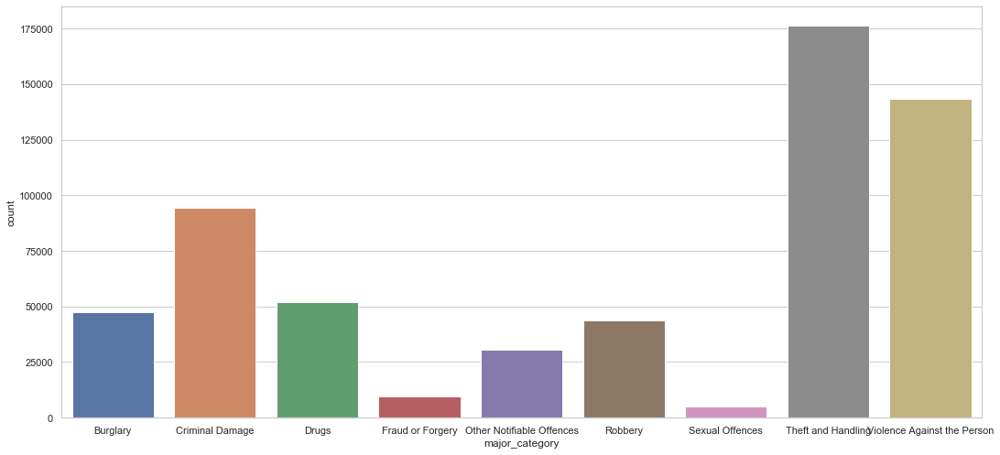

In [773]:
from matplotlib import pyplot
import seaborn as sns

a4_dims = (18, 8.27)
fig, ax = pyplot.subplots(figsize=a4_dims)
ax = sns.countplot(x="major_category", data=croydon)

# House Prices 2008 - 2016 (df_hou)

In [178]:
# assign the land registry csv file to a pandas dataframe variable
df_hou = pd.read_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/pp-complete.csv',
                    header=None)

In [179]:
# re-naming the columns, as the csv didn't come with them
# data from https://www.gov.uk/guidance/about-the-price-paid-data#explanations-of-column-headers-in-the-ppd
df_hou.rename(columns={
                      0: 'TUI',
                      1: 'Price',
                      2: 'Date_of_Transfer',
                      3: 'PostCode',
                      4: 'Property_Type',
                      5: 'Newly_Built',
                      6: 'Tenure',
                      7: 'PAON', # House number or name
                      8: 'SAON', # Flat data
                      9: 'Street',
                      10: 'Locality',
                      11: 'Town/City',
                      12: 'District',
                      13: 'County',
                      14: 'PPD_Category_Type',
                      15: 'Record_Status'}, 
                      inplace=True)

In [180]:
# Original amount of data in the land registry csv. Need to shop this down to size...
df_hou.shape

(24501656, 16)

In [181]:
# dropping rows that are outside of the date range that I am looking at and re-assigning variable
df_hou = df_hou[(df_hou['Date_of_Transfer'] >= '2008-01-01') & (df_hou['Date_of_Transfer'] <= '2016-12-31')]

In [182]:
# Dropped all row data before 2008 and after 2016, so the data matches the Crime database
# and also to make working with the dataframe more managable! My poor laptop can only handle so much data
df_hou.shape

(7113773, 16)

In [188]:
# Changing the date of transfer column to DateTime, which will help me manipulate the data down the road
df_hou['Date_of_Transfer'] = pd.to_datetime(df_hou['Date_of_Transfer'])

In [189]:
# Feature engineering - adding the year and month as separate columns, thanks to the DateTime conversion above
df_hou['Year'] = [i.year for i in df_hou.Date_of_Transfer]
df_hou['Month'] = [i.month for i in df_hou.Date_of_Transfer]

In [191]:
# The housing data still has data for the whole of the country, and I only want London data. The below check
# visualised this problem for me, hashed out now for brevity. I need to filter non-London areas out
#df_hou.District.value_counts()

In [193]:
# I noticed that one of the 33 London boroughs is missing. Turns out that they have decided to name
# Westminster differently than my other data. No problem - pandas replace to the rescue!
#df_hou[df_hou.District.isin([i.upper() for i in borough_list_5])].District.value_counts().count()
df_hou.District.replace('CITY OF WESTMINSTER', 'WESTMINSTER', inplace=True)

In [194]:
# filtering out the non London data by using a pandas mask that checks if the District column contains a 
# Borough that is in my borough_list_5, which contains the 33 boroughs of london
df_hou = df_hou[df_hou.District.isin([i.upper() for i in borough_list_5])]

In [195]:
# I am dropping data from my dataframe ahead of the groupby. I know that I don't want to use these features
# as predictor variables, at least not for now.
df_hou = df_hou.drop(['TUI', 'PAON', 'SAON', 'Street', 'Locality','Town/City',
                        'County', 'PPD_Category_Type', 'Record_Status',], axis=1)

In [196]:
# Sorting the dataframe by borough, year and month
df_hou = df_hou.sort_values(['District', 'Year', 'Month'])

In [197]:
# originally it was 24,501,656 long, then after filter by years it was 7,113,773, now finally after filtering
# by London only we are down to 932,210
df_hou.shape

(932210, 9)

In [1005]:
# Showing a list of the 33 London boroughs as per the crime dataframe, to check against similar for the
# housing dataframe
crime_df.Borough.unique()

array(['Barking and Dagenham', 'Barnet', 'Bexley', 'Brent', 'Bromley',
       'Camden', 'City of London', 'Croydon', 'Ealing', 'Enfield',
       'Greenwich', 'Hackney', 'Hammersmith and Fulham', 'Haringey',
       'Harrow', 'Havering', 'Hillingdon', 'Hounslow', 'Islington',
       'Kensington and Chelsea', 'Kingston upon Thames', 'Lambeth',
       'Lewisham', 'Merton', 'Newham', 'Redbridge',
       'Richmond upon Thames', 'Southwark', 'Sutton', 'Tower Hamlets',
       'Waltham Forest', 'Wandsworth', 'Westminster'], dtype=object)

In [207]:
# mirror image to the above, showing boroughs contained in the housing dataframe. Preparatory step before
# I replace the Borough names in the housing dataframe with their counterparts from the crime dataframe
df_hou.District.unique()

array(['Barking and Dagenham', 'Barnet', 'Bexley', 'Brent', 'Bromley',
       'Camden', 'City of London', 'Croydon', 'Ealing', 'Enfield',
       'Greenwich', 'Hackney', 'Hammersmith and Fulham', 'Haringey',
       'Harrow', 'Havering', 'Hillingdon', 'Hounslow', 'Islington',
       'Kensington and Chelsea', 'Kingston upon Thames', 'Lambeth',
       'Lewisham', 'Merton', 'Newham', 'Redbridge',
       'Richmond upon Thames', 'Southwark', 'Sutton', 'Tower Hamlets',
       'Waltham Forest', 'Wandsworth', 'Westminster'], dtype=object)

In [206]:
# Looping through the housing df to replace the boroughs with their counterparts in the crime df
counter = 0
for i in df_hou.District.unique():
    df_hou.District.replace(i, crime_df.Borough.unique()[counter], inplace=True)
    counter += 1

In [209]:
# Feature engineering - after some experimentation I realised this would be better than 2 separate columns
# for later use with groupby.
df_hou['YYYY_MM'] = [pd.Period(x, 'M') for x in df_hou['Date_of_Transfer']]

In [210]:
# Checking the lowercasing of the borough (District) and YYYY_MM worked. It did. Good!
df_hou.head()

,Price,Date_of_Transfer,PostCode,Property_Type,Newly_Built,Tenure,District,Year,Month,YYYY_MM
14946763,184500,2008-01-24,RM9 5UU,T,N,F,Barking and Dagenham,2008,1,2008-01
14950281,159500,2008-01-25,IG11 0PJ,T,N,L,Barking and Dagenham,2008,1,2008-01
14959152,243000,2008-01-25,RM10 9NH,T,N,F,Barking and Dagenham,2008,1,2008-01
14960324,199995,2008-01-15,RM9 4JB,T,N,F,Barking and Dagenham,2008,1,2008-01
14964270,200000,2008-01-16,RM10 7HL,T,N,F,Barking and Dagenham,2008,1,2008-01


In [211]:
# Checking the data types of my houseing dataframe
df_hou.dtypes

Price                        int64
Date_of_Transfer    datetime64[ns]
PostCode                    object
Property_Type               object
Newly_Built                 object
Tenure                      object
District                    object
Year                         int64
Month                        int64
YYYY_MM                     object
dtype: object

In [212]:
# renaming the District column to Borough
df_hou.rename(columns={'District': 'Borough'}, inplace=True)

# *Qualifications 2008 - 2016 (IGNORE)

In [332]:
# load in the data for qualifications
qualifications_df = pd.read_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/GCSE/Qualifications-of-working-age-NVQ.csv', thousands=',')

In [333]:
# Look at the data
qualifications_df.head()

,Code,Area,Year,Qualifications of working age population (16-64),number,denominator,percent,confidence
0,E09000001,City of London,2004,NVQ4+,"3,500",4300,80.6,*
1,E09000002,Barking and Dagenham,2004,NVQ4+,"14,300",101800,14.1,3
2,E09000003,Barnet,2004,NVQ4+,"77,100",206600,37.3,4
3,E09000004,Bexley,2004,NVQ4+,"21,400",134900,15.8,3.3
4,E09000005,Brent,2004,NVQ4+,"43,800",178400,24.5,3.4


In [1349]:
# check data types
#qualifications_df.dtypes

In [1351]:
# Check that the list of Borough names matches what I have
# Result shows that the boroughs match up perfectly, but it has extra grouping layers that I don't need
#for i in qualifications_df.Area.unique():
#    if i not in borough_list_5:
#        print(i)

In [1269]:
# drop rows that contain the above non-london-borough summary data (e.g. Inner London)
mask_q = qualifications_df['Area'].isin(borough_list_5)
qualifications_df = qualifications_df[mask_q]

In [1289]:
# replace commas in numbers with nothing, so I can prepare it to get converted to a number
qualifications_df.number = qualifications_df.number.str.replace(",","")
# convert 'number' columns to numbers - looks like there are some non-numeric rows in there
qualifications_df.number.replace('!', np.nan, inplace=True)
qualifications_df.number.replace('#', np.nan, inplace=True)
qualifications_df.number.replace('~', np.nan, inplace=True)
# convert column from string to float
qualifications_df.number = pd.to_numeric(qualifications_df.number)
# convert column from float to int
qualifications_df.number = qualifications_df.number.astype('Int64')

In [1321]:
# convert 'percent' columns to numbers - looks like there are some non-numeric rows in there
qualifications_df.percent.replace('!', np.nan, inplace=True)
# Need to change percent column from object (string) to numeric
qualifications_df.percent = qualifications_df.percent.astype('float')

In [1331]:
# convert 'confidence' columns to numbers - looks like there are some non-numeric rows in there
qualifications_df.confidence.replace('*', np.nan, inplace=True)
qualifications_df.confidence.replace('!', np.nan, inplace=True)
qualifications_df.confidence.replace('-', np.nan, inplace=True)
# Need to change confidence column from object (string) to numeric
qualifications_df.confidence = qualifications_df.confidence.astype('float')

In [1348]:
# check
#qualifications_df.dtypes

In [1346]:
# look at non numeric values in rows (e.g. city of london), try to understand what's going on
# City of London has a LOT of nan values... oh well. Looks good
#qualifications_df[qualifications_df.isna().any(axis=1)]

In [1344]:
# checking I have all the boroughs represented in the dataframe
for i in qualifications_df.Area.unique():
    if i not in borough_list_5:
        print(i)

In [1385]:
# checking I have all the boroughs represented in the dataframe
#for i in borough_list_5:
#    if i not in qualifications_df.Area.unique():
#        print(i)

In [1354]:
# Raname the columns
qualifications_df.rename(columns={"Qualifications of working age population (16-64)": "Qualification", 
                                  "number"     : "Number",
                                  "denominator": "Denominator",
                                  "percent"    : "Percent",
                                  "confidence" : "Confidence"}, inplace=True)

In [1357]:
# drop code column
qualifications_df.drop('Code', axis=1, inplace=True)

In [1375]:
# checking all possible values for qualification classification - good thing I did...
#qual_type_list = list(qualifications_df.Qualification.unique())

In [1373]:
# cleaning up mistypes headers
qualifications_df.replace('NVQ2 only ','NVQ2 only', inplace=True)
qualifications_df.replace(' NVQ4+ ','NVQ4+', inplace=True)

In [1377]:
# Had to redo this for some reason.. oh well
qualifications_df.Number = qualifications_df.Number.astype('Int64')

In [1383]:
# resetting the index after deleting summary rows
qualifications_df.reset_index(drop=True, inplace=True)

In [1388]:
# saving final Qualification df to to csv
qualifications_df.to_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/Final_Qualifications_df.csv')

# Brexit

In [33]:
import pandas as pd
brexit_df = pd.read_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/Brexit.csv')

# Data Dictionaries

In [ ]:
# impact of financial crisis - mitigte by using cpi / inflation / mortgage rates

In [1452]:
#df_hou.columns

In [213]:
df_hou.shape

(932210, 10)

In [215]:
# This data was downloaded from the below link:
# https://www.gov.uk/guidance/about-the-price-paid-data#explanations-of-column-headers-in-the-ppd
# This dataframe contains details about all properties sold within the UK from 2008 -2016
# The features I am most interested in are Price, Year & Month sold, Borough (District), and property type 
# (I discarded all "other" property types as these seemed to be very odd data).

housing_data_dict = {
'TUI': 'Unique Code for each sale', 
'Price': 'Y VARIABLE - Price property was sold for in GBP', 
'Date_of_Transfer': 'Date property was sold', 
'PostCode': 'Postcode of property', 
'Property_Type': 'Type of property',
'Newly_Built': 'Boolean, yes for newly built (post 19xx*)', 
'Tenure': 'Freehold or Leasehold', 
'PAON': 'Primary address details e.g. flat number', 
'SAON': 'Secondary address details e.g. building name', 
'Street': 'Street address', 
'Locality': 'One level up from town',
'Town/City': 'Town/City', 
'District': 'Borough', 
'County': 'County', 
'PPD_Category_Type': 'TBC',
'Record_Status': 'TBC'
}

In [216]:
#qualifications_df.columns

In [217]:
#qualifications_df.head()

In [219]:
#qualifications_df.shape

In [220]:
# This dataframe will not be used in my project unless I find myself with extra time at the end to figure
# out a way to make it work with my other dataframes. The problem is that the data is stored by year, not by month
# but perhaps there is still a way?

qualifications_data_dict = {
'Area': 'Borough', 
'Year': 'Year', 
'Qualification': '9 levels of education', 
'Number': 'Number of people with qualifications described in Qualification column', 
'Denominator': 'Total number of people in the Borough', 
'Percent': 'Number divided by Denominator, the percent of people in the borough with qualifications in Qualifications column',
'Confidence': 'Confidence interval? Not 100% sure'
}

In [221]:
#crime_df.columns

In [222]:
crime_df.shape

(13490604, 10)

In [223]:
#crime_df.head()

In [224]:
# data was downloaded from https://www.kaggle.com/LondonDataStore/london-crime
# This dataset contains all crimes recorded between 2008 and 2016 for all of London by month, broken down into
# various crime category types (both major and minor). I will only be looking at the major category breakdowns
# also I will be excluding a couple of crime categories as the data looks unreliable

crime_data_dict = {
'lsoa_code': 'Unique code per Borough', 
'borough': 'Borough', 
'major_category': 'Major crime category', 
'minor_category': 'Minor crime category', 
'value': 'How many crimes in said month / Borough',
'year': 'Year', 
'month': 'Month'
}

In [225]:
#borough_df.columns

In [226]:
borough_df.shape

(33, 13)

In [227]:
#borough_df.tail()

In [228]:
# This is a helper dataframe. The chicken and coffee columns were scraped by myself via google maps API
# The rest of the columnds were copied from wikipedia
# It mainly gives information about the various boroughs at one point in time

borough_data_dict = {
'Chicken': 'Number of chicken shops in the borough', 
'Coffee': 'Number of coffee shops in the borough', 
'Inner': 'Is the borough classified as "Inner City"?', 
'Status': 'Does the borough have any special status e.g. City', 
'Local authority': 'Local Authority',
'Political control': 'Which political party is currently in control of the Local Authority', 
'Headquarters': 'Where the Local Authority Headquarters are based', 
'Area (sq mi)': 'The area of the borough in square miles', 
'Area (sq km)': 'The area of the borough in square kilometers',
'Population (2013 est)': 'Population of the Borough, as estimated in 2013', 
'Nr. in map': 'The number associated with the Borough for the common London Borough map', 
'HQ_Co_ordinates': 'LA HQ Co-ordinates'
}

# EDA 1

In [229]:
# Get rid of this from my borough list, I don't need it anymore
borough_list_5.pop()

'FAIL'

In [231]:
# Reminder of how my crime dataframe is looking in it's raw state
crime_df.head()

,lsoa_code,Borough,Major_Category,Minor_Category,Value,Year,Month,Day_helper,DateTime,YYYY_MM
8973644,E01000006,Barking and Dagenham,Burglary,Burglary in Other Buildings,0,2008,1,1,2008-1-1,2008-01
5749934,E01000007,Barking and Dagenham,Burglary,Burglary in Other Buildings,0,2008,1,1,2008-1-1,2008-01
979683,E01000008,Barking and Dagenham,Burglary,Burglary in Other Buildings,0,2008,1,1,2008-1-1,2008-01
10293026,E01000009,Barking and Dagenham,Burglary,Burglary in Other Buildings,2,2008,1,1,2008-1-1,2008-01
1863845,E01000010,Barking and Dagenham,Burglary,Burglary in Other Buildings,4,2008,1,1,2008-1-1,2008-01


In [996]:
# This is the same crime dataframe but grouped by borough, year and month
# This took a while but I finally got there. I had a lot of trouble getting the YYYY_MM columns from the
# crime_df to match up with the house prices df, but the below is what I was after
crime_df[crime_df['Major_Category'] == 'Burglary'].groupby(['Borough', 'YYYY_MM']).sum().head()

Value    Year  Month  Day_helper
Borough              YYYY_MM                                  
Barking and Dagenham 2008-01    134  441760    220         220
                     2008-02    135  441760    440         220
                     2008-03    140  441760    660         220
                     2008-04    124  441760    880         220
                     2008-05    126  441760   1100         220

In [997]:
# reminder of the borough details dataframe
borough_df.head(2)

,Borough,Chicken,Coffee,Inner,Status,Local authority,Political control,Headquarters,Area (sq mi),Area (sq km),Population (2013 est),Nr. in map,HQ_Co_ordinates
0,Barking and Dagenham,33,25,£nan,NaN,Barking and Dagenham London Borough Council,Labour,"Town Hall, 1 Town Square",£14,£36,194352,£25,"(51.5607, 0.1557)"
1,Barnet,37,92,£nan,NaN,Barnet London Borough Council,Conservative,"North London Business Park, Oakleigh Road South",£33,£87,369088,£31,"(51.6252, -0.1517)"


In [ ]:
# The below 9 blocks of code are creating temporary intermediate dataframes in the format that I want them
# so they can be easily merged a little down the road in the crime_price_df, my final df
# there is surely a more elegant way to do this but it works
# I am filtering the crime df on one major crime category type at a time, then grouping by borough and
# year / month, resetting the index, sorting the values, and dropping columns no longer needed

In [243]:
burglary_df = crime_df[crime_df['Major_Category'] == 'Burglary'].groupby(['Borough', 'YYYY_MM']).sum()
burglary_df.reset_index(inplace=True)
burglary_df = burglary_df.sort_values(by=['Borough', 'YYYY_MM'])
burglary_df.drop(columns=['Year', 'Month', 'Day_helper'], inplace=True, axis=1)

In [244]:
crim_dmg_df = crime_df[crime_df['Major_Category'] == 'Criminal Damage'].groupby(['Borough', 'YYYY_MM']).sum()
crim_dmg_df.reset_index(inplace=True)
crim_dmg_df = crim_dmg_df.sort_values(by=['Borough', 'YYYY_MM'])
crim_dmg_df.drop(columns=['Year', 'Month', 'Day_helper'], inplace=True, axis=1)

In [245]:
drugs_df = crime_df[crime_df['Major_Category'] == 'Drugs'].groupby(['Borough', 'YYYY_MM']).sum()
drugs_df.reset_index(inplace=True)
drugs_df = drugs_df.sort_values(by=['Borough', 'YYYY_MM'])
drugs_df.drop(columns=['Year', 'Month', 'Day_helper'], inplace=True, axis=1)

In [246]:
fraud_df = crime_df[crime_df['Major_Category'] == 'Fraud or Forgery'].groupby(['Borough', 'YYYY_MM']).sum()
fraud_df.reset_index(inplace=True)
fraud_df = fraud_df.sort_values(by=['Borough', 'YYYY_MM'])
fraud_df.drop(columns=['Year', 'Month', 'Day_helper'], inplace=True, axis=1)

In [247]:
notable_df = crime_df[crime_df['Major_Category'] == 'Other Notifiable Offences'].groupby(['Borough', 'YYYY_MM']).sum()
notable_df.reset_index(inplace=True)
notable_df = notable_df.sort_values(by=['Borough', 'YYYY_MM'])
notable_df.drop(columns=['Year', 'Month', 'Day_helper'], inplace=True, axis=1)

In [248]:
robbery_df = crime_df[crime_df['Major_Category'] == 'Robbery'].groupby(['Borough', 'YYYY_MM']).sum()
robbery_df.reset_index(inplace=True)
robbery_df = robbery_df.sort_values(by=['Borough', 'YYYY_MM'])
robbery_df.drop(columns=['Year', 'Month', 'Day_helper'], inplace=True, axis=1)

In [249]:
sexual_df = crime_df[crime_df['Major_Category'] == 'Sexual Offences'].groupby(['Borough', 'YYYY_MM']).sum()
sexual_df.reset_index(inplace=True)
sexual_df = sexual_df.sort_values(by=['Borough', 'YYYY_MM'])
sexual_df.drop(columns=['Year', 'Month', 'Day_helper'], inplace=True, axis=1)

In [250]:
theft_df = crime_df[crime_df['Major_Category'] == 'Theft and Handling'].groupby(['Borough', 'YYYY_MM']).sum()
theft_df.reset_index(inplace=True)
theft_df = theft_df.sort_values(by=['Borough', 'YYYY_MM'])
theft_df.drop(columns=['Year', 'Month', 'Day_helper'], inplace=True, axis=1)

In [251]:
violence_df = crime_df[crime_df['Major_Category'] == 'Violence Against the Person'].groupby(['Borough', 'YYYY_MM']).sum()
violence_df.reset_index(inplace=True)
violence_df = violence_df.sort_values(by=['Borough', 'YYYY_MM'])
violence_df.drop(columns=['Year', 'Month', 'Day_helper'], inplace=True, axis=1)

In [2]:
# An example of one of these intermediary dataframes, with the correct amount of rows (check)
violence_df.tail()

In [253]:
# Renaming the groupby sum column so they can be differentiated once they are all merged into the same dataframe
burglary_df.rename(columns={"Value": "Burglary"}, inplace=True)
crim_dmg_df.rename(columns={"Value": "Crim_Dmg"}, inplace=True)
drugs_df.rename(columns={"Value": "Drugs"}, inplace=True)
fraud_df.rename(columns={"Value": "Fraud"}, inplace=True)
notable_df.rename(columns={"Value": "Notable"}, inplace=True)
robbery_df.rename(columns={"Value": "Robbery"}, inplace=True)
sexual_df.rename(columns={"Value": "Sexual"}, inplace=True)
theft_df.rename(columns={"Value": "Theft"}, inplace=True)
violence_df.rename(columns={"Value": "Violence"}, inplace=True)

In [ ]:
#Below are various histograms to get a feel for the distribution of house prices

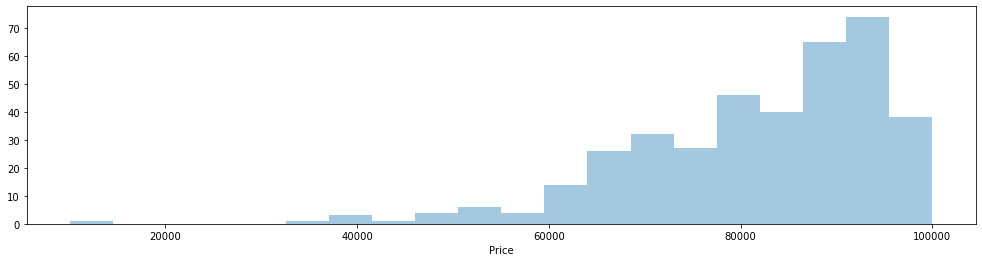

In [786]:
# Properties in 2008 under £100k and is not classified as other - what are these buildings?
# After giving it some thought I will just exclude these results as I don't trust their veracity
fig, ax = pyplot.subplots(figsize=(17,4))
ax = sns.distplot(df_hou[(~df_hou.Property_Type.isin(['O'])) &
                         (df_hou.Price < 100000) &
                         (df_hou.Year == 2008)].sort_values('Price').iloc[:,0], bins=20, kde=False)

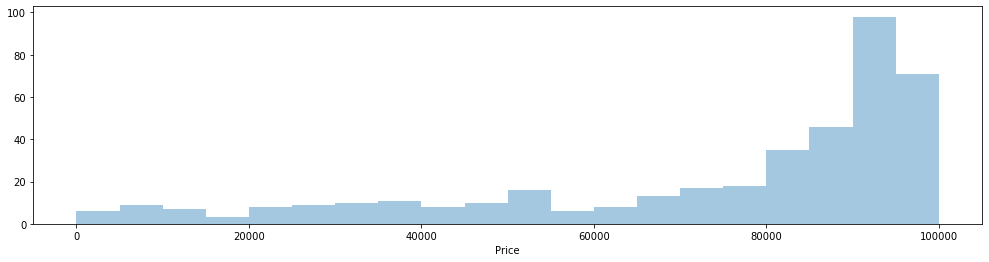

In [787]:
# Properties in 2016 with a price of under £100k and not classified as other
# Too low to be true - parking spaces? inheritance tax avoidance?
# As noted above, after giving it some thought I will just exclude these results as I don't trust their veracity
fig, ax = pyplot.subplots(figsize=(17,4))
ax = sns.distplot(df_hou[(~df_hou.Property_Type.isin(['O'])) &
                         (df_hou.Price < 100000) &
                         (df_hou.Year == 2016)].sort_values('Price').iloc[:,0], bins=20, kde=False)

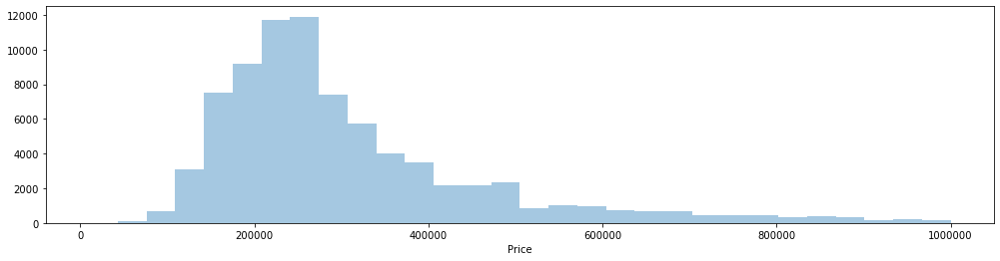

In [782]:
# Properties in 2008 with a price of under £1m and not classified as other
# this distribution looks reasonable and realistic to me, although I expected the peak to be a little
# further to the right, even back in 2008
fig, ax = pyplot.subplots(figsize=(17,4))
ax = sns.distplot(df_hou[(~df_hou.Property_Type.isin(['O'])) &
                         (df_hou.Price < 1000000) &
                         (df_hou.Year == 2008)].sort_values('Price').iloc[:,0], bins=30, kde=False)

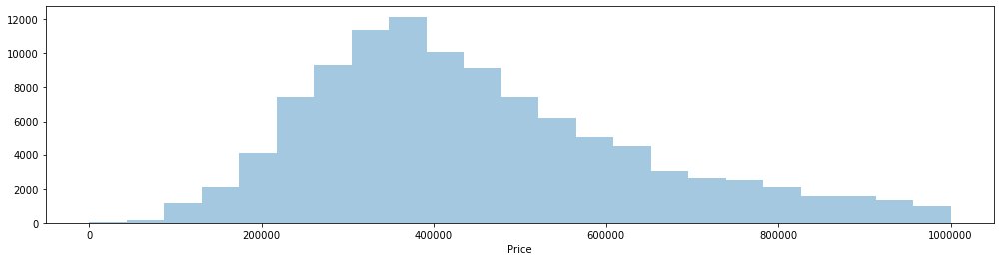

In [783]:
# Properties in 2016 with a price of under £1m and not classified as other
# Looks reasonable to me, the shift to the right is exactly as expected, it also looks as though this
# section of the market has much more transactions going on
fig, ax = pyplot.subplots(figsize=(17,4))
ax = sns.distplot(df_hou[(~df_hou.Property_Type.isin(['O'])) &
                         (df_hou.Price < 1000000) &
                         (df_hou.Year == 2016)].sort_values('Price').iloc[:,0], bins=23, kde=False)

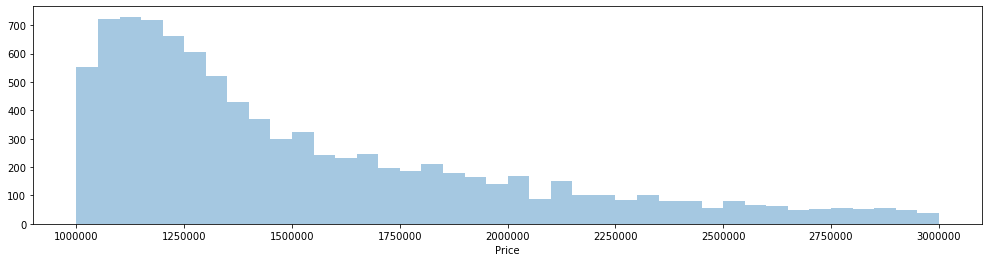

In [809]:
# Sense checking various price ranges, this time just for 2016
# Rich - between £1m and £3m
fig, ax = pyplot.subplots(figsize=(17,4))
ax = sns.distplot(df_hou[(~df_hou.Property_Type.isin(['O'])) &
                         (df_hou.Price > 1000000) & (df_hou.Price < 3000000) &
                         (df_hou.Year == 2016)].sort_values('Price').iloc[:,0], bins=40, kde=False)

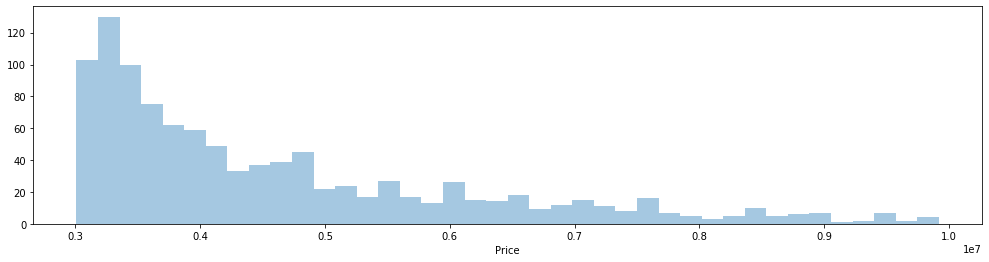

In [808]:
# Sense checking various price ranges, this time just for 2016
# Super rich - between £3m and £10m
fig, ax = pyplot.subplots(figsize=(17,4))
ax = sns.distplot(df_hou[(~df_hou.Property_Type.isin(['O'])) &
                         (df_hou.Price > 3000000) & (df_hou.Price < 10000000) &
                         (df_hou.Year == 2016)].sort_values('Price').iloc[:,0], bins=40, kde=False)

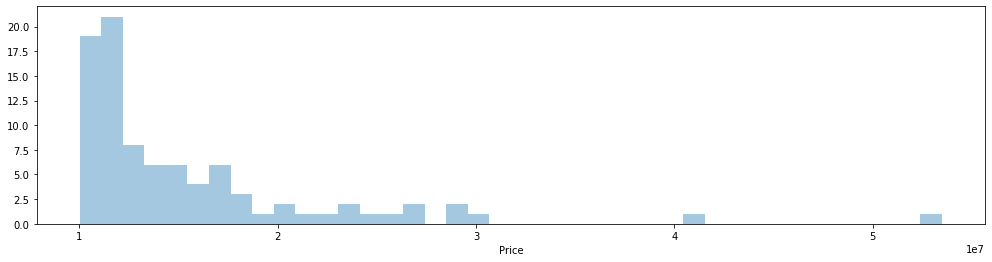

In [804]:
# Sense checking various price ranges, this time just for 2016
# Crazy rich - over £10m
fig, ax = pyplot.subplots(figsize=(17,4))
ax = sns.distplot(df_hou[(~df_hou.Property_Type.isin(['O'])) &
                         (df_hou.Price > 10000000) &
                         (df_hou.Year == 2016)].sort_values('Price').iloc[:,0], bins=40, kde=False)

In [827]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import pyplot

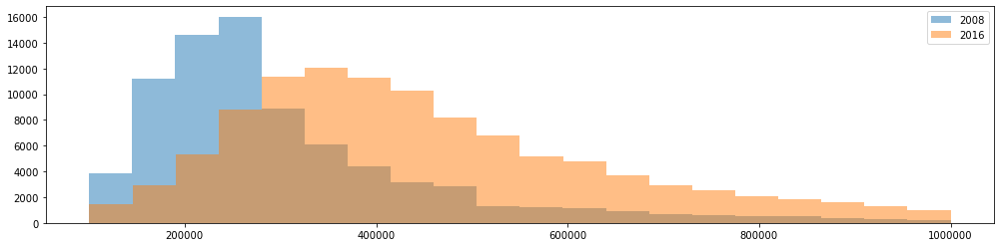

In [1023]:
# Overlaying house price histograms for 2008 and 2016: £100k - £1m range
fig, ax = pyplot.subplots(figsize=(17,4))
pyplot.hist(df_hou[(~df_hou.Property_Type.isin(['O'])) & (df_hou.Price > 100000) & (df_hou.Price < 1000000) &
                         (df_hou.Year == 2008)].sort_values('Price').iloc[:,0], bins=20, alpha=0.5, label='2008')
pyplot.hist(df_hou[(~df_hou.Property_Type.isin(['O'])) & (df_hou.Price > 100000) & (df_hou.Price < 1000000) &
                         (df_hou.Year == 2016)].sort_values('Price').iloc[:,0], bins=20, alpha=0.5, label='2016')
pyplot.legend(loc='upper right')
pyplot.show()

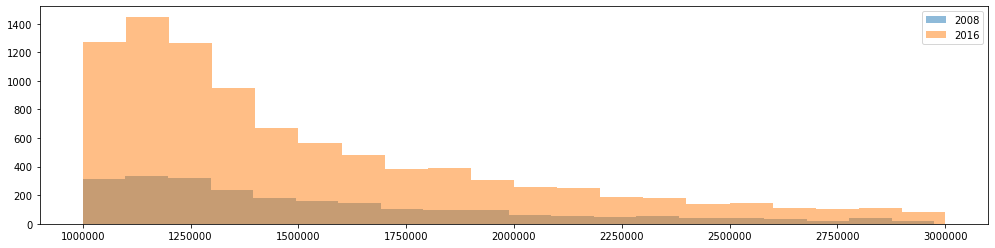

In [1022]:
# Overlaying house price histograms for 2008 and 2016: £1m - £3m range
fig, ax = pyplot.subplots(figsize=(17,4))
pyplot.hist(df_hou[(~df_hou.Property_Type.isin(['O'])) &
                         (df_hou.Price > 1000000) & (df_hou.Price < 3000000) &
                         (df_hou.Year == 2008)].sort_values('Price').iloc[:,0], bins=20, alpha=0.5, label='2008')
pyplot.hist(df_hou[(~df_hou.Property_Type.isin(['O'])) &
                         (df_hou.Price > 1000000) & (df_hou.Price < 3000000) &
                         (df_hou.Year == 2016)].sort_values('Price').iloc[:,0], bins=20, alpha=0.5, label='2016')
pyplot.legend(loc='upper right')
pyplot.show()

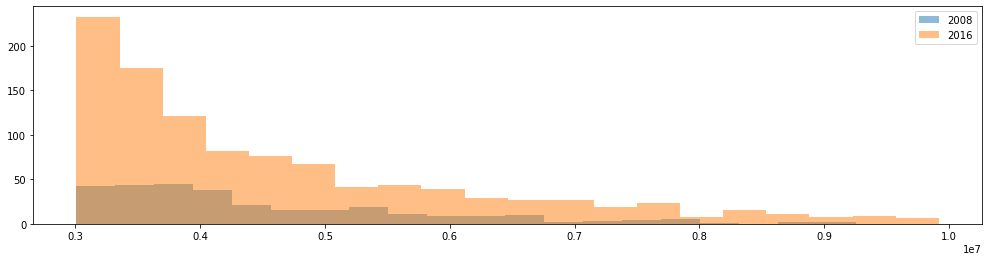

In [1025]:
# Overlaying house price histograms for 2008 and 2016: £3m - £10m range
fig, ax = pyplot.subplots(figsize=(17,4))
pyplot.hist(df_hou[(~df_hou.Property_Type.isin(['O'])) &
                         (df_hou.Price > 3000000) & (df_hou.Price < 10000000) &
                         (df_hou.Year == 2008)].sort_values('Price').iloc[:,0], bins=20, alpha=0.5, label='2008')
pyplot.hist(df_hou[(~df_hou.Property_Type.isin(['O'])) &
                         (df_hou.Price > 3000000) & (df_hou.Price < 10000000) &
                         (df_hou.Year == 2016)].sort_values('Price').iloc[:,0], bins=20, alpha=0.5, label='2016')
pyplot.legend(loc='upper right')
pyplot.show()

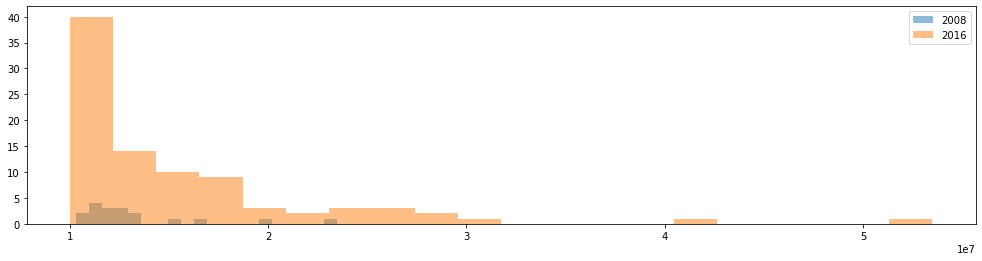

In [1029]:
# Overlaying house price histograms for 2008 and 2016: over £10m range
fig, ax = pyplot.subplots(figsize=(17,4))
pyplot.hist(df_hou[(~df_hou.Property_Type.isin(['O'])) &
                         (df_hou.Price > 10000000) &
                         (df_hou.Year == 2008)].sort_values('Price').iloc[:,0], bins=20, alpha=0.5, label='2008')
pyplot.hist(df_hou[(~df_hou.Property_Type.isin(['O'])) &
                         (df_hou.Price > 10000000) &
                         (df_hou.Year == 2016)].sort_values('Price').iloc[:,0], bins=20, alpha=0.5, label='2016')
pyplot.legend(loc='upper right')
pyplot.show()

In [1030]:
# ATTEMPT AT A 3D HISTOGRAM - LEAVE UNTIL END
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# nbins = 50
# for c, z in zip(['r', 'g', 'b', 'y'], [30, 20, 10, 0]):
#     ys = list(ting)

#     hist, bins = np.histogram(ys, bins=nbins)
#     xs = (bins[:-1] + bins[1:])/2

#     ax.bar(xs, hist, zs=z, zdir='y', color=c, ec=c, alpha=0.8)

# ax.set_xlabel('X')
# ax.set_ylabel('Y')
# ax.set_zlabel('Z')

# plt.show()

In [874]:
# After looking at these graphs I feel like the best thing to do is to just get rid of all properties
# that are under £100,000, as you could never really buy anything for this price in London without it being
# a special case (super low leasehold term, inter-family sale, etc.)

print('{} Rows when no houses are excluded'.format(len(df_hou)))
print('{} Rows when houses under £100k are excluded'.format(len(df_hou[df_hou.Price > 100000])))
print('{} Rows when houses under £100k AND house sales classified as "Other" are excluded'.format(len(df_hou[(df_hou.Price > 100000) & (~df_hou.Property_Type.isin(['O']))])))

932210 Rows when no houses are excluded
921539 Rows when houses under £100k are excluded
912424 Rows when houses under £100k AND house sales classified as "Other" are excluded


In [876]:
# overwriting the df_hou dataframe to drop rows where the property price it was sold for was less than £100,000
# as anything less than this seems like it isn't really a residential property. I checked and the minimum price
# in 2019 for a 1 bed flat in London is £250,000. Back in 2008 I think it is reasonable to extrapolate this
# to a low bar figure of £100k. Also getting rid of properties categories as 'Other', for similar reasons:
# I really want to look at 'normal' residential housing, this should get rid of them
df_hou = df_hou[(df_hou.Price > 100000) & (~df_hou.Property_Type.isin(['O']))]

In [877]:
# creating a groupby dataframe for mean house prices. This will feed into the final df
hou_mean_df = df_hou.groupby(['Borough', 'YYYY_MM']).mean()
hou_mean_df.rename(columns={"Price": "H_Price_Mean"}, inplace=True)

In [878]:
# creating a groupby dataframe for total sum of money for houses sold. This will feed into the final df
hou_sum_df = df_hou.groupby(['Borough', 'YYYY_MM']).sum()
hou_sum_df.rename(columns={"Price": "H_Price_Sum"}, inplace=True)

In [879]:
# creating a groupby dataframe for median house prices. This will feed into the final df
hou_median_df = df_hou.groupby(['Borough', 'YYYY_MM']).median()
hou_median_df.rename(columns={"Price": "H_Price_Median"}, inplace=True)

In [880]:
# resetting the indexes for the 3 intermediary groupby dataframes
hou_sum_df.reset_index(inplace=True)
hou_mean_df.reset_index(inplace=True)
hou_median_df.reset_index(inplace=True)

In [881]:
# dropping the year and month columns, as they have been superceded by the YYYY_MM column
hou_mean_df.drop(columns=['Year', 'Month'], inplace=True, axis=1)
hou_sum_df.drop(columns=['Year', 'Month'], inplace=True, axis=1)
hou_median_df.drop(columns=['Year', 'Month'], inplace=True, axis=1)

In [1031]:
# checking it's worked ok. It has.
hou_sum_df.tail()

,Borough,YYYY_MM,H_Price_Sum
3559,Westminster,2016-08,317515771
3560,Westminster,2016-09,390086242
3561,Westminster,2016-10,339914059
3562,Westminster,2016-11,412021060
3563,Westminster,2016-12,773428780


In [887]:
# Merging all my intermediary dataframes together to the final crime_price_df dataframe
# note - fraud and sexual dataframes were discarded due to unreliable data
crime_price_df = burglary_df.merge(crim_dmg_df['Crim_Dmg'], how='outer', left_index=True, right_index=True)
crime_price_df = crime_price_df.merge(drugs_df['Drugs'], how='outer', left_index=True, right_index=True)
crime_price_df = crime_price_df.merge(notable_df['Notable'], how='outer', left_index=True, right_index=True)
crime_price_df = crime_price_df.merge(robbery_df['Robbery'], how='outer', left_index=True, right_index=True)
crime_price_df = crime_price_df.merge(theft_df['Theft'], how='outer', left_index=True, right_index=True)
crime_price_df = crime_price_df.merge(violence_df['Violence'], how='outer', left_index=True, right_index=True)
crime_price_df = crime_price_df.merge(hou_mean_df['H_Price_Mean'], how='outer', left_index=True, right_index=True)
crime_price_df = crime_price_df.merge(hou_median_df['H_Price_Median'], how='outer', left_index=True, right_index=True)
crime_price_df = crime_price_df.merge(hou_sum_df['H_Price_Sum'], how='outer', left_index=True, right_index=True)

In [898]:
# cheeky little hack to convert to a float so I can display it nicely
crime_price_df.H_Price_Sum = crime_price_df.H_Price_Sum * 1.0

In [934]:
# checking my final dataframe - looks great!
crime_price_df.head()

,Borough,YYYY_MM,Burglary,Crim_Dmg,Drugs,Notable,Robbery,Theft,Violence,H_Price_Mean,H_Price_Sum,H_Price_Median,DateTime
0,Barking and Dagenham,2008-01,134,286,92,14,50,492,440,"£203,898","£43,634,131","£194,475",2008-01-01
1,Barking and Dagenham,2008-02,135,274,118,20,50,477,359,"£199,082","£45,788,954","£195,500",2008-02-01
2,Barking and Dagenham,2008-03,140,235,102,27,56,462,395,"£209,719","£42,363,210","£195,000",2008-03-01
3,Barking and Dagenham,2008-04,124,287,132,23,58,500,398,"£198,477","£40,092,361","£192,000",2008-04-01
4,Barking and Dagenham,2008-05,126,253,99,19,58,491,414,"£195,302","£29,295,365","£195,500",2008-05-01


In [941]:
# creating a datetime column from the YYYY_MM column for future manipulation
crime_price_df['DateTime'] = crime_price_df['YYYY_MM'].values.astype('datetime64[M]')

In [1059]:
# re-ordering the columns, due to me accidentally putting median after sum
# also dropping the YYYY_MM after seeing that it doesn't work well with graphs etc
crime_price_df = crime_price_df[['Borough', 'DateTime', 'Burglary', 'Crim_Dmg', 'Drugs', 'Notable',
                                'Robbery', 'Theft', 'Violence', 'H_Price_Mean', 'H_Price_Median',
                                 'H_Price_Sum']]

In [35]:
# Having a good look over the final dataframe
pd.options.display.float_format = '£{:,.0f}'.format
pd.options.display.max_rows = 3500
crime_price_df

In [937]:
# checking the shape
crime_price_df.shape

(3564, 12)

In [938]:
# Checking the info. Lots of nans in City of London for Fraud and Sexual - have removed now
crime_price_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3564 entries, 0 to 3563
Data columns (total 12 columns):
Borough           3564 non-null object
YYYY_MM           3564 non-null period[M]
Burglary          3564 non-null int64
Crim_Dmg          3564 non-null int64
Drugs             3564 non-null int64
Notable           3564 non-null int64
Robbery           3564 non-null int64
Theft             3564 non-null int64
Violence          3564 non-null int64
H_Price_Mean      3564 non-null float64
H_Price_Median    3564 non-null float64
H_Price_Sum       3564 non-null float64
dtypes: float64(3), int64(7), object(1), period[M](1)
memory usage: 522.0+ KB


In [942]:
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
# badly named, but created a dataframe to base the below graphs on
test_df = crime_price_df.set_index('DateTime')

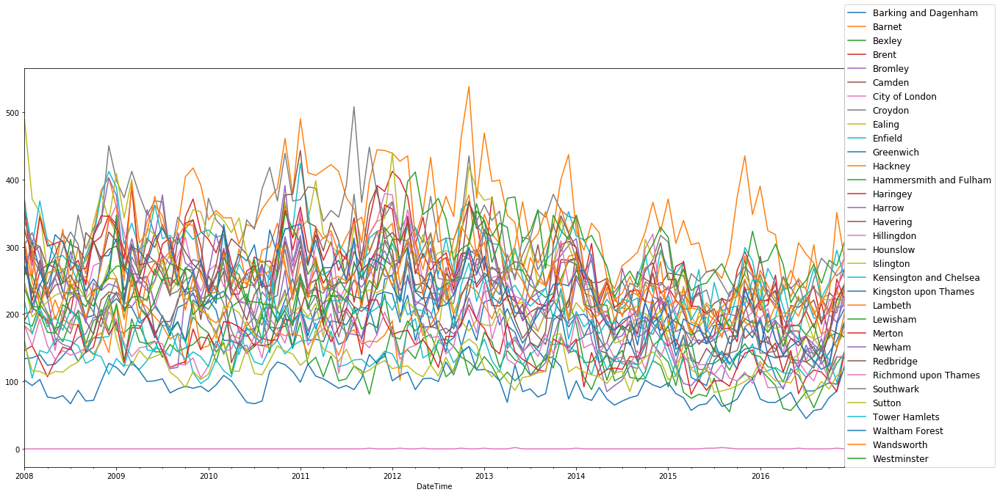

In [947]:
# All boroughs, 2008-2016, per month total number of Burglaries
test_df.groupby(['DateTime', 'Borough'])['Burglary'].mean().unstack().plot(figsize=(20,10), kind='line')
plt.legend(loc=[1,0], fontsize=12);

In [1045]:
# More detail to accompany the above graph, to highlight intersting bits
# can use a similar method for any of the other graphs below
pd.DataFrame(test_df.groupby(['DateTime', 'Borough'])['Burglary']
             .mean()).sort_values('Burglary', ascending=False).head()

,,Burglary
DateTime,Borough,
2012-11-01,Barnet,538
2011-08-01,Croydon,508
2011-01-01,Barnet,490
2008-01-01,Ealing,489
2013-01-01,Barnet,469


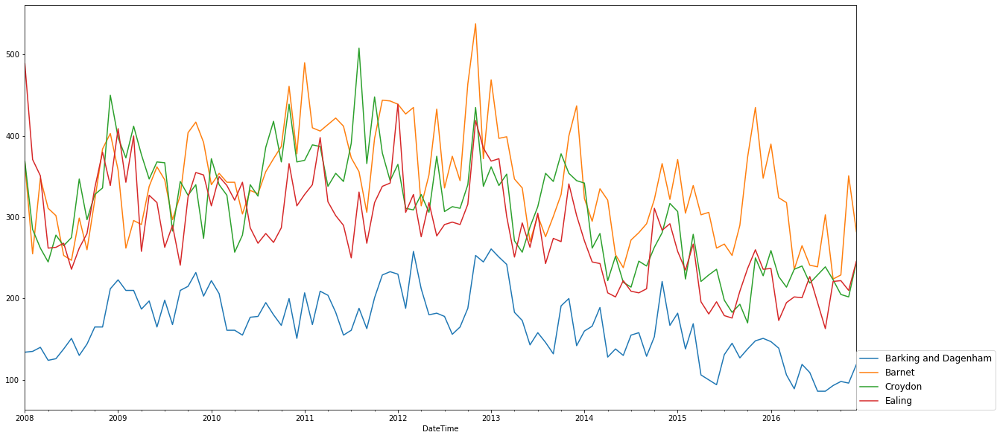

In [1077]:
# subsetting on just a few boroughs to get a closer look
test_df[test_df.Borough.isin(['Barnet', 'Croydon', 'Ealing', 'Barking and Dagenham'])].groupby(['DateTime', 'Borough'])['Burglary'].mean().unstack().plot(figsize=(20,10), kind='line')
plt.legend(loc=[1,0], fontsize=12);

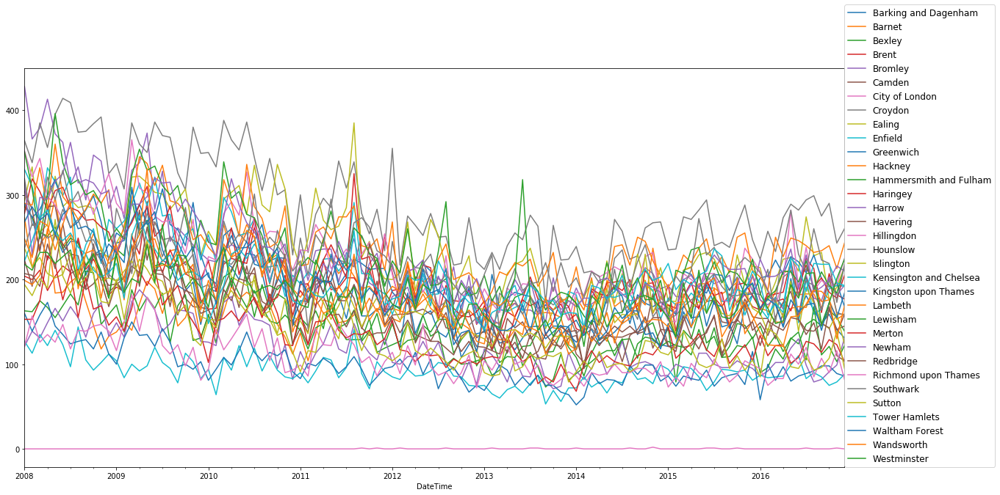

In [948]:
# All boroughs, 2008-2016, per month total number of Criminal Damages
# Trend starts high in 2008, lowers and stabalised from 2013 onwards
test_df.groupby(['DateTime', 'Borough'])['Crim_Dmg'].mean().unstack().plot(figsize=(20,10), kind='line')
plt.legend(loc=[1,0], fontsize=12);

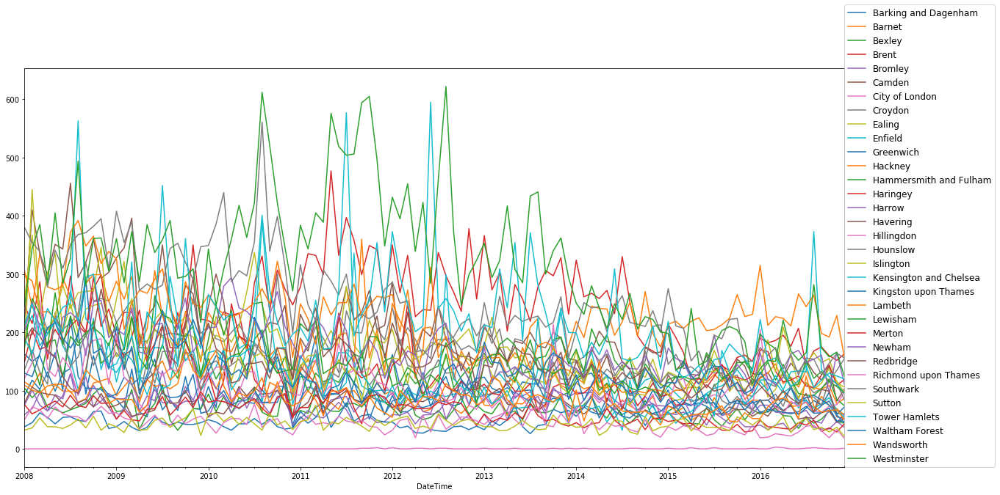

In [949]:
# All boroughs, 2008-2016, per month total number of Drugs related crimes
test_df.groupby(['DateTime', 'Borough'])['Drugs'].mean().unstack().plot(figsize=(20,10), kind='line')
plt.legend(loc=[1,0], fontsize=12);

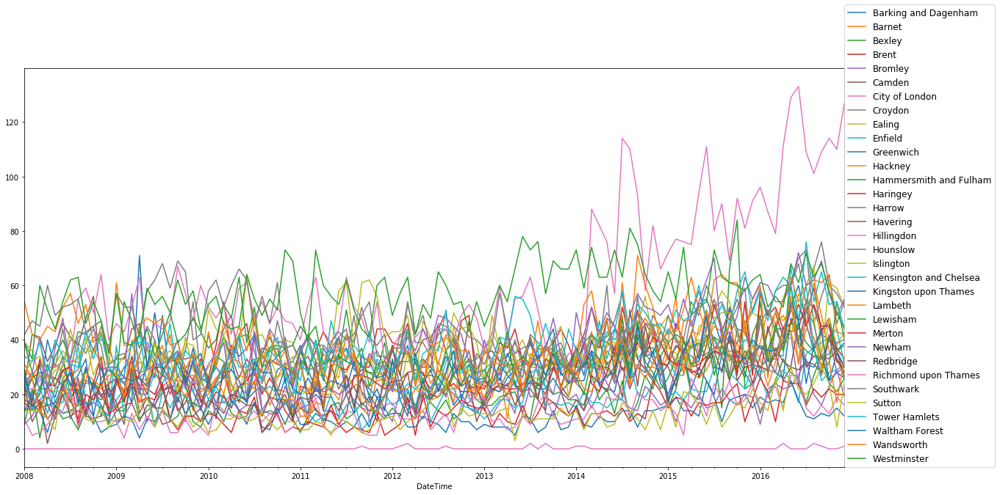

In [950]:
# All boroughs, 2008-2016, per month total number of 'Other Notable' related crimes
test_df.groupby(['DateTime', 'Borough'])['Notable'].mean().unstack().plot(figsize=(20,10), kind='line')
plt.legend(loc=[1,0], fontsize=12);

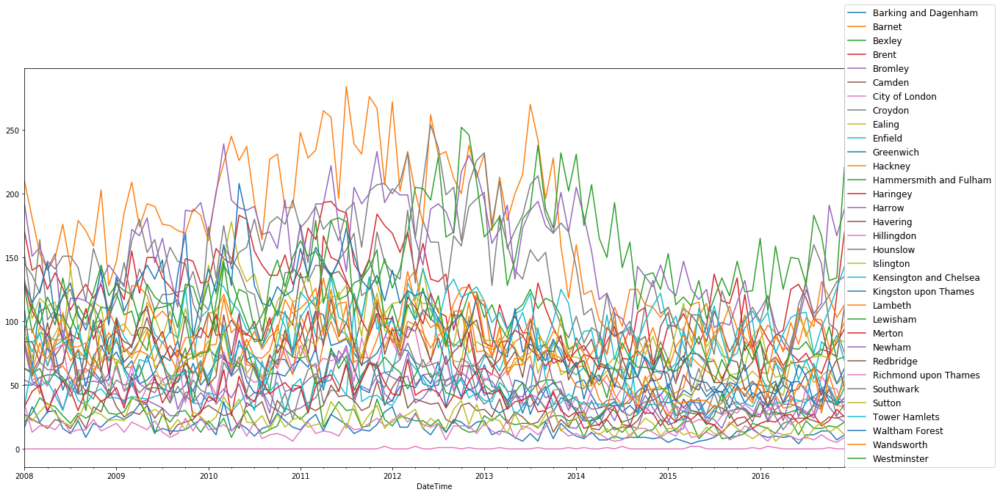

In [951]:
# All boroughs, 2008-2016, per month total number of Robberies
test_df.groupby(['DateTime', 'Borough'])['Robbery'].mean().unstack().plot(figsize=(20,10), kind='line')
plt.legend(loc=[1,0], fontsize=12);

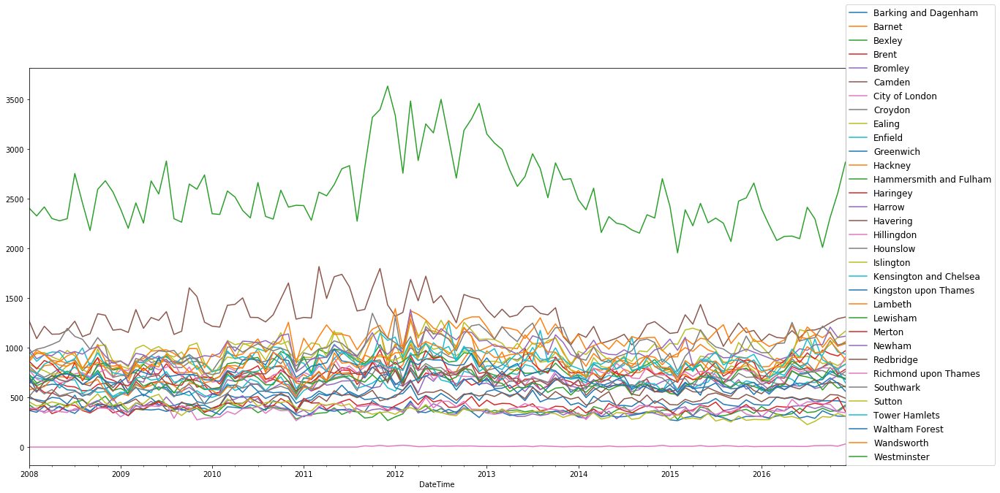

In [952]:
# All boroughs, 2008-2016, per month total number of Thefts
# Westminster is the theft capital of London?!?!?!? Weird...
test_df.groupby(['DateTime', 'Borough'])['Theft'].mean().unstack().plot(figsize=(20,10), kind='line')
plt.legend(loc=[1,0], fontsize=12);

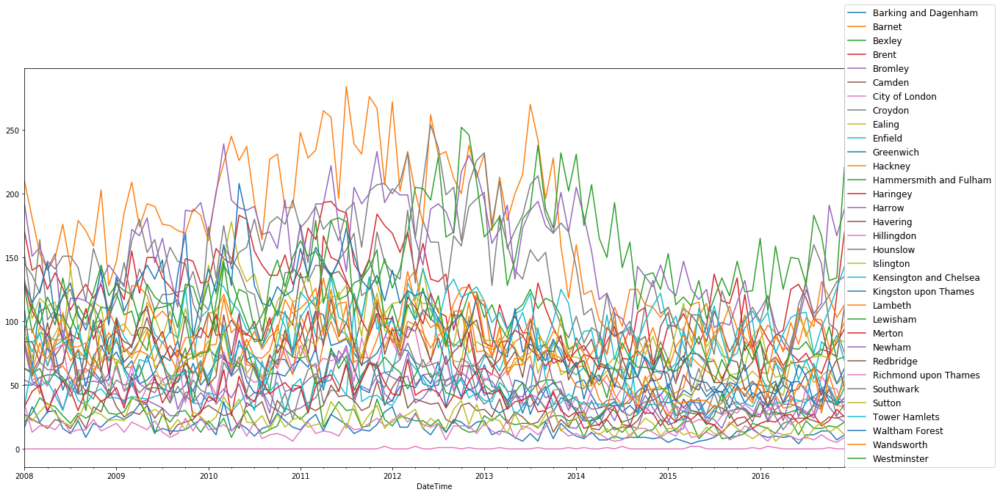

In [953]:
# All boroughs, 2008-2016, per month total number of Robberies
test_df.groupby(['DateTime', 'Borough'])['Robbery'].mean().unstack().plot(figsize=(20,10), kind='line')
plt.legend(loc=[1,0], fontsize=12);

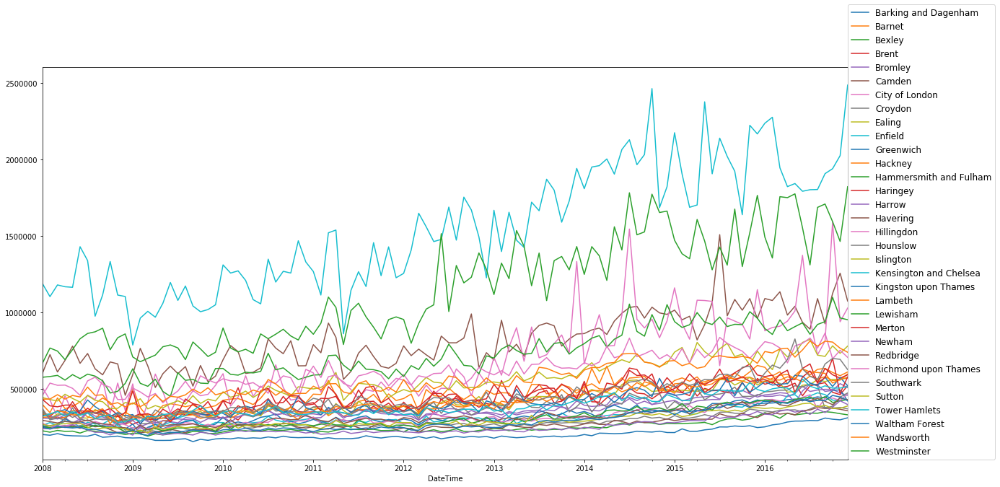

In [1039]:
# All boroughs, 2008-2016, per month mean price of all houses sold in each borough
test_df.groupby(['DateTime', 'Borough'])['H_Price_Mean'].mean().unstack().plot(figsize=(20,10), kind='line')
plt.legend(loc=[1,0], fontsize=12);

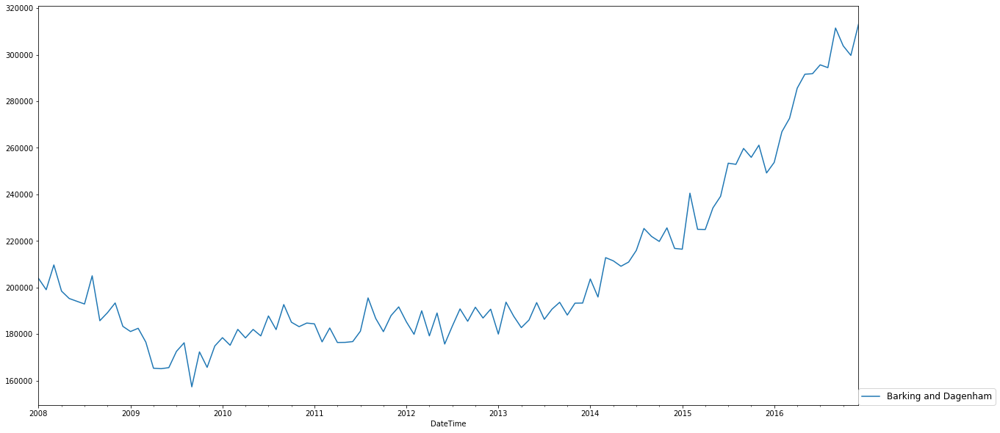

In [1079]:
# Cheapest borough Barking and Dagenham, 2008-2016, per month mean price of all houses sold
test_df[test_df.Borough == 'Barking and Dagenham'].groupby(['DateTime', 'Borough'])['H_Price_Mean'].mean().unstack().plot(figsize=(20,10), kind='line')
plt.legend(loc=[1,0], fontsize=12);

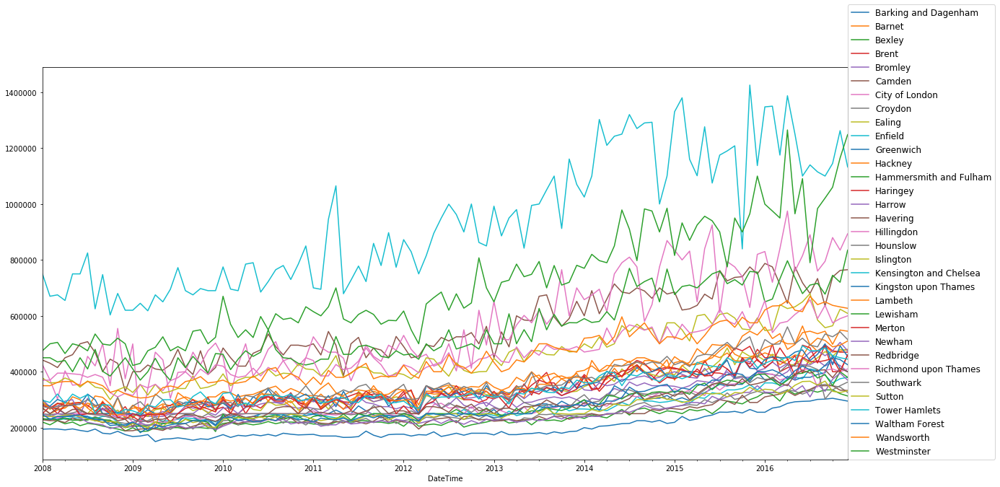

In [959]:
# All boroughs, 2008-2016, per month median price of all houses sold in each borough
test_df.groupby(['DateTime', 'Borough'])['H_Price_Median'].mean().unstack().plot(figsize=(20,10), kind='line')
plt.legend(loc=[1,0], fontsize=12);

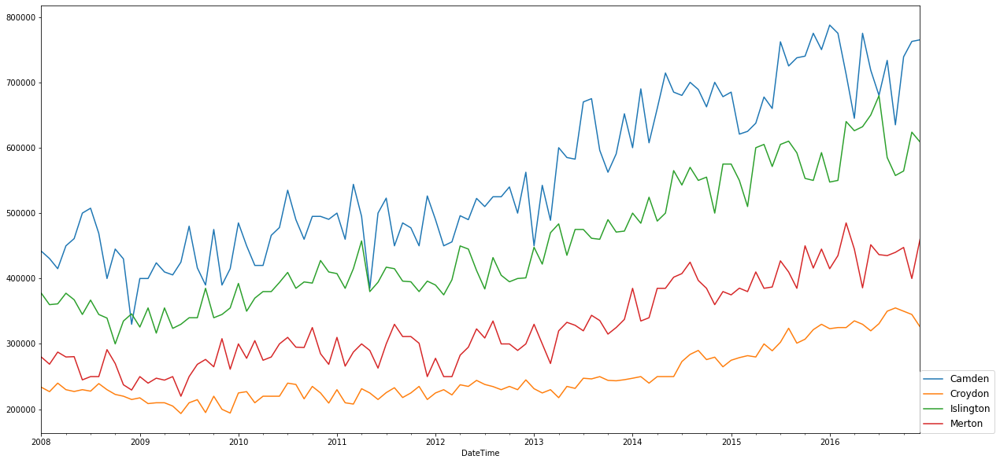

In [962]:
# All boroughs, 2008-2016, per month median price of all houses sold in each borough
# closer look at just a few boroughs to get a better understanding
test_df[test_df.Borough.isin(['Camden', 'Merton', 'Islington', 'Croydon'])].groupby(['DateTime', 'Borough'])['H_Price_Median'].mean().unstack().plot(figsize=(20,10), kind='line')
plt.legend(loc=[1,0], fontsize=12);

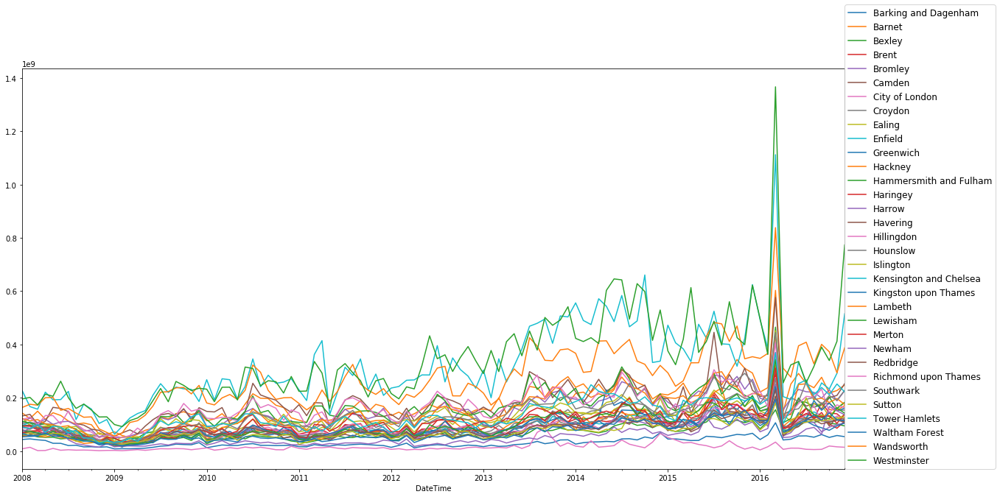

In [960]:
# All boroughs, 2008-2016, per month total sum of all houses sold in each borough
# What happened in early 2016? Some sort of tax change?
test_df.groupby(['DateTime', 'Borough'])['H_Price_Sum'].mean().unstack().plot(figsize=(20,10), kind='line')
plt.legend(loc=[1,0], fontsize=12);

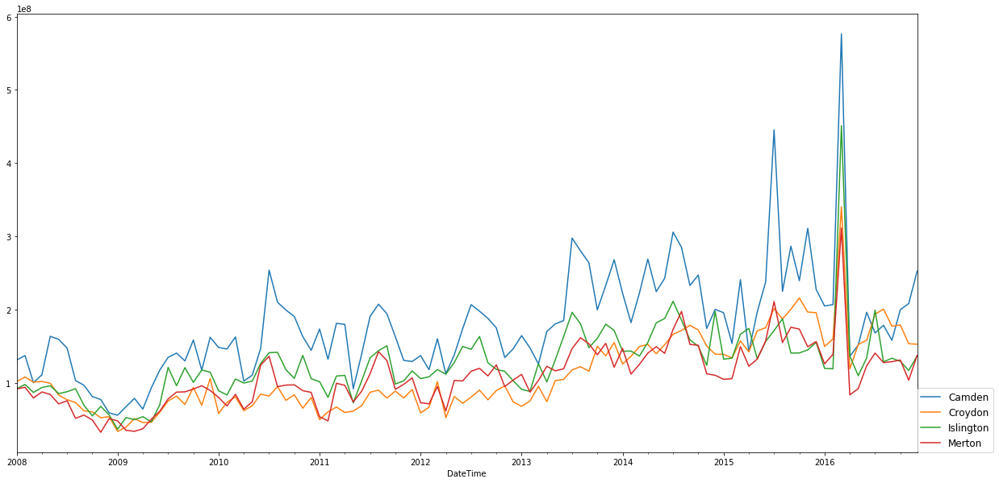

In [963]:
# closer look at the above graph to help make sense of it
test_df[test_df.Borough.isin(['Camden', 'Merton', 'Islington', 'Croydon'])].groupby(['DateTime', 'Borough'])['H_Price_Sum'].mean().unstack().plot(figsize=(20,10), kind='line')
plt.legend(loc=[1,0], fontsize=12);

In [969]:
#crime_price_df.to_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/Final_Crime_Price_df.csv')

# Progress Report

In [91]:
# Progress Report
The data gathering part was about as difficult as I thought it would be - lots of work but technically not too difficult. I found the work enjoyable for the most part, especially learning how to use the Google API to scrape from Google maps.

## Google Maps API
I wanted to find out exactly how many chicken shops and coffee shops there were in London, and thought the best way to find this out was to search on Google Maps for those very terms. It took some time to figure out the quirks of the Google Maps API, but eventually I was happy with how quickly I could scrape results. I put them into a dataframe together with other interesting information about the boroughs, such as area size, population and local authority (labour/conservative). Unfortunately I don't think this data will be that useful in my modelling, since they are at only one point in time (the day I scraped) and the majority of the rest of my data is monthly, though some is yearly. Trying to combine these dataframes together and make models work on them was always going to be a tricky task, but it would have been good to realise this before I put so many hours into avenues that would not add much to the modelling stage of the project. However, I may be able to use them in other ways, so maybe not a total waste. It was fun at least, and I learned a lot. And I have an idea about monthly scrapes of Google Maps to start my own data collection, since it doesn't seem to be readily available elsewhere, why not start making it for myself? Well, there is the costs to start...

## GeoPip / postcodes.io
Wow, what a timesink! Once I had my google scrape data I realised something annoying - the google data had a lot of location information but not one very important bit, the borough. I don't know why this is the case, but I had to do something about it. I had latitude/longitude, town and  postcode data from the Google scrape, and I tried various ways to get the borough information out of them. For example, I looked at the relationship between postcodes and borough - some correlation, but definately not 1!! So that was not accurate enough... I then tried to get a list of all towns and which boroughs they belong to... But guess what? Some towns cover multiple boroughs, and also it was very fiddly for various reasons. I then thought the most accurate way would be to use the lat/long data. I tried many ways of using this, such as APIs and plugins, but nothing seemed to work. I found out about geojsons and polygons, and thought this could be the answer. I found a massive geojson file for the boundaries of London boroughs, and found a plugin called GeoPip that promised to do what I wanted - place a co-ordinate on London map made up of the borough polygons, and GeoPip would figure out which polygon it belonged to, and from that I could extract the borough data. Only one problem - I couldn't get it to work! I emailed the creator of the plugin and he very kindly offered to help. However, the very next day Joanne showed me postcodes.io (which I had previously looked at, but discarded as a viable option as it didn't seem to have the capabilities that I was looking for, and at the point that I first saw it I had been burned about 6 times by very similar looking APIs). But it turned out postcodes.io was the solution I was looking for - it was quick and simple. I wish I had found it earlier! I gave up on any fancy polygon stuff and carried on now that I had my borough data.

## Ready made data!
Early on I knew that the London crime dataset from Kaggle together with London house prices from Land Registry would form the backbone of my project, as they were such rich and large datasets. Maybe this is typical, but I spent way more time on the smaller parts of my project, nice-to-haves, when I really should have put a time limit on exploring them and moved on. Oh well, lesson learned. Those blind alleys were certainly interesting though, and I learned a lot! 

### Crime
The crime dataset was on the whole very good. There were some nan values, in oddly specific and consistent places which makes me think they were gathered like that on purpose. As such I had to lose a couple of columns (fraud and sexual) and also the City of London data looks suspect too, but I have left it in for now.

### London House Prices
What a dream dataset! So many datapoints, no nans, everything makes sense.... Perfect!

### Abandoned (London Census 2011, Qualifications 2008-2016)
I spent a fair bit of time cleaning and getting their data set up in a similar way to the other datasets, but it turned out because they aren't in monthly format that I couldn't match them up with my other data. Shame. Maybe I can still figure out a way to get them involved, but for now I will leave them here, as I am behind and need to get some models on some data! Not to mention make some pretty graphs, as well as a nice story to tell...!

## EDA
Putting the data from the London House Prices together with the London Crime was a far more difficult and time consuming challenge than I had anticipated. Long story short, it took forever! But I eventually got it all working. Once I had done that I did lots of spot checks to make sure everything made sense. I subset on areas that I knew well and made quick and dirty graphs on them to see if their patterns match up with my experience, and when they did I was very relieved!
I then went on to make some pretty graphs to see what kind of patterns emerged. They too matched up to my general expectations. Now it is time to do some modelling!

## Identify Outliers
I have not done this yet. Which techniques to use?...

## Summarize risks and limitations
### Risks
Blah blah blah
### Limitations
Blah blah blah

## Proposed next steps

Describe how your EDA will inform your modeling decisions
What are three concrete actions you need to take next?

SyntaxError: invalid syntax (<ipython-input-91-6435e6dd5c46>, line 2)

# Outliers (Boxplots)

In [971]:
from matplotlib import pyplot

In [10]:
# Use this view for looking in detail at the various outliers to see if they make sense
crime_price_df[crime_price_df.Borough == 'Barnet'].sort_values('Burglary', ascending=False).head()

,Borough,YYYY_MM,Burglary,Crim_Dmg,Drugs,Notable,Robbery,Theft,Violence,H_Price_Mean,H_Price_Median,H_Price_Sum,DateTime
166,Barnet,2012-11,538,164,74,29,115,994,350,415331.519174,330000.0,140797385.0,2012-11-01
144,Barnet,2011-01,490,179,133,22,105,729,337,467626.435484,313750.0,115971356.0,2011-01-01
168,Barnet,2013-01,469,160,75,17,77,763,357,466745.784024,323000.0,157760075.0,2013-01-01
165,Barnet,2012-10,464,155,61,24,80,887,349,465066.126471,321000.0,158122483.0,2012-10-01
142,Barnet,2010-11,461,209,81,21,73,779,337,444015.122283,328500.0,163397565.0,2010-11-01


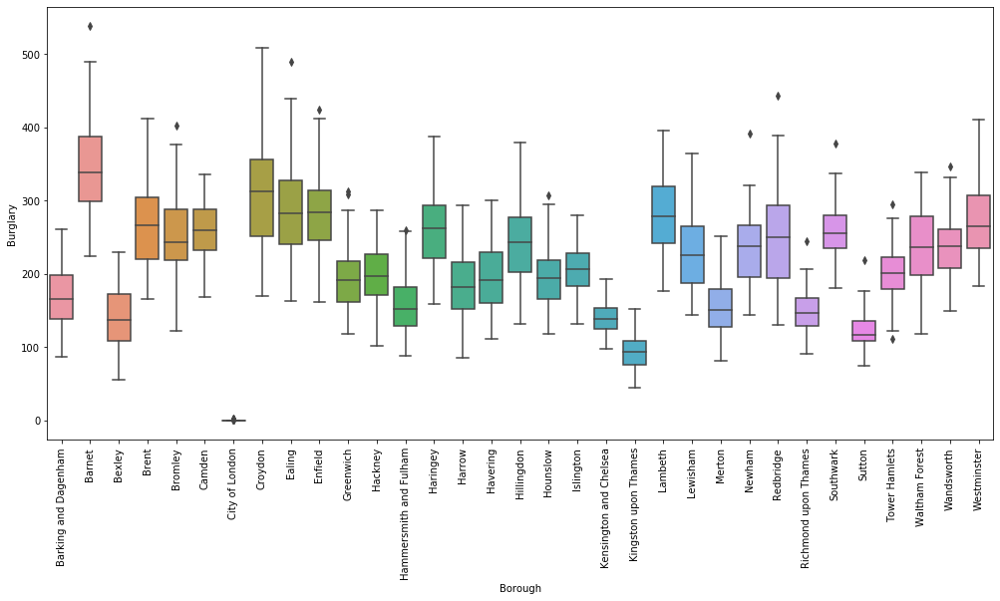

In [973]:
# Boxplot for each borough - Burglary
fig, ax = pyplot.subplots(figsize=(17,8))
ax = sns.boxplot(x="Borough", y="Burglary", data=crime_price_df, ax=ax)
plt.xticks(rotation=90);

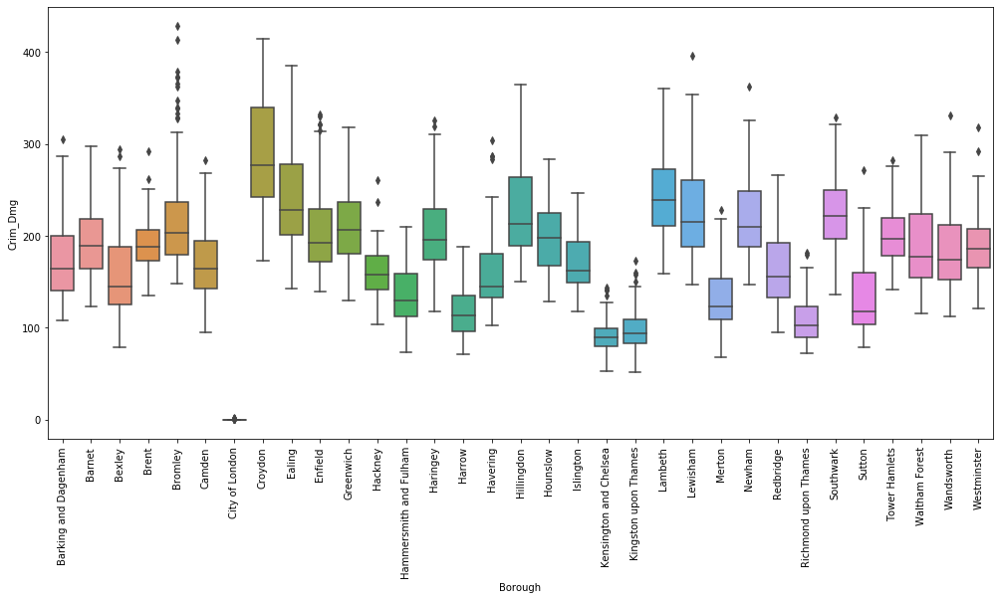

In [974]:
# Boxplot for each borough - Criminal Damage
fig, ax = pyplot.subplots(figsize=(17,8))
ax = sns.boxplot(x="Borough", y="Crim_Dmg", data=crime_price_df, ax=ax)
plt.xticks(rotation=90);

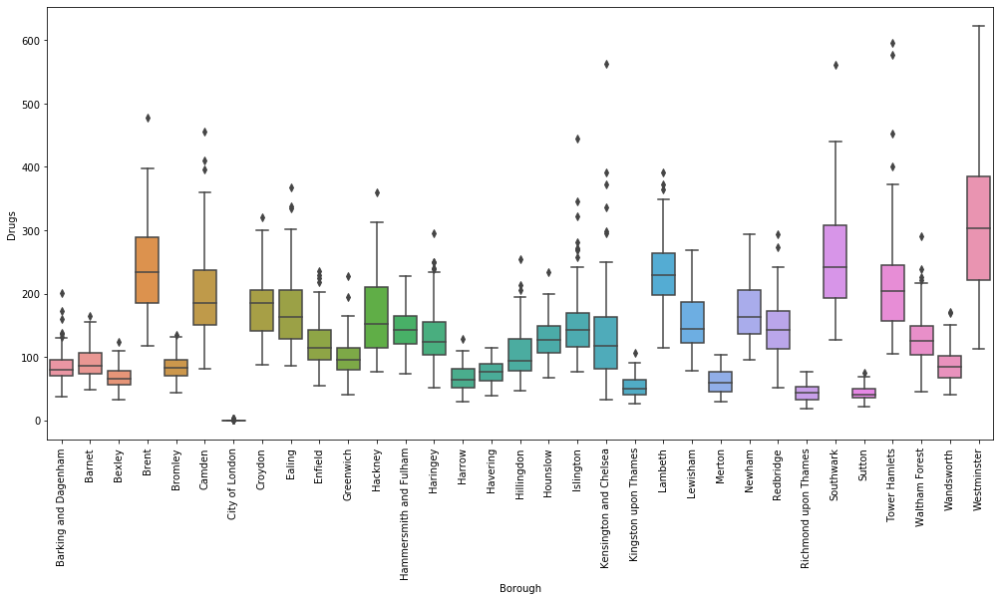

In [975]:
# Boxplot for each borough - Drugs
fig, ax = pyplot.subplots(figsize=(17,8))
ax = sns.boxplot(x="Borough", y="Drugs", data=crime_price_df, ax=ax)
plt.xticks(rotation=90);

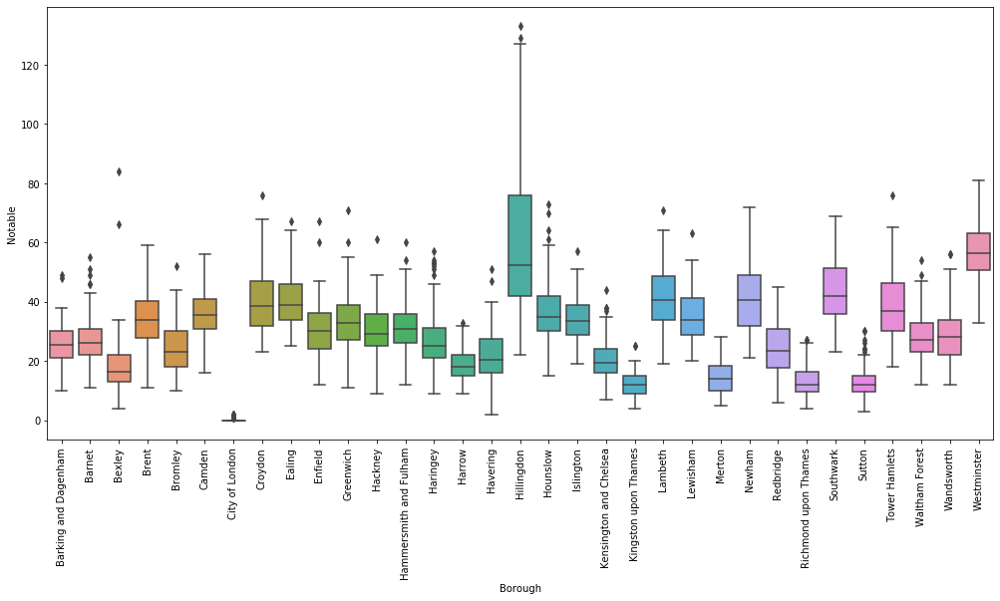

In [976]:
# Boxplot for each borough - Other Notable Crimes
fig, ax = pyplot.subplots(figsize=(17,8))
ax = sns.boxplot(x="Borough", y="Notable", data=crime_price_df, ax=ax)
plt.xticks(rotation=90);

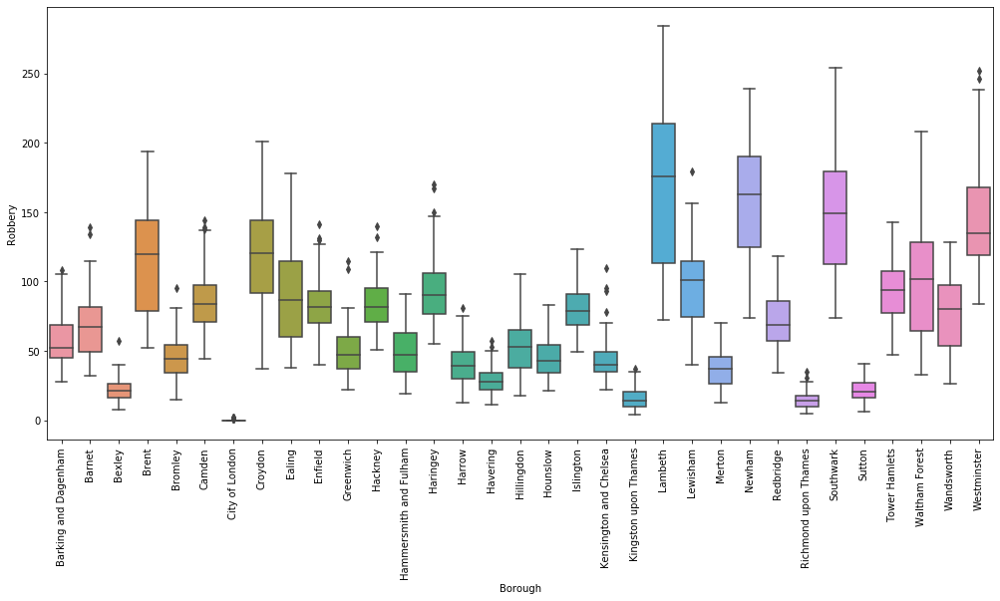

In [977]:
# Boxplot for each borough - Robbery
fig, ax = pyplot.subplots(figsize=(17,8))
ax = sns.boxplot(x="Borough", y="Robbery", data=crime_price_df, ax=ax)
plt.xticks(rotation=90);

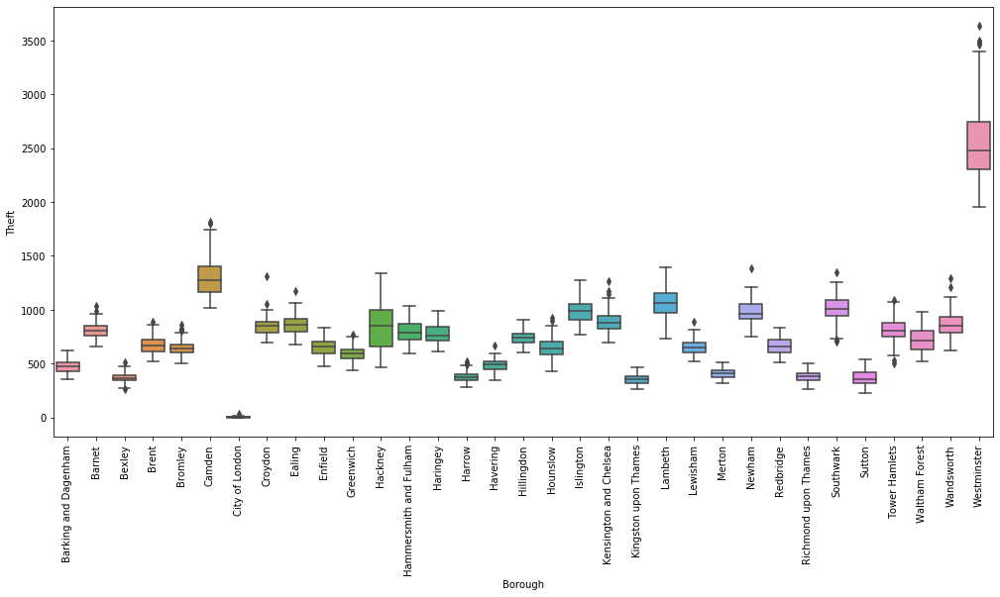

In [978]:
# Boxplot for each borough - Theft
fig, ax = pyplot.subplots(figsize=(17,8))
ax = sns.boxplot(x="Borough", y="Theft", data=crime_price_df, ax=ax)
plt.xticks(rotation=90);

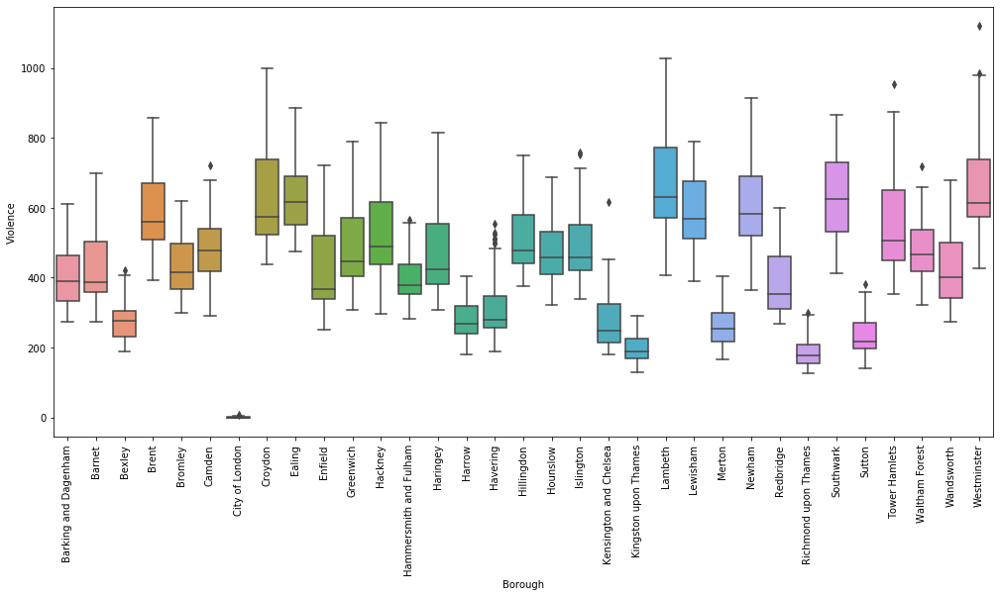

In [979]:
# Boxplot for each borough - Violence
fig, ax = pyplot.subplots(figsize=(17,8))
ax = sns.boxplot(x="Borough", y="Violence", data=crime_price_df, ax=ax)
plt.xticks(rotation=90);

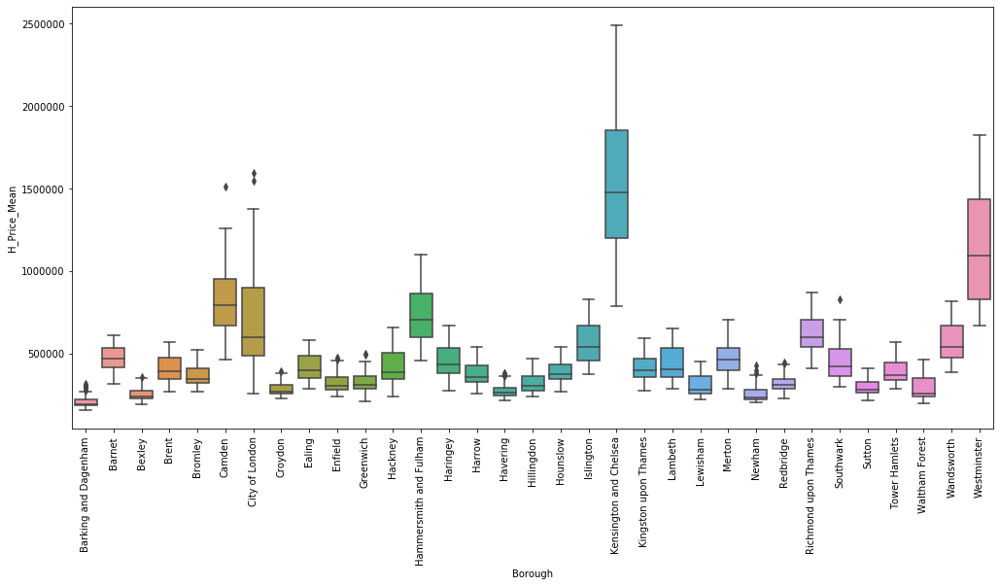

In [980]:
# Boxplot for each borough - House Price Mean
fig, ax = pyplot.subplots(figsize=(17,8))
ax = sns.boxplot(x="Borough", y="H_Price_Mean", data=crime_price_df, ax=ax)
plt.xticks(rotation=90);

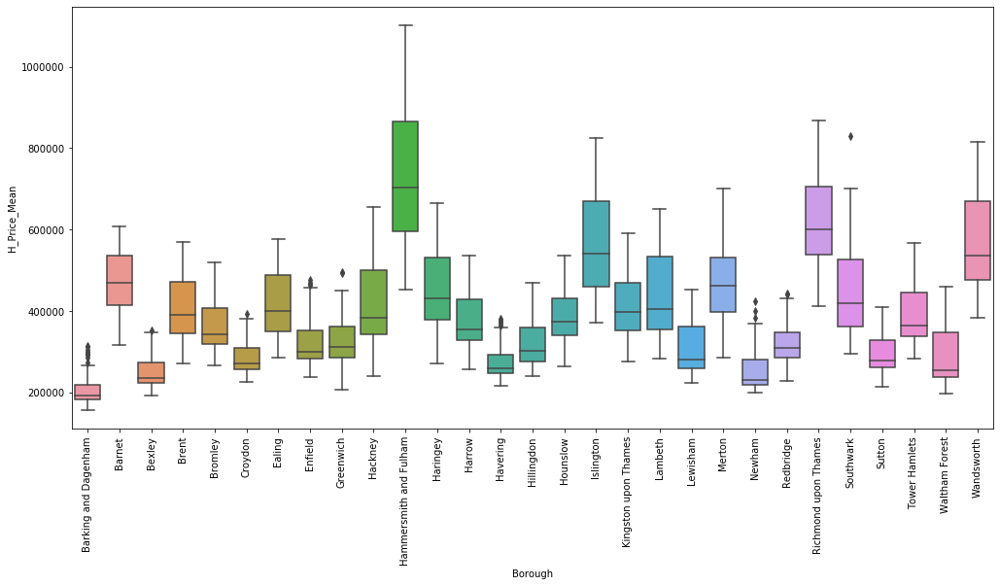

In [981]:
# Boxplot for each borough - House Price Mean
# Get rid of city of london, westminster and kensington to get a better view of the others
n_boroughs_01 = ['City of London', 'Westminster', 'Kensington and Chelsea', 'Camden']
fig, ax = pyplot.subplots(figsize=(17,8))
ax = sns.boxplot(x="Borough", y="H_Price_Mean", 
                 data=crime_price_df[~crime_price_df.Borough.isin(n_boroughs_01)], ax=ax)
plt.xticks(rotation=90);

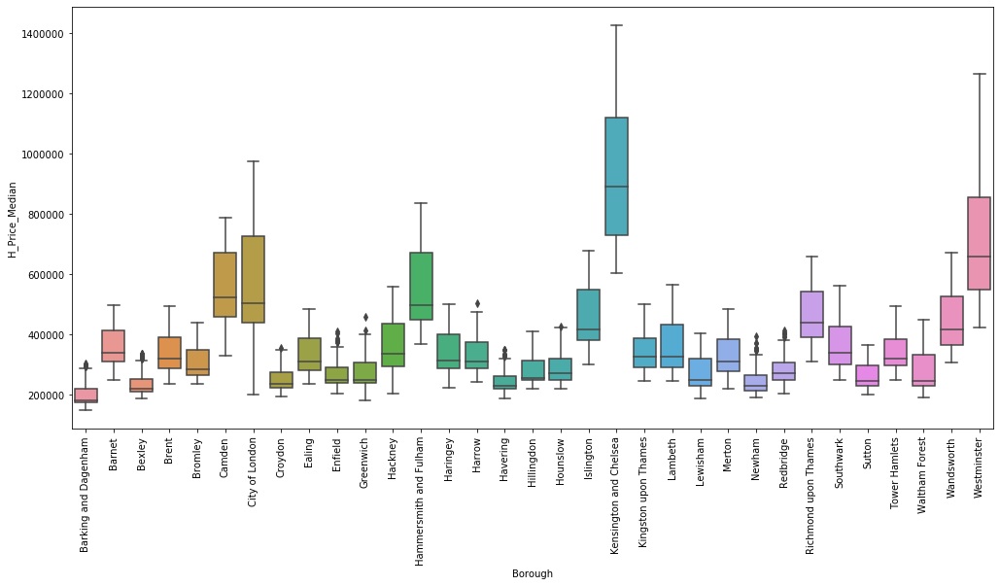

In [982]:
# Boxplot for each borough - House Price Median
fig, ax = pyplot.subplots(figsize=(17,8))
ax = sns.boxplot(x="Borough", y="H_Price_Median", data=crime_price_df, ax=ax)
plt.xticks(rotation=90);

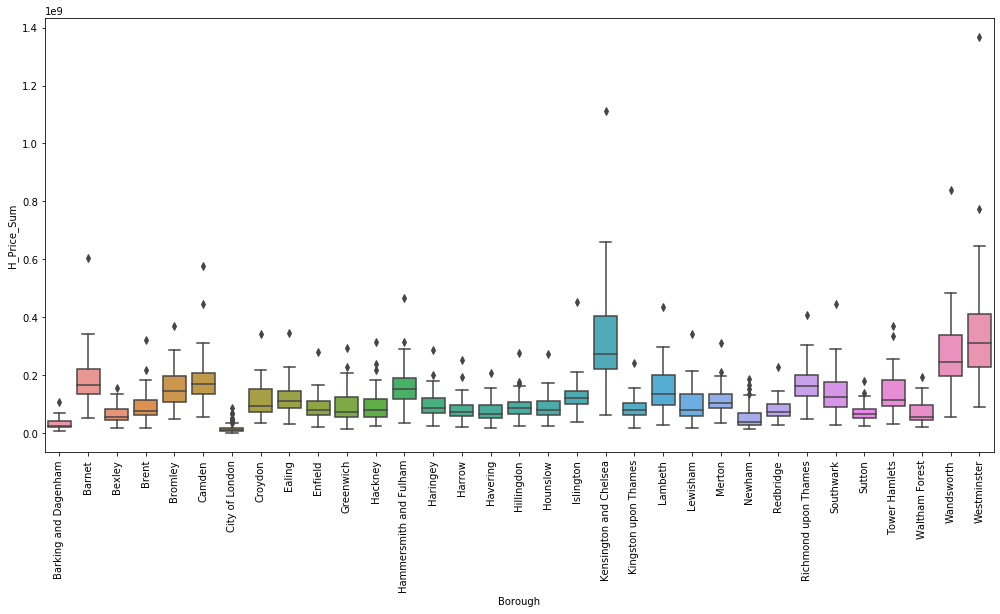

In [983]:
# Boxplot for each borough - House Price Sum
fig, ax = pyplot.subplots(figsize=(17,8))
ax = sns.boxplot(x="Borough", y="H_Price_Sum", data=crime_price_df, ax=ax)
plt.xticks(rotation=90);

# EDA 2 - Correlations between variables

In [97]:
# load in the final crime price df if the notebook falls over
import pandas as pd
crime_price_df = pd.read_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/Final_Crime_Price_df.csv', index_col=0)

In [104]:
crime_price_df.head()

,Borough,YYYY_MM,Burglary,Crim_Dmg,Drugs,Notable,Robbery,Theft,Violence,H_Price_Mean,H_Price_Median,H_Price_Sum,DateTime
0,Barking and Dagenham,2008-01,134,286,92,14,50,492,440,203898,194475,43634131,2008-01-01
1,Barking and Dagenham,2008-02,135,274,118,20,50,477,359,199082,195500,45788954,2008-02-01
2,Barking and Dagenham,2008-03,140,235,102,27,56,462,395,209719,195000,42363210,2008-03-01
3,Barking and Dagenham,2008-04,124,287,132,23,58,500,398,198477,192000,40092361,2008-04-01
4,Barking and Dagenham,2008-05,126,253,99,19,58,491,414,195302,195500,29295365,2008-05-01


In [103]:
pd.set_option('display.float_format', lambda x: '%.0f' % x)
crime_price_df.describe()

,Burglary,Crim_Dmg,Drugs,Notable,Robbery,Theft,Violence,H_Price_Mean,H_Price_Median,H_Price_Sum
count,3564,3564,3564,3564,3564,3564,3564,3564,3564,3564
mean,212,177,132,30,73,747,437,472407,368899,121489738
std,82,67,85,16,49,427,184,297456,174608,95024424
min,0,0,0,0,0,0,0,157370,150000,1540000
25%,157,136,74,19,35,500,311,299302,250000,61857033
50%,212,176,114,29,65,710,434,381620,317000,98559558
75%,265,216,173,39,100,888,562,531157,422481,151626101
max,538,428,622,133,284,3634,1120,2488633,1425500,1366613906


In [22]:
# due to crashing had to reload, redo some manipulations on the df
crime_price_df.drop(columns='YYYY_MM', inplace=True, axis=1)

In [4]:
# Correlations
crime_price_df.corr()

,Burglary,Crim_Dmg,Drugs,Notable,Robbery,Theft,Violence,H_Price_Mean,H_Price_Median,H_Price_Sum
Burglary,1.000000,0.638053,0.478004,0.353901,0.637579,0.472424,0.449114,-0.175089,-0.243109,0.073062
Crim_Dmg,0.638053,1.000000,0.478678,0.444645,0.542198,0.327085,0.592764,-0.365607,-0.416280,-0.108140
Drugs,0.478004,0.478678,1.000000,0.462432,0.657689,0.647623,0.501853,0.065776,0.009377,0.096354
Notable,0.353901,0.444645,0.462432,1.000000,0.427314,0.557320,0.777148,0.080299,0.087277,0.285958
Robbery,0.637579,0.542198,0.657689,0.427314,1.000000,0.612871,0.552053,-0.050299,-0.093274,0.064637
Theft,0.472424,0.327085,0.647623,0.557320,0.612871,1.000000,0.552831,0.408755,0.346927,0.489275
Violence,0.449114,0.592764,0.501853,0.777148,0.552053,0.552831,1.000000,0.015263,0.040006,0.295849
H_Price_Mean,-0.175089,-0.365607,0.065776,0.080299,-0.050299,0.408755,0.015263,1.000000,0.967613,0.734901
H_Price_Median,-0.243109,-0.416280,0.009377,0.087277,-0.093274,0.346927,0.040006,0.967613,1.000000,0.714833
H_Price_Sum,0.073062,-0.108140,0.096354,0.285958,0.064637,0.489275,0.295849,0.734901,0.714833,1.000000


(12, 0)

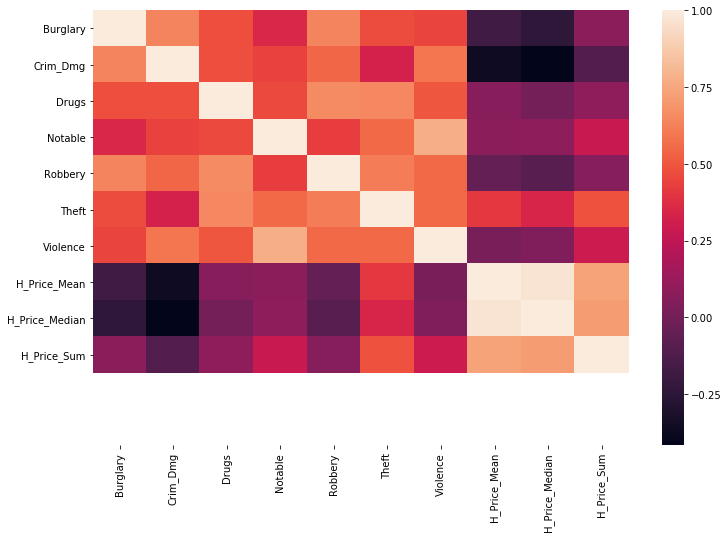

In [96]:
# Heatmaps
import matplotlib.pyplot as plt
import seaborn as sns
fig, ax = plt.subplots(figsize=(12,8))
ax = sns.heatmap(crime_price_df.corr())
ax.set_ylim([len(crime_price_df.columns),0])

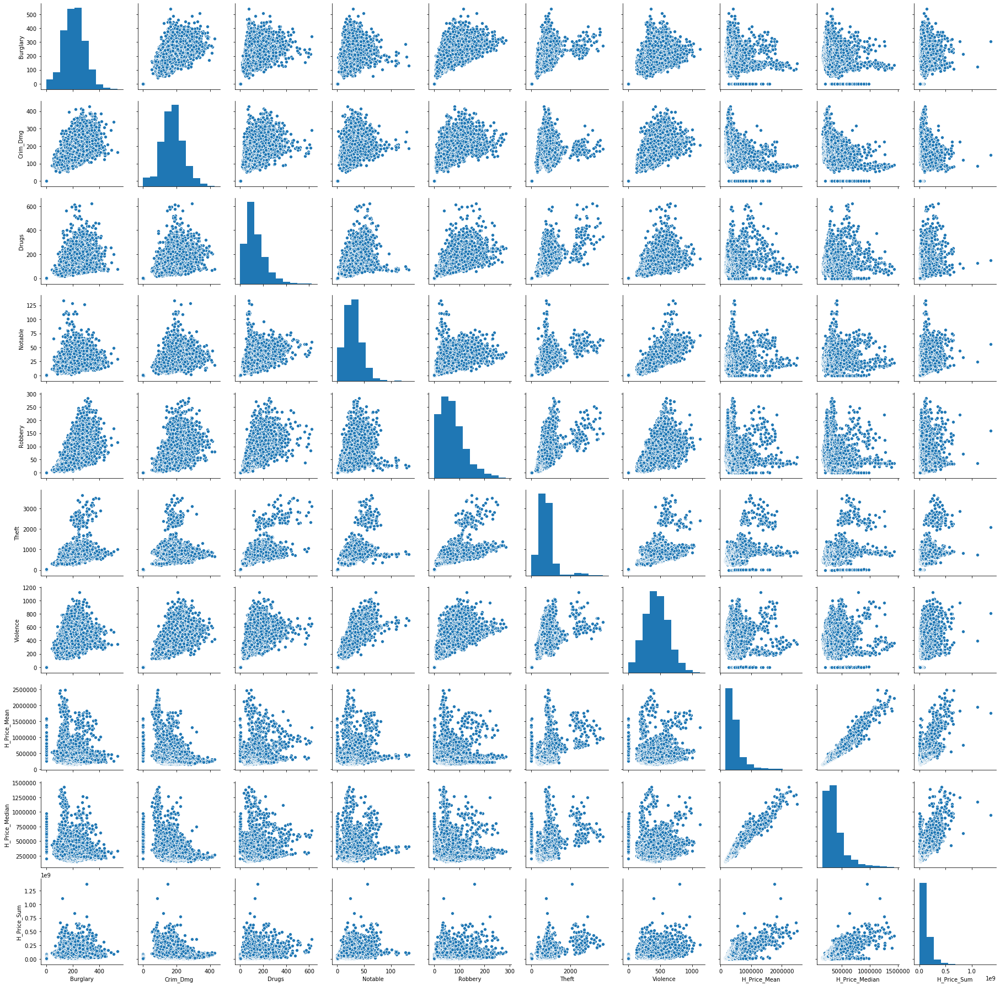

In [6]:
# scatterplots
sns.pairplot(crime_price_df)

In [7]:
# Looking at the above pairplot, I have noted the following:
# I can clearly see the city of london data, which may be making the rest of the model worse
# since it seems to be such a particular borough, maybe I should remove it as an outlier

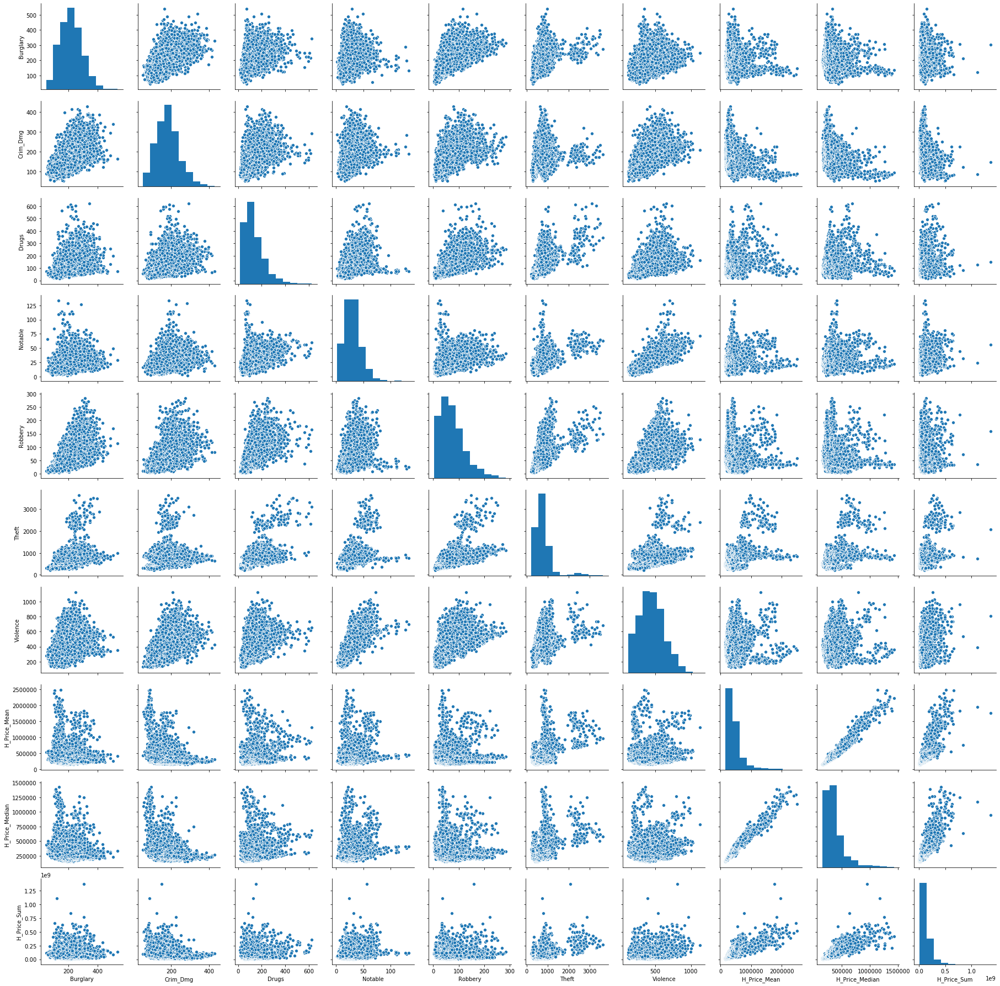

In [21]:
# scatterplots - this time removing City of London
sns.pairplot(crime_price_df[~crime_price_df.Borough.isin(['City of London'])])

# Risks, Limitations, Assumptions

In [8]:
# Risks
# Correlation is not always causation!
# My model will not predict anything useful
# Too much data, crash, lose everything!

In [9]:
# Limitations
# Only around 3500 rows of data, which is 33 boroughs x 8 years x 12 months
# data only goes as far back as 2008, which in terms of house prices is an interesting time to start counting
# as this is just after the market crash, wwhich sent house prices amongst other things crashing down
# the effect of this is that from 2008 it is a low point and up to 2016 it is generally an upwards curve
# What effect would including older data have on the model? Excluding year as a variable surely it would make
# it worse. Also, it would be great to have more current data than 2016 but that is as recent as the crime data
# goes. 
# I have not accounted for inflation so far in my process

In [10]:
# Assumptions
# I have assumed that house sales under £100k were not 'real', and that sales categorised as 'other' are not
# typical residential sales.
# I have assumed that most sales are working within normal market conditions, i.e. that there are few
# special circumstances such as people selling their houses for under market value for various reasons
# e.g. selling to friends or family.
# I have assumed that the crime data is reliable - it looks so but I don't have a good way of verifying
# I trust the house sales data much more, it is from the government after all

# ----- Regression Problems -----

In [225]:
from timeit import default_timer as timer

# Linear Regression

In [1]:
# load in the final crime_price_df due to the notebook often falling over
import pandas as pd
crime_price_df = pd.read_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/Final_Crime_Price_df.csv', index_col=0)

# due to crashing had to reload, redo some manipulations on the df
crime_price_df.drop(columns='YYYY_MM', inplace=True, axis=1)

# Adding year to the dataframe to see if it improves the model
crime_price_df['Year'] = [i.year for i in pd.to_datetime(crime_price_df.DateTime)]

# re-arranging the dataframe to help quickly pick out the X variables using iloc / better visualisation
crime_price_df = crime_price_df[['Borough', 'DateTime', 'Year', 'Burglary', 'Crim_Dmg', 'Drugs', 'Notable', 'Robbery', 'Theft', 'Violence', 'H_Price_Mean', 'H_Price_Median', 'H_Price_Sum']]

In [2]:
# Reminder of the data
crime_price_df.tail()

,Borough,DateTime,Year,Burglary,Crim_Dmg,Drugs,Notable,Robbery,Theft,Violence,H_Price_Mean,H_Price_Median,H_Price_Sum
3559,Westminster,2016-08-01,2016,274,208,282,63,183,2297,984,1.688914e+06,983750.0,317515771.0
3560,Westminster,2016-09-01,2016,246,147,173,68,167,2011,961,1.710905e+06,1021250.0,390086242.0
3561,Westminster,2016-10-01,2016,280,172,158,58,132,2313,980,1.595841e+06,1060000.0,339914059.0
3562,Westminster,2016-11-01,2016,272,201,166,50,134,2559,893,1.466267e+06,1165000.0,412021060.0
3563,Westminster,2016-12-01,2016,307,224,124,44,221,2868,963,1.824124e+06,1248250.0,773428780.0


In [3]:
# What is the main question I am asking?
# Can I predict house price from crime data...
# my target y variable in this case is not categorical so I should start with a bog standard linear regression

In [4]:
# thanks cat for helping me with this, but there were 2 annoyingly simple ways to do the same thing!
# 1 - instead of overwriting the X_train variable, make a new one called X_train_std, then I can easily access both
# 2 - scaler.inverse_transform(X_train). Doh!
# unstandardise the beta coefficients to make them more intelligible (don't have to talk in standard deviations)
#intercept = lr_01.intercept_ - np.dot(lr_01.coef_, scaler.mean_/scaler.scale_)
#coefficients = np.true_divide(lr_01.coef_, scaler.scale_)

In [28]:
import numpy as np
from sklearn.linear_model import LinearRegression, LassoCV, RidgeCV, ElasticNetCV, Lasso, Ridge, ElasticNet
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error

In [7]:
# function for plotting graphs
import numpy as np
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

def plot_regression_wbaseline(x, y, yhat):
    
    fig = plt.figure(figsize=(4,4))
    ax = fig.gca()
    
    ymean = np.mean(y)
    
    ax.scatter(x, y, color='steelblue', s=70, label='true y')
    
    min_x, max_x = np.min(x), np.max(x)
    min_yhat = np.min(yhat)
    max_yhat = np.max(yhat)
    
    ax.plot([min_x, max_x], [min_yhat, max_yhat], color='red', linewidth=4, alpha=0.7, label='regression model')
    ax.plot([min_x, max_x], [ymean, ymean], color='yellow', linewidth=4, alpha=0.7, label='baseline model')
    
    ax.set_xlabel(x.name, fontsize=16)
    ax.set_ylabel(y.name, fontsize=16)
    
    plt.legend(loc='upper left')
    
    plt.show()

In [37]:
# target variable is House Price Sum, only using the crime stats as predictors
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'H_Price_Sum']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

lr_01 = LinearRegression().fit(X_train_std, y_train)
coefficients = np.true_divide(lr_01.coef_, scaler.scale_)

print('Target Variable: House Price Sum')
print('Model: Linear Regression')
print('- betas ------------------------ std X features (in order of predictive power)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, lr_01.coef_)), key=lambda tup: abs(tup[1]), reverse=True)]
print('- betas ------------------------ org X features (in ascending order)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, coefficients)), key=lambda tup: tup[1])]
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, lr_01.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(lr_01, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(lr_01, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(lr_01, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(lr_01.score(X_test_std, y_test)))

Target Variable: House Price Sum
Model: Linear Regression
- betas ------------------------ std X features (in order of predictive power)
          64,917,459 Theft
          36,589,011 Violence
         -31,969,563 Crim_Dmg
         -27,843,693 Robbery
         -18,842,398 Drugs
           8,863,141 Burglary
          -5,940,801 Notable
- betas ------------------------ org X features (in ascending order)
            -558,426 Robbery
            -470,187 Crim_Dmg
            -377,201 Notable
            -223,507 Drugs
             107,702 Burglary
             151,715 Theft
             197,802 Violence
Model rmse               (std):      81,352,109
Baseline rmse            (std):     104,253,551
Cross Validation Std Dev (std):           0.034
Cross Validation Average (std):           0.373
Train Test Split Score   (std):           0.391


In [9]:
# THIS IS NO LONGER WORKING SINCE I STOPPED USING A SECOND LR_02 regression.... how to fix? Worth it? Ask Cristoff
# X = other notable, y = house price sum
# beta0 = lr_02.intercept_
# beta1 = lr_02.coef_[0]
# plot_regression_wbaseline(X_test.iloc[:,5], y_test, lr_02.predict(X_test))

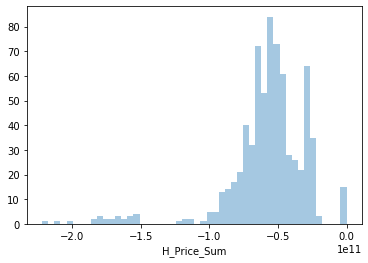

In [10]:
# Looking at a histogram of the residuals to check that assumptions for linear regression are being met
# it is a normal distribution in shape but severely shifted to the left due to a few outliers at the top 
# end of the market. Will my model perform even better if I remove those small percentage of houses at the 
# very top end of the market?? What are the limitations of this, and the benefits?
y_resid = y_test - lr_01.predict(X_test)
sns.distplot(y_resid, bins=50, hist=True, kde=False)
plt.show()

In [12]:
# target variable is House Price Median, only using the crime stats as predictors
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = LinearRegression()
model.fit(X_train_std, y_train)
coefficients = np.true_divide(model.coef_, scaler.scale_)

print('Target Variable: House Price Median')
print('Model: Linear Regression')
print('- betas ------------------------ std X features (in order of predictive power)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, model.coef_)), key=lambda tup: abs(tup[1]), reverse=True)]
print('- betas ------------------------ org X features (in ascending order)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, coefficients)), key=lambda tup: tup[1])]
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: House Price Median
Model: Linear Regression
- betas ------------------------ std X features (in order of predictive power)
             110,320 Theft
             -89,602 Crim_Dmg
              42,633 Violence
             -29,822 Burglary
             -29,688 Robbery
             -13,998 Notable
              -9,359 Drugs
- betas ------------------------ org X features (in ascending order)
              -1,318 Crim_Dmg
                -889 Notable
                -595 Robbery
                -362 Burglary
                -111 Drugs
                 230 Violence
                 258 Theft
Model rmse               (std):         126,021
Baseline rmse            (std):         179,323
Cross Validation Std Dev (std):           0.027
Cross Validation Average (std):           0.475
Train Test Split Score   (std):           0.506


In [13]:
# target variable is House Price Median, only using the crime stats as predictors
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = RidgeCV(alphas=np.logspace(-5, 5, 100), cv=5)
model.fit(X_train_std, y_train)
coefficients = np.true_divide(model.coef_, scaler.scale_)

print('Target Variable: House Price Median')
print('Model: Ridge Linear Regression')
print('Best alpha {}'.format(model.alpha_))
print('- betas ------------------------ std X features (in order of predictive power)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, model.coef_)), key=lambda tup: abs(tup[1]), reverse=True)]
print('- betas ------------------------ org X features (in ascending order)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, coefficients)), key=lambda tup: tup[1])]
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: House Price Median
Model: Ridge Linear Regression
Best alpha 23.10129700083158
- betas ------------------------ std X features (in order of predictive power)
             108,446 Theft
             -88,495 Crim_Dmg
              40,819 Violence
             -29,882 Burglary
             -28,751 Robbery
             -12,500 Notable
              -8,987 Drugs
- betas ------------------------ org X features (in ascending order)
              -1,302 Crim_Dmg
                -794 Notable
                -577 Robbery
                -363 Burglary
                -107 Drugs
                 221 Violence
                 253 Theft
Model rmse               (std):         126,099
Baseline rmse            (std):         179,323
Cross Validation Std Dev (std):           0.019
Cross Validation Average (std):           0.481
Train Test Split Score   (std):           0.506


In [21]:
# target variable is House Price Median, only using the crime stats as predictors
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = LassoCV(cv=5)
model.fit(X_train_std, y_train)
coefficients = np.true_divide(model.coef_, scaler.scale_)

print('Target Variable: House Price Median')
print('Model: Lasso Linear Regression')
print('Best alpha {}'.format(model.alpha_))
print('- betas ------------------------ std X features (in order of predictive power)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, model.coef_)), key=lambda tup: abs(tup[1]), reverse=True)]
print('- betas ------------------------ org X features (in ascending order)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, coefficients)), key=lambda tup: tup[1])]
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: House Price Median
Model: Lasso Linear Regression
Best alpha 73.29115368238357
- betas ------------------------ std X features (in order of predictive power)
             110,044 Theft
             -89,528 Crim_Dmg
              42,173 Violence
             -29,763 Burglary
             -29,518 Robbery
             -13,597 Notable
              -9,243 Drugs
- betas ------------------------ org X features (in ascending order)
              -1,317 Crim_Dmg
                -863 Notable
                -592 Robbery
                -362 Burglary
                -110 Drugs
                 228 Violence
                 257 Theft
Model rmse               (std):         126,024
Baseline rmse            (std):         179,323
Cross Validation Std Dev (std):           0.023
Cross Validation Average (std):           0.476
Train Test Split Score   (std):           0.506


In [20]:
# target variable is House Price Median, only using the crime stats as predictors
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = ElasticNetCV(l1_ratio=[0.0001, 0.001, 0.01, 0.1, 0.5, 0.7, 0.9, 0.95, 0.99, 1],
                     alphas=np.logspace(-5, 5, 100),
                     cv=5)
model.fit(X_train_std, y_train)
coefficients = np.true_divide(model.coef_, scaler.scale_)

print('Target Variable: House Price Median')
print('Model: Elastic Net Linear Regression')
print('Best alpha {}'.format(model.alpha_))
print('- betas ------------------------ std X features (in order of predictive power)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, model.coef_)), key=lambda tup: abs(tup[1]), reverse=True)]
print('- betas ------------------------ org X features (in ascending order)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, coefficients)), key=lambda tup: tup[1])]
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: House Price Median
Model: Elastic Net Linear Regression
Best alpha 0.06892612104349695
- betas ------------------------ std X features (in order of predictive power)
             108,721 Theft
             -88,657 Crim_Dmg
              41,080 Violence
             -29,874 Burglary
             -28,887 Robbery
             -12,714 Notable
              -9,042 Drugs
- betas ------------------------ org X features (in ascending order)
              -1,304 Crim_Dmg
                -807 Notable
                -579 Robbery
                -363 Burglary
                -107 Drugs
                 222 Violence
                 254 Theft
Model rmse               (std):         126,086
Baseline rmse            (std):         179,323
Cross Validation Std Dev (std):           0.022
Cross Validation Average (std):           0.479
Train Test Split Score   (std):           0.506


In [ ]:
# Q - why is elastic net so bad? Probably not setting the parameters well..
# Q - why does Lasso not reduce the other features in importance? Because there are so few features?

In [24]:
# target variable is House Price Mean, only using the crime stats as predictors
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'H_Price_Mean']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = LinearRegression()
model.fit(X_train_std, y_train)
coefficients = np.true_divide(model.coef_, scaler.scale_)

print('Target Variable: House Price Mean')
print('Model: Linear Regression')
#print('Best alpha {}'.format(model.alpha_))
print('- betas ------------------------ std X features (in order of predictive power)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, model.coef_)), key=lambda tup: abs(tup[1]), reverse=True)]
print('- betas ------------------------ org X features (in ascending order)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, coefficients)), key=lambda tup: tup[1])]
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: House Price Mean
Model: Linear Regression
- betas ------------------------ std X features (in order of predictive power)
             215,972 Theft
            -128,042 Crim_Dmg
             -56,685 Robbery
             -38,641 Burglary
              27,771 Violence
             -22,219 Notable
              -8,016 Drugs
- betas ------------------------ org X features (in ascending order)
              -1,883 Crim_Dmg
              -1,411 Notable
              -1,137 Robbery
                -470 Burglary
                 -95 Drugs
                 150 Violence
                 505 Theft
Model rmse               (std):         225,906
Baseline rmse            (std):         312,025
Cross Validation Std Dev (std):           0.052
Cross Validation Average (std):           0.447
Train Test Split Score   (std):           0.476


In [26]:
# removing city of london from the data
no_city = crime_price_df[~crime_price_df.Borough.isin(['City of London'])]

In [28]:
# target variable is House Price Mean, only using the crime stats as predictors
X = no_city.loc[:,'Burglary': 'Violence'] 
y = no_city.loc[:,'H_Price_Mean']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = LinearRegression()
model.fit(X_train_std, y_train)
coefficients = np.true_divide(model.coef_, scaler.scale_)

print('Target Variable: House Price Mean')
print('Notes: City of London now excluded')
print('Model: Linear Regression')
#print('Best alpha {}'.format(model.alpha_))
print('- betas ------------------------ std X features (in order of predictive power)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, model.coef_)), key=lambda tup: abs(tup[1]), reverse=True)]
print('- betas ------------------------ org X features (in ascending order)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, coefficients)), key=lambda tup: tup[1])]
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: House Price Mean
Notes: City of London now excluded
Model: Linear Regression
- betas ------------------------ std X features (in order of predictive power)
             209,658 Theft
            -113,521 Crim_Dmg
             -56,148 Robbery
              33,511 Violence
             -28,614 Burglary
             -21,053 Notable
              -9,842 Drugs
- betas ------------------------ org X features (in ascending order)
              -1,873 Crim_Dmg
              -1,400 Notable
              -1,151 Robbery
                -386 Burglary
                -121 Drugs
                 196 Violence
                 504 Theft
Model rmse               (std):         207,884
Baseline rmse            (std):         292,489
Cross Validation Std Dev (std):           0.063
Cross Validation Average (std):           0.495
Train Test Split Score   (std):           0.495


In [53]:
# Best model
# target variable is House Price Median, only using the crime stats as predictors
X = no_city.loc[:,'Burglary': 'Violence'] 
y = no_city.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = LinearRegression()
model.fit(X_train_std, y_train)
coefficients = np.true_divide(model.coef_, scaler.scale_)

print('Target Variable: House Price Median')
print('Notes: City of London now excluded')
print('Model: Linear Regression')
print('- betas ------------------------ std X features (in order of predictive power)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, model.coef_)), key=lambda tup: abs(tup[1]), reverse=True)]
print('- betas ------------------------ org X features (in ascending order)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, coefficients)), key=lambda tup: tup[1])]
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: House Price Median
Notes: City of London now excluded
Model: Linear Regression
- betas ------------------------ std X features (in order of predictive power)
             109,565 Theft
             -76,358 Crim_Dmg
              45,719 Violence
             -32,832 Robbery
             -19,072 Burglary
             -12,924 Notable
             -10,858 Drugs
- betas ------------------------ org X features (in ascending order)
              -1,260 Crim_Dmg
                -859 Notable
                -673 Robbery
                -257 Burglary
                -133 Drugs
                 263 Theft
                 268 Violence
Model rmse               (std):         116,922
Baseline rmse            (std):         166,863
Cross Validation Std Dev (std):           0.063
Cross Validation Average (std):           0.516
Train Test Split Score   (std):           0.509


In [54]:
# Best model *
# target variable is House Price Median, only using the crime stats as predictors
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

X_train_std = X_train
X_test_std = X_test

model = LinearRegression()
model.fit(X_train_std, y_train)
coefficients = np.true_divide(model.coef_, scaler.scale_)

print('Target Variable: House Price Median')
print('Notes: No standard scaler')
print('Model: Linear Regression')
print('- betas ------------------------ std X features (in order of predictive power)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, model.coef_)), key=lambda tup: abs(tup[1]), reverse=True)]
print('- betas ------------------------ org X features (in ascending order)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, coefficients)), key=lambda tup: tup[1])]
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: House Price Median
Notes: No standard scaler
Model: Linear Regression
- betas ------------------------ std X features (in order of predictive power)
              -1,318 Crim_Dmg
                -889 Notable
                -595 Robbery
                -362 Burglary
                 258 Theft
                 230 Violence
                -111 Drugs
- betas ------------------------ org X features (in ascending order)
                 -59 Notable
                 -22 Crim_Dmg
                 -12 Robbery
                  -5 Burglary
                  -1 Drugs
                   1 Theft
                   1 Violence
Model rmse               (std):         126,021
Baseline rmse            (std):         179,323
Cross Validation Std Dev (std):           0.027
Cross Validation Average (std):           0.475
Train Test Split Score   (std):           0.506


In [68]:
# Setting up a dataframe to examine where my model was going wrong
pd.options.display.max_rows = 999
pd.set_option('display.float_format', lambda x: '%.0f' % x)
summary_df = pd.concat([crime_price_df, pd.DataFrame(model.predict(X), columns=['Median_Pred'])], axis=1, sort=False)
summary_df['Diff'] = summary_df.H_Price_Median - summary_df.Median_Pred

In [70]:
# Westminster and Kensington & Chelsea are where my model consistently gets things wrong
summary_df.sort_values('Diff').head()

,Borough,DateTime,Year,Burglary,Crim_Dmg,Drugs,Notable,Robbery,Theft,Violence,H_Price_Mean,H_Price_Median,H_Price_Sum,Median_Pred,Diff
3503,Westminster,2011-12-01,2011,273,185,348,63,149,3634,681,972704,582500,272357252,1038137,-455637
3506,Westminster,2012-03-01,2012,397,202,455,63,169,3484,592,930052,500000,240883463,887827,-387827
3501,Westminster,2011-10-01,2011,250,209,605,41,148,3320,731,828922,570000,203085772,937032,-367032
3502,Westminster,2011-11-01,2011,237,224,497,60,129,3398,732,955160,584000,263624297,948731,-364731
3504,Westminster,2012-01-01,2012,311,171,432,49,126,3339,656,955865,617262,216025418,977809,-360547


In [36]:
# target variable is House Price Median, only using the crime stats as predictors
X = no_city.loc[:,'Year': 'Violence'] 
y = no_city.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = LinearRegression()
model.fit(X_train_std, y_train)
coefficients = np.true_divide(model.coef_, scaler.scale_)

print('Target Variable: House Price Median')
print('Notes: City of London now excluded, year added as extra feature')
print('Model: Linear Regression')
print('- betas ------------------------ std X features (in order of predictive power)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, model.coef_)), key=lambda tup: abs(tup[1]), reverse=True)]
print('- betas ------------------------ org X features (in ascending order)')
[print(f'{i[1]:>20,.0f}', i[0]) for i in sorted(list(zip(X.columns, coefficients)), key=lambda tup: tup[1])]
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: House Price Median
Notes: City of London now excluded, year added as extra feature
Model: Linear Regression
- betas ------------------------ std X features (in order of predictive power)
             111,280 Theft
             -53,122 Crim_Dmg
              33,237 Year
             -30,624 Robbery
             -20,864 Burglary
              18,816 Violence
             -16,693 Notable
               1,206 Drugs
- betas ------------------------ org X features (in ascending order)
              -1,110 Notable
                -876 Crim_Dmg
                -628 Robbery
                -282 Burglary
                  15 Drugs
                 110 Violence
                 267 Theft
              12,918 Year
Model rmse               (std):         117,031
Baseline rmse            (std):         166,863
Cross Validation Std Dev (std):           0.058
Cross Validation Average (std):           0.516
Train Test Split Score   (std):           0.508


In [ ]:
# Interesting... Adding year makes the model slightly worse. How!?

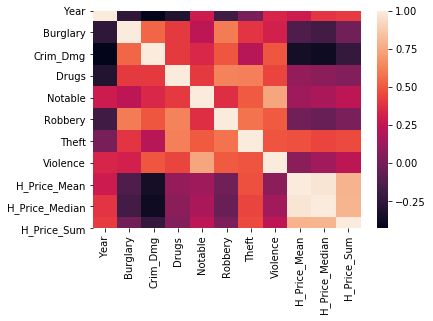

In [33]:
# quick heatmap with Year added - looks like it has a strong relationship with house price, which I expected
# but also violence, which is kind of surprising
ax = sns.heatmap(no_city.corr())

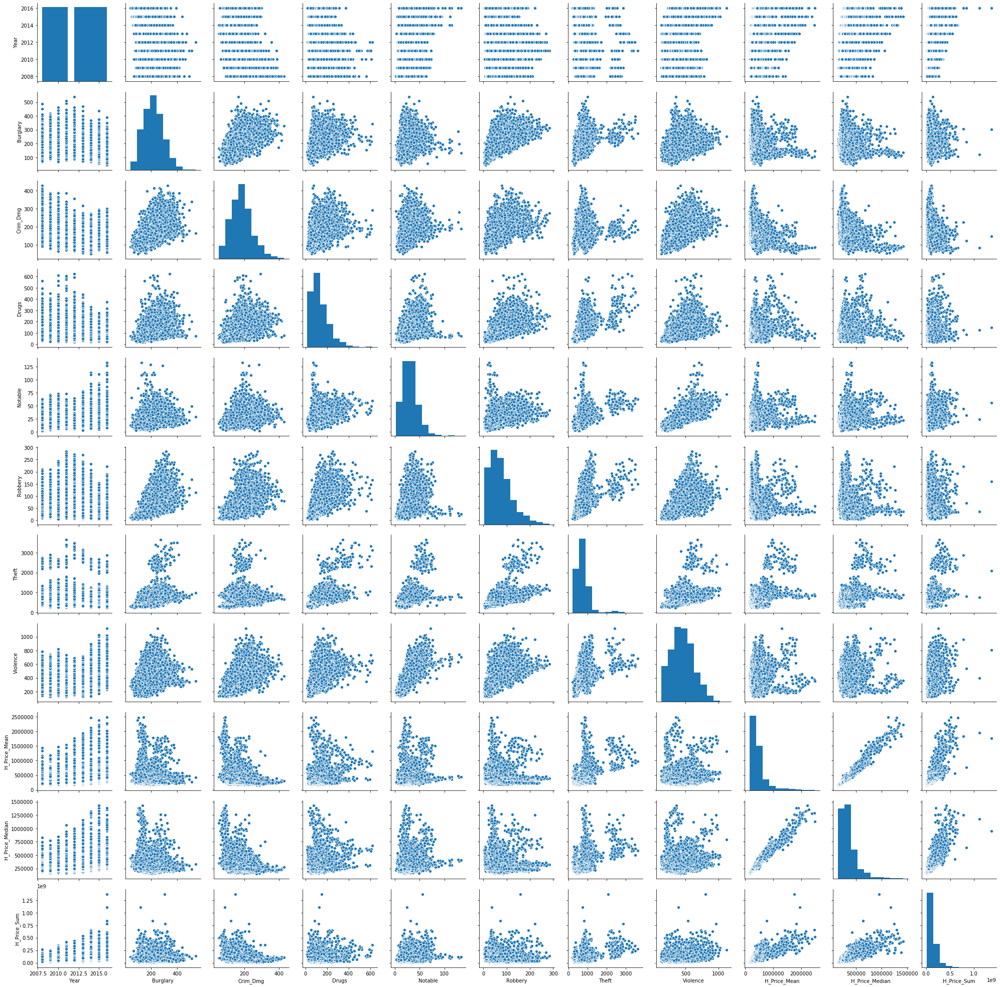

In [34]:
# above result is ever so slightly worse than the identical model previously above that doesn't have the 
# year feature as a predictor variable. Odd.... Let's look at the pairplot again with year added
import seaborn as sns
sns.pairplot(no_city)

# Decision Tree Regressor

In [71]:
# Reminder of the data
crime_price_df.head()

,Borough,DateTime,Year,Burglary,Crim_Dmg,Drugs,Notable,Robbery,Theft,Violence,H_Price_Mean,H_Price_Median,H_Price_Sum
0,Barking and Dagenham,2008-01-01,2008,134,286,92,14,50,492,440,203898,194475,43634131
1,Barking and Dagenham,2008-02-01,2008,135,274,118,20,50,477,359,199082,195500,45788954
2,Barking and Dagenham,2008-03-01,2008,140,235,102,27,56,462,395,209719,195000,42363210
3,Barking and Dagenham,2008-04-01,2008,124,287,132,23,58,500,398,198477,192000,40092361
4,Barking and Dagenham,2008-05-01,2008,126,253,99,19,58,491,414,195302,195500,29295365


In [136]:
# Decision Tree Regressor
from sklearn.tree import DecisionTreeRegressor
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = DecisionTreeRegressor()
model.fit(X_train_std, y_train)

print('Target Variable: House Price Median')
print('Notes: No standard scaler')
print('Model: Linear Regression')
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: House Price Median
Notes: No standard scaler
Model: Linear Regression
Model rmse               (std):         100,101
Baseline rmse            (std):         179,323
Cross Validation Std Dev (std):           0.096
Cross Validation Average (std):           0.525
Train Test Split Score   (std):           0.688


In [138]:
# Decision Tree Regressor - what the hell are these scores??!! Checking the predictions they are rubbish...!!
from sklearn.tree import DecisionTreeRegressor
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

#scaler = StandardScaler()
X_train_std = X_train
X_test_std = X_test

model = DecisionTreeRegressor()
model.fit(X_train_std, y_train)

print('Target Variable: House Price Median')
print('Notes: No standard scaler')
print('Model: Linear Regression')
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: House Price Median
Notes: No standard scaler
Model: Linear Regression
Model rmse               (std):         107,913
Baseline rmse            (std):         179,323
Cross Validation Std Dev (std):           0.093
Cross Validation Average (std):           0.547
Train Test Split Score   (std):           0.638


In [140]:
# standardising a decision tree regressor seems to mess up the predictions but not the score... ?!?!?
#model.predict(X_test)

In [110]:
# Decision Tree Regressor - gridsearching for better hyperparameters and results
from sklearn.tree import DecisionTreeRegressor
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

params = { 'max_features': ['sqrt', 'log2', None],
            'max_depth': [2,5,10,20,50, None]}
model = GridSearchCV(estimator=DecisionTreeRegressor(),
                     param_grid=params,
                     return_train_score=True,
                     cv=5)
model.fit(X_train_std, y_train)

print('Target Variable: House Price Median')
print('Notes: ---')
print('Model: Decision Tree Regressor (GridSearch)')
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: House Price Median
Notes: ---
Model: Decision Tree Regressor (GridSearch)
Model rmse               (std):          97,926
Baseline rmse            (std):         179,323


/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Cross Validation Std Dev (std):           0.066


/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Cross Validation Average (std):           0.533
Train Test Split Score   (std):           0.702


/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


# KNN Regressor

In [108]:
# knn regressor... nice. very nice.
from sklearn.neighbors import KNeighborsRegressor
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = X_train
X_test_std = X_test

model = KNeighborsRegressor()
model.fit(X_train_std, y_train)

print('Target Variable: House Price Median')
print('Notes: No standard scaler')
print('Model: KNN Regressor')
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: House Price Median
Notes: No standard scaler
Model: KNN Regressor
Model rmse               (std):          77,706
Baseline rmse            (std):         179,323
Cross Validation Std Dev (std):           0.049
Cross Validation Average (std):           0.744
Train Test Split Score   (std):           0.812


In [183]:
# Sense checking the predictions... seem too good to be true
temp_df_01 = pd.DataFrame(y)
temp_df_02 = pd.DataFrame(model.predict(X), columns=['KNN_median_pred'])
temp_df_03 = pd.concat([temp_df_01, temp_df_02], axis=1, sort=False)
temp_df_03['Diff'] = temp_df_03.H_Price_Median - temp_df_03.KNN_median_pred

In [186]:
#temp_df_03

# Bagging: Decision Tree Regressor

In [192]:
# These scores are getting crazy!

In [110]:
# Bagging Regressor...
from sklearn.ensemble import BaggingRegressor
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = X_train
X_test_std = X_test

model = BaggingRegressor()
model.fit(X_train_std, y_train)

print('Target Variable: House Price Median')
print('Notes: No standard scaler')
print('Model: Linear Regression')
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: House Price Median
Notes: No standard scaler
Model: Linear Regression
Model rmse               (std):          75,384
Baseline rmse            (std):         179,323
Cross Validation Std Dev (std):           0.073
Cross Validation Average (std):           0.745
Train Test Split Score   (std):           0.823


# Bagging: Random Forest Regressor

In [189]:
# Even better!!
from sklearn.ensemble import RandomForestRegressor

In [289]:
# Bagging Regressor...
start = timer()
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

params = {'n_estimators': [10,100,200]}
model = GridSearchCV(estimator=RandomForestRegressor(),
                     param_grid=params,
                     return_train_score=True,
                     iid=False,
                     verbose=0,
                     n_jobs=2,
                     cv=5)

model.fit(X_train_std, y_train)

print('Target Variable: House Price Median')
print('Notes: ---')
print('Model: Random Forest Regressor (GridSearch)')
print('Best Parameters: {}'.format(model.best_params_))
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))
end = timer()
print('This Model took {} seconds to run'.format(int(end - start)))

Target Variable: House Price Median
Notes: ---
Model: Random Forest Regressor (GridSearch)
Best Parameters: {'n_estimators': 100}
Model rmse               (std):          71,947
Baseline rmse            (std):         179,323
Cross Validation Std Dev (std):           0.067
Cross Validation Average (std):           0.771
Train Test Split Score   (std):           0.839
This Model took 57 seconds to run


In [197]:
# Sense checking the predictions... seem too good to be true
# temp_df_01 = pd.DataFrame(y)
# temp_df_02 = pd.DataFrame(model.predict(X), columns=['KNN_median_pred'])
# temp_df_03 = pd.concat([temp_df_01, temp_df_02], axis=1, sort=False)
# temp_df_03['Diff'] = temp_df_03.H_Price_Median - temp_df_03.KNN_median_pred
# temp_df_03

# ----- Classification Problems -----

In [76]:
from timeit import default_timer as timer

# Decision Tree Classifier

In [111]:
from sklearn.tree import DecisionTreeClassifier

In [200]:
crime_price_df.head()

,Borough,DateTime,Year,Burglary,Crim_Dmg,Drugs,Notable,Robbery,Theft,Violence,H_Price_Mean,H_Price_Median,H_Price_Sum
0,Barking and Dagenham,2008-01-01,2008,134,286,92,14,50,492,440,203898,194475,43634131
1,Barking and Dagenham,2008-02-01,2008,135,274,118,20,50,477,359,199082,195500,45788954
2,Barking and Dagenham,2008-03-01,2008,140,235,102,27,56,462,395,209719,195000,42363210
3,Barking and Dagenham,2008-04-01,2008,124,287,132,23,58,500,398,198477,192000,40092361
4,Barking and Dagenham,2008-05-01,2008,126,253,99,19,58,491,414,195302,195500,29295365


In [115]:
# Default Decision Tree Classifier...
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'Borough']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = DecisionTreeClassifier()
model.fit(X_train_std, y_train)

print('Target Variable: Borough')
print('Notes: ---')
print('Model: Decision Tree Classifier')
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Score              (std): {:>15,.3f}'.format(model.score(X_train_std, y_train)))
print('Test Score               (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: Borough
Notes: ---
Model: Decision Tree Classifier
Cross Validation Std Dev (std):           0.030
Cross Validation Average (std):           0.425
Train Score              (std):           1.000
Test Score               (std):           0.519


In [116]:
# Gridsearch Decision Tree Classifier...
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'Borough']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

params = { 'criterion'        : ['gini', 'entropy'],
           'splitter'         : ['best', 'random'],
           #'min_samples_split': [2,5,10],
           #'min_samples_leaf' : [1,3,6],
           'max_features'     : ['sqrt', 'log2', None],
           'max_depth'        : [2,5,10,20,50, None]}
model = GridSearchCV(estimator=DecisionTreeClassifier(),
                     param_grid=params,
                     return_train_score=True,
                     scoring='accuracy',
                     iid=False,
                     cv=5)
model.fit(X_train_std, y_train)

print('Target Variable: Borough')
print('Notes: ---')
print('Model: Decision Tree Classifier')
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Score              (std): {:>15,.3f}'.format(model.score(X_train_std, y_train)))
print('Test Score               (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: Borough
Notes: ---
Model: Decision Tree Classifier
Cross Validation Std Dev (std):           0.028
Cross Validation Average (std):           0.428
Train Score              (std):           1.000
Test Score               (std):           0.537


In [214]:
model.best_params_

{'criterion': 'entropy',
 'max_depth': None,
 'max_features': None,
 'splitter': 'best'}

In [222]:
# Gridsearch Decision Tree Classifier...
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'Borough']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

params = { 'criterion'        : ['gini', 'entropy'],
           'splitter'         : ['best', 'random'],
           'min_samples_split': [2,5,10],
           'min_samples_leaf' : [1,3,6],
           'max_features'     : ['sqrt', 'log2', None],
           'max_depth'        : [2,5,10,20,50, None]}
model = GridSearchCV(estimator=DecisionTreeClassifier(),
                     param_grid=params,
                     return_train_score=True,
                     scoring='accuracy',
                     iid=False,
                     cv=5)
model.fit(X_train_std, y_train)

print('Target Variable: Borough')
print('Notes: ---')
print('Model: Decision Tree Classifier')
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Score              (std): {:>15,.3f}'.format(model.score(X_train_std, y_train)))
print('Test Score               (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))

Target Variable: House Price Median
Notes: ---
Model: Decision Tree Classifier
Cross Validation Std Dev (std):           0.048
Cross Validation Average (std):           0.431
Train Score              (std):           1.000
Test Score               (std):           0.544


In [223]:
model.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'max_features': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'splitter': 'best'}

# Support Vector Machines

In [229]:
# Classifier: Support Vector Machines (Gridsearched)
start = timer()
from sklearn.svm import SVC

X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'Borough']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

#model = SVC(gamma='scale')

params = {'gamma': np.logspace(-3,3,10)}
model = GridSearchCV(estimator=SVC(gamma='scale'),
                     param_grid=params,
                     return_train_score=True,
                     scoring='accuracy',
                     iid=False,
                     verbose=0,
                     n_jobs=2,
                     cv=5)
model.fit(X_train_std, y_train)

print('Target Variable: Borough')
print('Notes: ---')
print('Model: Support Vector Machines (Gridsearched)')
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Score              (std): {:>15,.3f}'.format(model.score(X_train_std, y_train)))
print('Test Score               (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))
end = timer()
print('This Model took {} seconds to run'.format(end - start))

Target Variable: Borough
Notes: ---
Model: Support Vector Machines (Gridsearched)
Cross Validation Std Dev (std):           0.046
Cross Validation Average (std):           0.588
Train Score              (std):           0.794
Test Score               (std):           0.708
This Model took 30.403986537014134 seconds to run


# Linear Support Vector Machines

In [238]:
# Classifier: Support Vector Machines (Gridsearched)
start = timer()
from sklearn.svm import LinearSVC

X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'Borough']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

params = {'penalty': ['l2'],
         'loss': ['hinge', 'squared_hinge'],
         'C': [0.1,0.5,1,2,5]}
model = GridSearchCV(estimator=LinearSVC(max_iter=5000),
                     param_grid=params,
                     return_train_score=True,
                     scoring='accuracy',
                     iid=False,
                     verbose=0,
                     n_jobs=2,
                     cv=5)
model.fit(X_train_std, y_train)

print('Target Variable: Borough')
print('Notes: ---')
print('Model: Linear Support Vector Machines (Gridsearched)')
print('Best Parameters: {}'.format(model.best_params_))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Score              (std): {:>15,.3f}'.format(model.score(X_train_std, y_train)))
print('Test Score               (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))
end = timer()
print('This Model took {} seconds to run'.format(end - start))

/anaconda3/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Target Variable: Borough
Notes: ---
Model: Linear Support Vector Machines (Gridsearched)
Best Parameters: {'C': 5, 'loss': 'squared_hinge', 'penalty': 'l2'}


/anaconda3/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Cross Validation Std Dev (std):           0.039


/anaconda3/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Cross Validation Average (std):           0.456
Train Score              (std):           0.499
Test Score               (std):           0.513
This Model took 112.44424139198964 seconds to run


# K Nearest Neighbours

In [241]:
# Classifier: KNN (Gridsearched)
start = timer()
from sklearn.neighbors import KNeighborsClassifier

X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'Borough']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

params = {  'n_neighbors': list(range(1, 21, 3)),
            'weights': ['distance', 'uniform']}
model = GridSearchCV(estimator=KNeighborsClassifier(),
                     param_grid=params,
                     return_train_score=True,
                     scoring='accuracy',
                     iid=False,
                     verbose=0,
                     n_jobs=2,
                     cv=5)
model.fit(X_train_std, y_train)

print('Target Variable: Borough')
print('Notes: ---')
print('Model: K-Nearest Neighbours (Gridsearched)')
print('Best Parameters: {}'.format(model.best_params_))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Score              (std): {:>15,.3f}'.format(model.score(X_train_std, y_train)))
print('Test Score               (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))
end = timer()
print('This Model took {} seconds to run'.format(int(end - start)))

Target Variable: Borough
Notes: ---
Model: K-Nearest Neighbours (Gridsearched)
Best Parameters: {'n_neighbors': 13, 'weights': 'distance'}
Cross Validation Std Dev (std):           0.030
Cross Validation Average (std):           0.571
Train Score              (std):           1.000
Test Score               (std):           0.673
This Model took 12 seconds to run


# Logistic Regression

In [245]:
# Classifier: Logistic Regression (Gridsearched)
start = timer()
from sklearn.linear_model import LogisticRegression

X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'Borough']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

params = {  'penalty'    : ['l1', 'l2'],
            'C'          : np.logspace(-4, 2, 20),
            'solver'     : ['liblinear'],
            'multi_class': ['ovr']}
model = GridSearchCV(estimator=LogisticRegression(),
                     param_grid=params,
                     return_train_score=True,
                     scoring='accuracy',
                     iid=False,
                     verbose=0,
                     n_jobs=2,
                     cv=5)
model.fit(X_train_std, y_train)

print('Target Variable: Borough')
print('Notes: ---')
print('Model: Logistic Regression (Gridsearched)')
print('Best Parameters: {}'.format(model.best_params_))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Score              (std): {:>15,.3f}'.format(model.score(X_train_std, y_train)))
print('Test Score               (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))
end = timer()
print('This Model took {} seconds to run'.format(int(end - start)))

Target Variable: Borough
Notes: ---
Model: Logistic Regression (Gridsearched)
Best Parameters: {'C': 2.6366508987303554, 'multi_class': 'ovr', 'penalty': 'l1', 'solver': 'liblinear'}
Cross Validation Std Dev (std):           0.038
Cross Validation Average (std):           0.481
Train Score              (std):           0.529
Test Score               (std):           0.533
This Model took 57 seconds to run


# Chicken / Coffee - for fun

In [117]:
# Loading final borough_df
borough_df = pd.read_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/Final_Borough_incl_CC.csv')

In [118]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
borough_df = pd.concat([borough_df, crime_price_df.groupby('Borough').mean().reset_index()], axis=1, sort=False)

In [134]:
#borough_df.drop(['Local authority', 'Headquarters', 'HQ_Co_ordinates', 'Inner', 'Status', 'Political control',
#                'Area (sq mi)', 'Area (sq km)', 'Nr. in map', 'Population (2013 est)'], axis=1)

In [301]:
X = borough_df.loc[:,'Chicken': 'Coffee'] 
y = borough_df.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = LinearRegression()
model.fit(X_train_std, y_train)
model.score(X_test_std, y_test)

0.09904421926507212

In [311]:
X = borough_df.loc[:,'Chicken': 'Coffee'] 
y = borough_df.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = BaggingRegressor()
model.fit(X_train_std, y_train)
model.score(X_test_std, y_test)

0.25573124201623565

In [327]:
X = borough_df.loc[:,'Chicken': 'Coffee'] 
y = borough_df.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = RandomForestRegressor(n_estimators=100)
model.fit(X_train_std, y_train)
model.score(X_test_std, y_test)

0.23500075459132796

In [326]:
X = borough_df.loc[:,'Chicken': 'Coffee'] 
y = borough_df.loc[:,'H_Price_Mean']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = RandomForestRegressor(n_estimators=100)
model.fit(X_train_std, y_train)
model.score(X_test_std, y_test)

0.04287022635963944

In [334]:
X = borough_df.loc[:,'Chicken': 'Coffee'] 
y = borough_df.loc[:,'H_Price_Sum']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = RandomForestRegressor(n_estimators=100)
model.fit(X_train_std, y_train)
model.score(X_test_std, y_test)

-0.06875086066190983

In [355]:
X = borough_df.loc[:,'Chicken': 'Coffee'] 
y = borough_df.loc[:,'Population (2013 est)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = RandomForestRegressor(n_estimators=100)
model.fit(X_train_std, y_train)
model.score(X_test_std, y_test)

0.1412113894976882

In [356]:
X = borough_df.loc[:,'Chicken': 'Coffee'] 
y = borough_df.loc[:,'Violence']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = RandomForestRegressor(n_estimators=100)
model.fit(X_train_std, y_train)
model.score(X_test_std, y_test)

-0.708026481364304

In [360]:
borough_df_temp = borough_df.drop(6)

In [364]:
X = borough_df_temp.loc[:,'Chicken': 'Coffee'] 
y = borough_df_temp.loc[:,'Political control']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = LogisticRegression(solver='lbfgs', multi_class='ovr')
model.fit(X_train_std, y_train)
model.score(X_test_std, y_test)

0.7142857142857143

In [369]:
X = borough_df.loc[:,'Chicken': 'Coffee'] 
y = borough_df.loc[:,'Area (sq km)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = RandomForestRegressor(n_estimators=100)
model.fit(X_train_std, y_train)
model.score(X_test_std, y_test)

-0.004001665903921259

# Brexit - for fun

In [59]:
import pandas as pd
brexit_df = pd.read_csv('/Users/jason/Documents/GA/DSI9-lessons/projects/project-capstone/Crimes_vs_Housing/Brexit.csv')

In [60]:
# Adding brexit to the mix...!
brexit_df.head()

,Borough,Turnout,Vote_Remian,Vote_Leave,Prop_Remain,Prop_Leave
0,Barking and Dagenham,0.638,27750,46130,0.376,0.624
1,Barnet,0.721,100210,60823,0.622,0.378
2,Bexley,0.752,47603,80886,0.370,0.630
3,Brent,0.650,72523,48881,0.597,0.403
4,Bromley,0.788,92398,90034,0.506,0.494


In [61]:
borough_df = pd.concat([borough_df, brexit_df], axis=1, sort=False)

In [74]:
# Brexit Model
from sklearn.ensemble import RandomForestRegressor

X = borough_df.loc[:,'Chicken': 'Coffee'] 
y = borough_df.loc[:,'Prop_Remain']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

model = RandomForestRegressor(n_estimators=100)
model.fit(X_train_std, y_train)
model.score(X_test_std, y_test)

0.5006658672658538

# Neural Network: Multi-Layer-Perceptron (Classifier)

In [78]:
# Classifier: Neural Network
start = timer()
from sklearn.neural_network import MLPClassifier

X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'Borough']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

params = {}

mlp = MLPClassifier(solver='adam',
                    alpha=10**(0),
                    hidden_layer_sizes=(8, 8, 8, 8, 8),
                    activation='relu',
                    random_state=42,
                    batch_size=50,
                    max_iter=500)

model = GridSearchCV(estimator=mlp,
                     param_grid=params,
                     return_train_score=True,
                     scoring='accuracy',
                     iid=False,
                     verbose=0,
                     n_jobs=2,
                     cv=5)
model.fit(X_train_std, y_train)

print('Target Variable: Borough')
print('Notes: ---')
print('Model: Linear Support Vector Machines (Gridsearched)')
print('Best Parameters: {}'.format(model.best_params_))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Score              (std): {:>15,.3f}'.format(model.score(X_train_std, y_train)))
print('Test Score               (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))
print('Accuracy Score           (std): {:>15,.3f}'.format(metrics.accuracy_score(y_test, model.predict(X_test_std)))
end = timer()
print('This Model took {} seconds to run'.format(end - start))

Target Variable: Borough
Notes: ---
Model: Linear Support Vector Machines (Gridsearched)
Best Parameters: {}
Cross Validation Std Dev (std):           0.002
Cross Validation Average (std):           0.041
Train Score              (std):           0.033
Test Score               (std):           0.021
This Model took 76.1430508820049 seconds to run


In [84]:
# Classifier: Neural Network
start = timer()
from sklearn.neural_network import MLPClassifier
from sklearn import metrics

X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'Borough']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

params = {}

mlp = MLPClassifier(solver='lbfgs',
                    alpha=10**(0),
                    hidden_layer_sizes=(8, 8, 8, 8, 8),
                    activation='relu',
                    random_state=42,
                    batch_size=50,
                    max_iter=500)

model = GridSearchCV(estimator=mlp,
                     param_grid=params,
                     return_train_score=True,
                     scoring='accuracy',
                     iid=False,
                     verbose=0,
                     n_jobs=2,
                     cv=5)
model.fit(X_train_std, y_train)

print('Target Variable: Borough')
print('Notes: ---')
print('Model: Linear Support Vector Machines (Gridsearched)')
print('Best Parameters: {}'.format(model.best_params_))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Score              (std): {:>15,.3f}'.format(model.score(X_train_std, y_train)))
print('Test Score               (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))
end = timer()
print('This Model took {} seconds to run'.format(end - start))

Target Variable: Borough
Notes: ---
Model: Linear Support Vector Machines (Gridsearched)
Best Parameters: {}
Cross Validation Std Dev (std):           0.054
Cross Validation Average (std):           0.403
Train Score              (std):           0.152
Test Score               (std):           0.123
This Model took 34.42469377498492 seconds to run


In [83]:
# Classifier: Neural Network - basically a logistic regression with these parameters (I think)
start = timer()
from sklearn.neural_network import MLPClassifier
from sklearn import metrics

X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'Borough']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

params = {}

mlp = MLPClassifier(solver='lbfgs',
                    alpha=10**(0),
                    hidden_layer_sizes=(8, 8, 8, 8, 8),
                    activation='identity',
                    random_state=42,
                    batch_size=50,
                    max_iter=500)

model = GridSearchCV(estimator=mlp,
                     param_grid=params,
                     return_train_score=True,
                     scoring='accuracy',
                     iid=False,
                     verbose=0,
                     n_jobs=2,
                     cv=5)
model.fit(X_train_std, y_train)

print('Target Variable: Borough')
print('Notes: ---')
print('Model: Linear Support Vector Machines (Gridsearched)')
print('Best Parameters: {}'.format(model.best_params_))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Score              (std): {:>15,.3f}'.format(model.score(X_train_std, y_train)))
print('Test Score               (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))
end = timer()
print('This Model took {} seconds to run'.format(end - start))

Target Variable: Borough
Notes: ---
Model: Linear Support Vector Machines (Gridsearched)
Best Parameters: {}
Cross Validation Std Dev (std):           0.021
Cross Validation Average (std):           0.548
Train Score              (std):           0.651
Test Score               (std):           0.624
This Model took 44.68159785901662 seconds to run


In [ ]:
# Classifier: Neural Network
start = timer()
from sklearn.neural_network import MLPClassifier
from sklearn import metrics

X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'Borough']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

params = {}

mlp = MLPClassifier(solver='lbfgs',
                    alpha=10**(0),
                    hidden_layer_sizes=(8, 8, 8, 8, 8),
                    activation='identity',
                    random_state=42,
                    batch_size=50,
                    max_iter=500)

model = GridSearchCV(estimator=mlp,
                     param_grid=params,
                     return_train_score=True,
                     scoring='accuracy',
                     iid=False,
                     verbose=0,
                     n_jobs=2,
                     cv=5)
model.fit(X_train_std, y_train)

print('Target Variable: Borough')
print('Notes: ---')
print('Model: Linear Support Vector Machines (Gridsearched)')
print('Best Parameters: {}'.format(model.best_params_))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Score              (std): {:>15,.3f}'.format(model.score(X_train_std, y_train)))
print('Test Score               (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))
print('Accuracy Score           (std): {:>15,.3f}'.format(metrics.accuracy_score(y_test, model.predict(X_test_std))))
end = timer()
print('This Model took {} seconds to run'.format(end - start))

# Neural Network: Multi-Layer-Perceptron (Regression)

In [87]:
# NN MLP Regressor (default)
start = timer()
from sklearn.neural_network import MLPRegressor
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

mlp = MLPRegressor(hidden_layer_sizes=1, solver='lbfgs',
                    activation='identity', max_iter=1000, random_state=1)

params = {}
model = GridSearchCV(estimator=mlp,
                     param_grid=params,
                     return_train_score=True,
                     iid=False,
                     verbose=0,
                     n_jobs=2,
                     cv=5)

model.fit(X_train_std, y_train)

print('Target Variable: House Price Median')
print('Notes: ---')
print('Model: Random Forest Regressor (GridSearch)')
print('Best Parameters: {}'.format(model.best_params_))
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))
end = timer()
print('This Model took {} seconds to run'.format(int(end - start)))

Target Variable: House Price Median
Notes: ---
Model: Random Forest Regressor (GridSearch)
Best Parameters: {}
Model rmse               (std):         126,021
Baseline rmse            (std):         179,323
Cross Validation Std Dev (std):           0.027
Cross Validation Average (std):           0.475
Train Test Split Score   (std):           0.506
This Model took 0 seconds to run


In [88]:
# NN MLP Regressor...
start = timer()
from sklearn.neural_network import MLPRegressor
X = crime_price_df.loc[:,'Burglary': 'Violence'] 
y = crime_price_df.loc[:,'H_Price_Median']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True)

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

mlp = MLPRegressor(hidden_layer_sizes=(10, 10, 10),
                    solver='lbfgs', activation='relu', random_state=1)

params = {}
model = GridSearchCV(estimator=mlp,
                     param_grid=params,
                     return_train_score=True,
                     iid=False,
                     verbose=0,
                     n_jobs=2,
                     cv=5)

model.fit(X_train_std, y_train)

print('Target Variable: House Price Median')
print('Notes: ---')
print('Model: Random Forest Regressor (GridSearch)')
print('Best Parameters: {}'.format(model.best_params_))
print('Model rmse               (std): {:>15,.0f}'.format(mean_squared_error(y_test, model.predict(X_test_std))**0.5))
print('Baseline rmse            (std): {:>15,.0f}'.format(mean_squared_error(y_test, np.repeat(np.mean(y_test),len(y_test)))**0.5))
#print('Cross Validation Scores  (std): {}'.format([f'{j:,.3f}' for j in cross_val_score(model, X_test_std, y_test, cv=5)]))
print('Cross Validation Std Dev (std): {:>15.3f}'.format(np.std(cross_val_score(model, X_test_std, y_test, cv=5))))
print('Cross Validation Average (std): {:>15.3f}'.format(cross_val_score(model, X_test_std, y_test, cv=5).mean()))
print('Train Test Split Score   (std): {:>15,.3f}'.format(model.score(X_test_std, y_test)))
end = timer()
print('This Model took {} seconds to run'.format(int(end - start)))

Target Variable: House Price Median
Notes: ---
Model: Random Forest Regressor (GridSearch)
Best Parameters: {}
Model rmse               (std):          78,013
Baseline rmse            (std):         179,323
Cross Validation Std Dev (std):           0.076
Cross Validation Average (std):           0.722
Train Test Split Score   (std):           0.811
This Model took 11 seconds to run


# Unsupervised - finding Groups

# Summary / to-do

In [ ]:
# --- To-Do ---
# unsupervised groupings
# Add Pret and Greggs to the scrape - https://twitter.com/gilofthepeople/status/956985287871213568?s=12
# Add other 
# can I go down to LSOA level? - use postcodes.io again to get it from postcodes! It's possible!!
# add qualifications to the model by interpolating (forward filling)
# normalise by population / area
# inflation adjustment
# look again, more closely at the various raw education (gcse) files - ethinicity etc may be added!
# Try folium instead of Tableau
# pipelines
# https://git.generalassemb.ly/DSI-LDN-9/DSI9-lessons/tree/master/projects/project-capstone/part-04

In [ ]:
# --- Presentation ---
# Best results
# Worst results
# Surprises
# Challenges
# Interpret betas

Overview
Data science requires clean data, logical study design, and reproducible results. The best way to do this (and build your portfolio) is to get in the habit of fully documenting your work for your peers and colleagues.

In Part 4 of our Capstone, you'll assemble a technical notebook that details your model and approach for your peers. It should be written in a straightforward manner, with concisely commented code, documented procedures and reasoning, and logical analysis. Where applicable, include clearly labeled plots, graphs, and other visualizations, explaining any outliers and relationships between features and data.

Start with a brief "executive summary" and then walk us through each portion of your notebook, step by step. Explain your goals, describe modeling choices, evaluate model performance, and discuss results. Data science reporting is technical, but don’t forget that your approach should tell us a compelling story about your data.

Include any additional code, data, or other materials in appendices, as needed. Above all, your process descriptions should be concise and relevant to your goals.

Goal: Submit a complete notebook of your model for technical stakeholders. This will form the core component of your portfolio.

Requirements
Begin with an executive summary:

What is your goal?
What are your metrics?
What were your findings?
What risks/limitations/assumptions affect these findings?
Walk through your model step by step, starting with EDA

What are your variables of interest?
What outliers did you remove?
What types of data imputation did you perform?
Summarize your statistical analysis, including:

model selection
implementation
evaluation
inference
Clearly document and label each section

Logically organize your information in a persuasive, informative manner
Include notebook headers and subheaders, as well as clearly formatted markdown for all written components
Include graphs/plots/visualizations with clear labels
Comment and explain the purpose of each major section/subsection of your code
Document your code for your future self, as if another person needed to replicate your approach
Host your notebook and any other materials in your own public Github Repository

Include a technical appendix, including links and explanations to any outside libraries or source code used
Host a local copy of your dataset or include a link to a remotely hosted version
BONUS
Describe how this model could be put into real world production. Consider:

How could you continue to validate your model's performance over time?
What steps might you need to take to productionize your model for an enterprise environment?
How would you deploy your model publicly? What could you do to setup your model and share it online right now?
Create a blog post of at least 1000 words summarizing your approach in a tutorial format and link to it in your notebook.

In your tutorial, address a slightly less technical audience; think back to Day 1 of the program - how would you explain and walk through your capstone project to your earlier self?
Deliverable Format & Submission
Format: Jupyter Notebook

Suggested Ways to Get Started
Use the DSI Data Science Framework to help you organize your information
For any given step, consider the logic that links it to other steps and clearly describe each assumption.
After writing a draft, leave it alone for at least 24 hours. What would you revise, reword, or take out?
Alternatively, read over a draft with a peer or in a group. What areas do they find confusing or unclear?